<a href="https://colab.research.google.com/github/crypto-saac/HonsProject-Repo/blob/main/Semantic_Segmentation_of_C_Elegan_Microscopic_Video_Frames_and_MPI_Optimized_Image_Processing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import train_test_split
from skimage.io import imread
from skimage.transform import pyramid_reduce, resize
import os, glob
import zipfile
from keras.layers import Input, Activation, Conv2D, Flatten, Dense, MaxPooling2D, Dropout, Add, LeakyReLU, UpSampling2D
from keras.models import Model, load_model
from keras.callbacks import ReduceLROnPlateau

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
# Define the paths to your raw and masked image directories on Google Drive
raw_image_dir = '/content/drive/MyDrive/inputData'
masked_image_dir = '/content/drive/MyDrive/segment'

In [4]:
raw_image_paths = sorted([os.path.join(raw_image_dir, fname) for fname in os.listdir(raw_image_dir)])
masked_image_paths = sorted([os.path.join(masked_image_dir, fname) for fname in os.listdir(masked_image_dir)])

In [5]:
import cv2
raw_img = []
for raw_index in raw_image_paths:
  image = cv2.imread(raw_index)
  raw_img.append(image)

In [6]:
import cv2
masked_img = []
for masked_index in masked_image_paths:
  image = cv2.imread(masked_index)
  masked_img.append(image)

In [7]:
# create numpy array placeholder for pixels with 1 channel (grey scale)
IMG_SIZE = 256
x_data, y_data = np.empty((2, len(raw_image_paths), IMG_SIZE, IMG_SIZE, 1), dtype=np.float32)
# ^ 1st arg: (# of numpy set(x_data, y_data), length of numpy set, height, width, color channel)

In [8]:
# convert images to numpy arrays
for i, img_path in enumerate(raw_image_paths):
    # load image
    img = imread(img_path)
    # resize image with 1 channel
    img = resize(img, output_shape=(IMG_SIZE, IMG_SIZE, 1), preserve_range=True)
    # save to x_data
    x_data[i] = img

# convert mask images to numpy arrays
for i, img_path in enumerate(masked_image_paths):
    # load image
    img = imread(img_path)
    # resize image with 1 channel
    img = resize(img, output_shape=(IMG_SIZE, IMG_SIZE, 1), preserve_range=True)
    # save to x_data
    y_data[i] = img

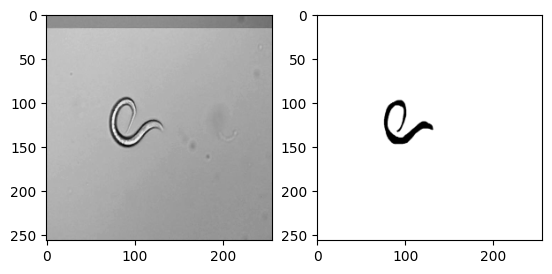

In [9]:
# scale image arrays
# scaling benefits learning process
x_data /= 255
y_data /= 255

# display samples of image and mask in gray scale
fig, ax = plt.subplots(1, 2)
ax[0].imshow(x_data[0].squeeze(), cmap='gray')
ax[1].imshow(y_data[0].squeeze(), cmap='gray')
# ^ since imshow takes 2d array, 3d array is squeezed down to 2d by removing single dimensional entry

In [10]:
# split dataset into train and validation datasets with 20% test portion
x_train, x_val, y_train, y_val = train_test_split(x_data, y_data, test_size=0.2)

In [11]:
print(x_train.shape)
print(x_val.shape)


(120, 256, 256, 1)
(30, 256, 256, 1)


In [12]:
inputs = Input(shape=(256, 256, 1))

# encoding
net = Conv2D(32, kernel_size=3, activation='relu', padding='same')(inputs)
net = MaxPooling2D(pool_size=2, padding='same')(net)
net = Conv2D(64, kernel_size=3, activation='relu', padding='same')(net)
net = MaxPooling2D(pool_size=2, padding='same')(net)
net = Conv2D(128, kernel_size=3, activation='relu', padding='same')(net)
net = MaxPooling2D(pool_size=2, padding='same')(net)

net = Dense(128, activation='relu')(net)

# decoding
net = UpSampling2D(size=2)(net)
net = Conv2D(128, kernel_size=3, activation='sigmoid', padding='same')(net)
net = UpSampling2D(size=2)(net)
net = Conv2D(64, kernel_size=3, activation='sigmoid', padding='same')(net)
net = UpSampling2D(size=2)(net)

# output with 1 channel for gray scale segmentation
outputs = Conv2D(1, kernel_size=3, activation='sigmoid', padding='same')(net)


model = Model(inputs=inputs, outputs=outputs)
# use binary cross entropy with sigmoid function
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['acc', 'mse'])

model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 256, 256, 1)]     0         
                                                                 
 conv2d (Conv2D)             (None, 256, 256, 32)      320       
                                                                 
 max_pooling2d (MaxPooling2  (None, 128, 128, 32)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 128, 128, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 64, 64, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 64, 64, 128)       73856 

In [13]:
# reduce learning rate when not improving
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=10, verbose=1, min_lr=1e-05)

# train model
history = model.fit(x_train, y_train, validation_data=(x_val, y_val), epochs=100, batch_size=32, callbacks=[reduce_lr])

Epoch 1/100
4/4 [==============================] - 26s 3s/step - loss: 0.1773 - acc: 0.9675 - mse: 0.0374 - val_loss: 0.1030 - val_acc: 0.9707 - val_mse: 0.0184 - lr: 0.0010
Epoch 2/100
4/4 [==============================] - 1s 198ms/step - loss: 0.1227 - acc: 0.9675 - mse: 0.0212 - val_loss: 0.1144 - val_acc: 0.9707 - val_mse: 0.0184 - lr: 0.0010
Epoch 3/100
4/4 [==============================] - 1s 232ms/step - loss: 0.1313 - acc: 0.9675 - mse: 0.0212 - val_loss: 0.1147 - val_acc: 0.9707 - val_mse: 0.0184 - lr: 0.0010
Epoch 4/100
4/4 [==============================] - 1s 205ms/step - loss: 0.1285 - acc: 0.9675 - mse: 0.0212 - val_loss: 0.1069 - val_acc: 0.9707 - val_mse: 0.0184 - lr: 0.0010
Epoch 5/100
4/4 [==============================] - 1s 211ms/step - loss: 0.1154 - acc: 0.9675 - mse: 0.0211 - val_loss: 0.0979 - val_acc: 0.9707 - val_mse: 0.0183 - lr: 0.0010
Epoch 6/100
4/4 [==============================] - 1s 204ms/step - loss: 0.1095 - acc: 0.9675 - mse: 0.0211 - val_loss: 0.

In [14]:
# save model
model.save('/content/drive/MyDrive/image_segmentation.model')


In [15]:
print("Train shape:",x_train.shape, "Test shape:",y_train.shape )

Train shape: (120, 256, 256, 1) Test shape: (120, 256, 256, 1)


Text(0.5, 0, 'epoch')

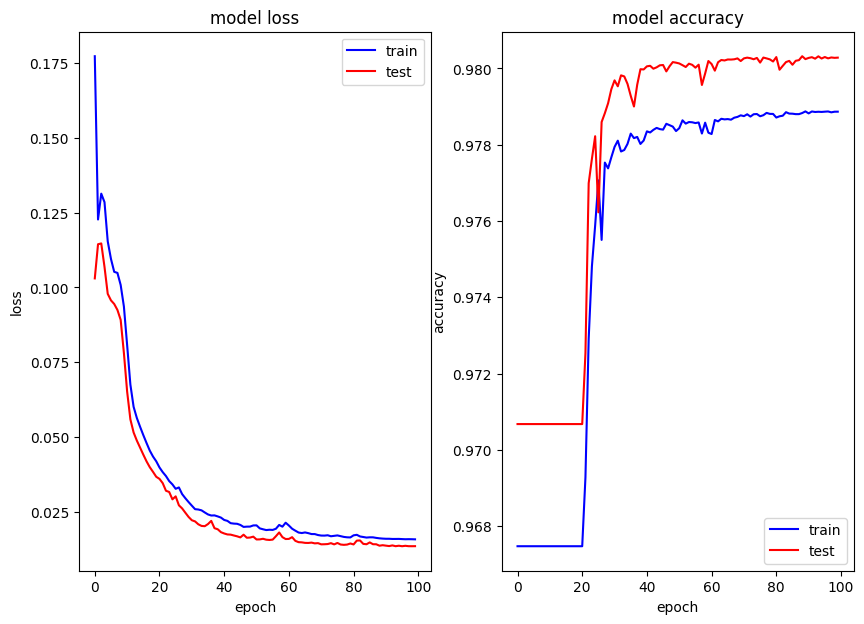

In [16]:
fig, ax = plt.subplots(1, 2, figsize=(10, 7))

# loss
ax[0].set_title('model loss')
ax[0].plot(history.history['loss'], 'b')
ax[0].plot(history.history['val_loss'], 'r')
ax[0].legend(['train', 'test'], loc='upper right')
ax[0].set_ylabel('loss')
ax[0].set_xlabel('epoch')

# accuracy
ax[1].set_title('model accuracy')
ax[1].plot(history.history['acc'], 'b')
ax[1].plot(history.history['val_acc'], 'r')
ax[1].legend(['train', 'test'], loc='lower right')
ax[1].set_ylabel('accuracy')
ax[1].set_xlabel('epoch')

In [17]:
# Predict segmentation
preds = model.predict(x_val)
print("Shape of preds:", preds.shape)
#print("Sample Prediction (first image):\n", preds[0])

print("type of preds", type(preds))
print("type of y_train", type(y_train))
print("type of x_train", type(x_train))
print("type of x_val", type(x_val), 'shape of x_val', x_val.shape)


1/1 [==============================] - 0s 264ms/step
Shape of preds: (30, 256, 256, 1)
type of preds <class 'numpy.ndarray'>
type of y_train <class 'numpy.ndarray'>
type of x_train <class 'numpy.ndarray'>
type of x_val <class 'numpy.ndarray'> shape of x_val (30, 256, 256, 1)


In [18]:
num_images_to_display = min(len(x_val), len(preds))

for i in range(num_images_to_display):
    print(f"Prediction for image {i}:")
    print(preds[i])

Prediction for image 0:
[[[0.9826805 ]
  [0.9955883 ]
  [0.9962345 ]
  ...
  [0.9960664 ]
  [0.995602  ]
  [0.96676874]]

 [[0.99520314]
  [0.9997646 ]
  [0.9998049 ]
  ...
  [0.9998041 ]
  [0.99977523]
  [0.9977398 ]]

 [[0.9958133 ]
  [0.99979335]
  [0.99981934]
  ...
  [0.9998223 ]
  [0.99980396]
  [0.99795365]]

 ...

 [[0.9956377 ]
  [0.9997936 ]
  [0.9998204 ]
  ...
  [0.9998367 ]
  [0.99982697]
  [0.9982285 ]]

 [[0.9947384 ]
  [0.9997515 ]
  [0.9997991 ]
  ...
  [0.9998253 ]
  [0.9998086 ]
  [0.9981061 ]]

 [[0.96290046]
  [0.9965585 ]
  [0.9971873 ]
  ...
  [0.99759513]
  [0.9973871 ]
  [0.9866736 ]]]
Prediction for image 1:
[[[0.9830036 ]
  [0.9956766 ]
  [0.9962859 ]
  ...
  [0.9960414 ]
  [0.9955657 ]
  [0.9665491 ]]

 [[0.9953069 ]
  [0.9997707 ]
  [0.99980825]
  ...
  [0.99980277]
  [0.9997732 ]
  [0.9977198 ]]

 [[0.9958846 ]
  [0.9997975 ]
  [0.9998217 ]
  ...
  [0.9998216 ]
  [0.99980277]
  [0.99794   ]]

 ...

 [[0.99563664]
  [0.99979347]
  [0.9998203 ]
  ...
  [0.99

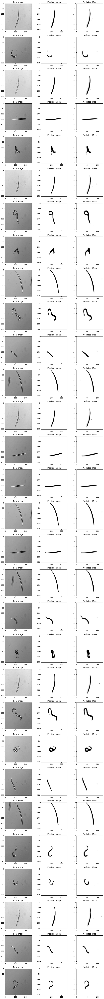

In [19]:
import matplotlib.pyplot as plt
num_images_to_display = min(len(x_val), len(y_val), len(preds))
#threshold = 0.1

# Create a figure with subplots
fig, ax = plt.subplots(num_images_to_display, 3, figsize=(10, 3 * num_images_to_display))

for i in range(num_images_to_display):
    # Display the raw image
    ax[i, 0].imshow(x_val[i].squeeze(), cmap='gray')
    ax[i, 0].set_title('Raw Image')

    # Display the masked image
    ax[i, 1].imshow(y_val[i].squeeze(), cmap='gray')
    ax[i, 1].set_title('Masked Image')

    # Display the predicted segmentation

    #binary_mask = (preds[i] > threshold).astype(np.uint8)

  # Display the binary mask
    ax[i, 2].imshow(preds[i].squeeze(), cmap='gray')
    #for j in range(len(preds[i])):
    #  print(preds[j][0])
    ax[i, 2].set_title('Predicted  Mask')

    #print(x_val[i].shape, y_val[i].shape, preds[i].shape)

# Adjust spacing between subplots
plt.tight_layout()
plt.show()


In [20]:
num_images_to_display = min(len(x_val), len(preds))

for i in range(num_images_to_display):
    print(f"Prediction for image {i}:")
    print(preds[i])

Prediction for image 0:
[[[0.9826805 ]
  [0.9955883 ]
  [0.9962345 ]
  ...
  [0.9960664 ]
  [0.995602  ]
  [0.96676874]]

 [[0.99520314]
  [0.9997646 ]
  [0.9998049 ]
  ...
  [0.9998041 ]
  [0.99977523]
  [0.9977398 ]]

 [[0.9958133 ]
  [0.99979335]
  [0.99981934]
  ...
  [0.9998223 ]
  [0.99980396]
  [0.99795365]]

 ...

 [[0.9956377 ]
  [0.9997936 ]
  [0.9998204 ]
  ...
  [0.9998367 ]
  [0.99982697]
  [0.9982285 ]]

 [[0.9947384 ]
  [0.9997515 ]
  [0.9997991 ]
  ...
  [0.9998253 ]
  [0.9998086 ]
  [0.9981061 ]]

 [[0.96290046]
  [0.9965585 ]
  [0.9971873 ]
  ...
  [0.99759513]
  [0.9973871 ]
  [0.9866736 ]]]
Prediction for image 1:
[[[0.9830036 ]
  [0.9956766 ]
  [0.9962859 ]
  ...
  [0.9960414 ]
  [0.9955657 ]
  [0.9665491 ]]

 [[0.9953069 ]
  [0.9997707 ]
  [0.99980825]
  ...
  [0.99980277]
  [0.9997732 ]
  [0.9977198 ]]

 [[0.9958846 ]
  [0.9997975 ]
  [0.9998217 ]
  ...
  [0.9998216 ]
  [0.99980277]
  [0.99794   ]]

 ...

 [[0.99563664]
  [0.99979347]
  [0.9998203 ]
  ...
  [0.99

In [21]:
import numpy as np

# Flatten the image to a 1D array
preds_flat = preds[0].ravel()

# Calculate the minimum and maximum values
min_value = np.min(preds_flat)
max_value = np.max(preds_flat)

print(f"Minimum value: {min_value}")
print(f"Maximum value: {max_value}")


Minimum value: 0.05722375586628914
Maximum value: 0.9998519420623779


In [22]:
#plt.imshow(preds[0].squeeze(), cmap='gray', vmin=0, vmax=1)


In [23]:
import numpy as np

def calculate_iou(groundtruth_mask, pred_mask):
    intersect = np.sum(pred_mask*groundtruth_mask)
    union = np.sum(pred_mask) + np.sum(groundtruth_mask)- intersect
    iou= np.mean(intersect/union)
    return round(iou,3)

In [24]:


# Initialize a list to store IoU values for each prediction
iou_values = []

# Iterate over the predictions and ground truth
for i in range(len(y_val)):
    iou = calculate_iou(y_val[i], preds[i])
    iou_values.append(iou)

# Calculate the average IoU
average_iou = np.mean(iou_values)

print("Average IoU:", average_iou)


Average IoU: 0.9911


In [25]:
def calculate_dice_coefficient(pred_mask,groundtruth_mask):
  intersect = np.sum(pred_mask*groundtruth_mask)
  tot_sum = np.sum(pred_mask) + np.sum(groundtruth_mask)
  dice = np.mean(2*intersect/tot_sum)
  return round(dice,3)


In [26]:
# Initialize a list to store Dice Coefficient values for each prediction
dice_coefficient_values = []

# Iterate over the predictions and ground truth
for i in range(len(y_val)):
    dice_coefficient = calculate_dice_coefficient(y_val[i], preds[i])
    dice_coefficient_values.append(dice_coefficient)

# Calculate the average Dice Coefficient
average_dice_coefficient = np.mean(dice_coefficient_values)

print("Average Dice Coefficient:", average_dice_coefficient)


Average Dice Coefficient: 0.9955666666666666


Accuracy/Rand Index

In [27]:
def accuracy(groundtruth_mask, pred_mask):
    intersect = np.sum(pred_mask*groundtruth_mask)
    union = np.sum(pred_mask) + np.sum(groundtruth_mask) - intersect
    xor = np.sum(groundtruth_mask==pred_mask)
    acc = np.mean(xor/(union + xor - intersect))
    return round(acc, 3)

In [28]:

accuracy_values = []

# Iterate over the predictions and ground truth
for i in range(len(y_val)):
    acc = accuracy(y_val[i], preds[i])
    print("accuracy at i:", acc)
    accuracy_values.append(acc)

#Calculate the average accuracy
average_accuracy = np.mean(accuracy_values)

print("Average Accuracy:", average_accuracy)


accuracy at i: 0.0
accuracy at i: 0.0
accuracy at i: 0.0
accuracy at i: 0.0
accuracy at i: 0.0
accuracy at i: 0.0
accuracy at i: 0.0
accuracy at i: 0.0
accuracy at i: 0.0
accuracy at i: 0.0
accuracy at i: 0.0
accuracy at i: 0.0
accuracy at i: 0.0
accuracy at i: 0.0
accuracy at i: 0.0
accuracy at i: 0.0
accuracy at i: 0.0
accuracy at i: 0.0
accuracy at i: 0.0
accuracy at i: 0.0
accuracy at i: 0.0
accuracy at i: 0.0
accuracy at i: 0.0
accuracy at i: 0.0
accuracy at i: 0.0
accuracy at i: 0.0
accuracy at i: 0.0
accuracy at i: 0.0
accuracy at i: 0.0
accuracy at i: 0.0
Average Accuracy: 0.0


In [29]:
def precision_score(groundtruth_mask, pred_mask):
    intersect = np.sum(pred_mask*groundtruth_mask)
    total_pixel_pred = np.sum(pred_mask)
    precision = np.mean(intersect/total_pixel_pred)
    return round(precision, 3)

In [30]:


precision_values = []

# Iterate over the predictions and ground truth
for i in range(len(y_val)):
    prec = precision_score(preds[i],y_val[i])
    precision_values.append(prec)

#Calculate the average precision
average_precision = np.mean(precision_values)

print("Average Precision:", average_precision)
print("Size of :", len(precision_values))

Average Precision: 0.99500006
Size of : 30


In [31]:
def recall_score(groundtruth_mask, pred_mask):
    intersect = np.sum(pred_mask*groundtruth_mask)
    total_pixel_truth = np.sum(groundtruth_mask)
    recall = np.mean(intersect/total_pixel_truth)
    return round(recall, 3)

In [32]:

recall_values = []

# Iterate over the predictions and ground truth
for i in range(len(y_val)):
    rec = recall_score(preds[i],y_val[i])
    recall_values.append(rec)

#Calculate the average recall
average_recall = np.mean(recall_values)

print("Average Recall:", average_recall)
print("Size of :", len(recall_values))


Average Recall: 0.9960999
Size of : 30


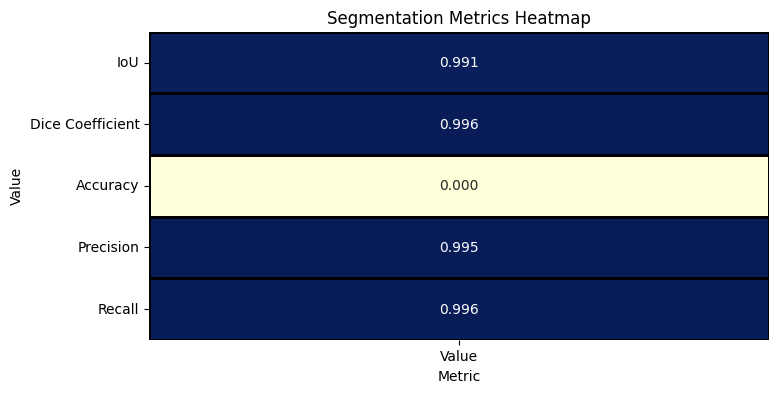

In [33]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Create a dictionary with metric values
metrics = {
    'IoU': average_iou,
    'Dice Coefficient': average_dice_coefficient,
    'Accuracy': average_accuracy,
    'Precision': average_precision,
    'Recall': average_recall
}

# Convert the dictionary to a DataFrame
df = pd.DataFrame.from_dict(metrics, orient='index', columns=['Value'])

# Create a heatmap
plt.figure(figsize=(8, 4))
sns.heatmap(df, annot=True, cmap="YlGnBu", cbar=False, fmt='0.3f', linewidths=1, linecolor='black')
plt.title("Segmentation Metrics Heatmap")
plt.xlabel("Metric")
plt.ylabel("Value")
plt.show()


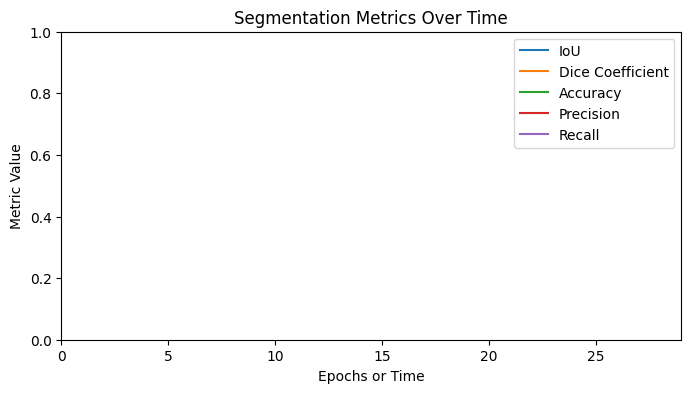

In [34]:
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

# Assuming you have lists of metric values over different epochs or time points
epochs = range(len(iou_values))  # You may use the actual x-axis values

# Initialize the figure and axis
fig, ax = plt.subplots(figsize=(8, 4))
ax.set_xlim(epochs[0], epochs[-1])
ax.set_ylim(0, 1)  # Adjust the y-axis limits based on your metrics

# Initialize line objects for each metric
iou_line, = ax.plot([], [], label="IoU")
dice_line, = ax.plot([], [], label="Dice Coefficient")
accuracy_line, = ax.plot([], [], label="Accuracy")
precision_line, = ax.plot([], [], label="Precision")
recall_line, = ax.plot([], [], label="Recall")

# Function to update the lines for animation
def update(frame):
    iou_line.set_data(epochs[:frame], iou_values[:frame])
    dice_line.set_data(epochs[:frame], dice_coefficient_values[:frame])
    accuracy_line.set_data(epochs[:frame], accuracy_values[:frame])
    precision_line.set_data(epochs[:frame], precision_values[:frame])
    recall_line.set_data(epochs[:frame], recall_values[:frame])
    return iou_line, dice_line, accuracy_line, precision_line, recall_line

# Set labels and legend
ax.set_xlabel("Epochs or Time")
ax.set_ylabel("Metric Value")
ax.set_title("Segmentation Metrics Over Time")
ax.legend(loc='upper right')

# Create the animation
animation = FuncAnimation(fig, update, frames=len(epochs), repeat=False)

# Display the animation (can be saved to a file as well)
plt.show()


In [35]:
def highlight(row):
    df = lambda x: ['background: #CCCCFF' if x.name in row
                        else '' for i in x]
    return df

def metrics_table(gt_masks, pred_masks):
    metrics = {'Precision':[],'Recall':[],'Accuracy':[],'Dice':[],'IoU':[]}
    for i, (mask, pred) in enumerate(zip(gt_masks, pred_masks)):
        metrics['Precision'].append(precision_score(mask, pred))
        metrics['Recall'].append(recall_score(mask, pred))
        metrics['Accuracy'].append(accuracy(mask, pred))
        metrics['Dice'].append(calculate_dice_coefficient(mask, pred))
        metrics['IoU'].append(calculate_iou(mask, pred))
    df = pd.DataFrame.from_dict(metrics)
    df.columns = ['Precision', 'Recall', 'Accuracy', 'Dice', 'IoU']
    return df

In [36]:
metrics_table(y_val[3],preds[3])

,Precision,Recall,Accuracy,Dice,IoU
0,1.0,0.996,0.0,0.998,0.996
1,1.0,1.000,0.0,1.000,1.000
2,1.0,1.000,0.0,1.000,1.000
3,1.0,1.000,0.0,1.000,1.000
4,1.0,1.000,0.0,1.000,1.000
...,...,...,...,...,...
251,1.0,1.000,0.0,1.000,1.000
252,1.0,1.000,0.0,1.000,1.000
253,1.0,1.000,0.0,1.000,1.000
254,1.0,1.000,0.0,1.000,1.000


In [37]:
for i, val in enumerate(accuracy_values):
    print(f"Accuracy for epoch {i + 1}: {val}")


Accuracy for epoch 1: 0.0
Accuracy for epoch 2: 0.0
Accuracy for epoch 3: 0.0
Accuracy for epoch 4: 0.0
Accuracy for epoch 5: 0.0
Accuracy for epoch 6: 0.0
Accuracy for epoch 7: 0.0
Accuracy for epoch 8: 0.0
Accuracy for epoch 9: 0.0
Accuracy for epoch 10: 0.0
Accuracy for epoch 11: 0.0
Accuracy for epoch 12: 0.0
Accuracy for epoch 13: 0.0
Accuracy for epoch 14: 0.0
Accuracy for epoch 15: 0.0
Accuracy for epoch 16: 0.0
Accuracy for epoch 17: 0.0
Accuracy for epoch 18: 0.0
Accuracy for epoch 19: 0.0
Accuracy for epoch 20: 0.0
Accuracy for epoch 21: 0.0
Accuracy for epoch 22: 0.0
Accuracy for epoch 23: 0.0
Accuracy for epoch 24: 0.0
Accuracy for epoch 25: 0.0
Accuracy for epoch 26: 0.0
Accuracy for epoch 27: 0.0
Accuracy for epoch 28: 0.0
Accuracy for epoch 29: 0.0
Accuracy for epoch 30: 0.0


/usr/local/lib/python3.10/dist-packages/matplotlib/animation.py:884: UserWarning: Animation was deleted without rendering anything. This is most likely not intended. To prevent deletion, assign the Animation to a variable, e.g. `anim`, that exists until you output the Animation using `plt.show()` or `anim.save()`.
  warnings.warn(


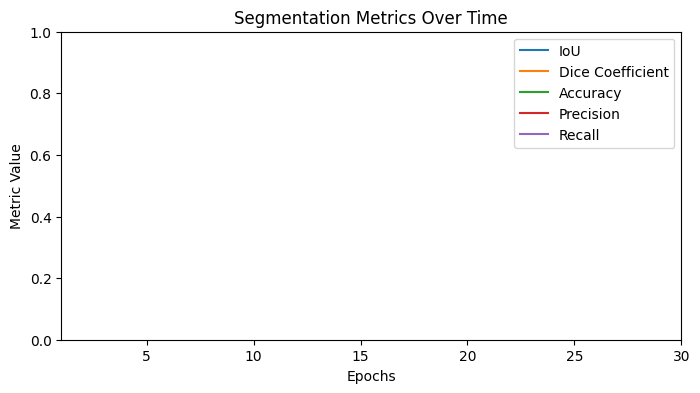

In [38]:
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

# Assuming you have metric values for 100 epochs
epochs = list(range(1, 31))  # Adjust the x-axis values according to your data

# Initialize the figure and axis
fig, ax = plt.subplots(figsize=(8, 4))
ax.set_xlim(epochs[0], epochs[-1])
ax.set_ylim(0, 1)  # Adjust the y-axis limits based on your metrics (0 to 1 for IoU and Dice Coefficient)

# Initialize line objects for each metric
iou_line, = ax.plot([], [], label="IoU")
dice_line, = ax.plot([], [], label="Dice Coefficient")
accuracy_line, = ax.plot([], [], label="Accuracy")
precision_line, = ax.plot([], [], label="Precision")
recall_line, = ax.plot([], [], label="Recall")

# Function to update the lines for animation
def update(frame):
    iou_line.set_data(epochs[:frame], iou_values[:frame])
    dice_line.set_data(epochs[:frame], dice_coefficient_values[:frame])
    accuracy_line.set_data(epochs[:frame], accuracy_values[:frame])
    precision_line.set_data(epochs[:frame], precision_values[:frame])
    recall_line.set_data(epochs[:frame], recall_values[:frame])
    return iou_line, dice_line, accuracy_line, precision_line, recall_line

# Set labels and legend
ax.set_xlabel("Epochs")
ax.set_ylabel("Metric Value")
ax.set_title("Segmentation Metrics Over Time")
ax.legend(loc='upper right')

# Create the animation
animation = FuncAnimation(fig, update, frames=len(epochs), repeat=False)

# Display the animation (can be saved to a file as well)
plt.show()


1/1 [==============================] - 0s 199ms/step


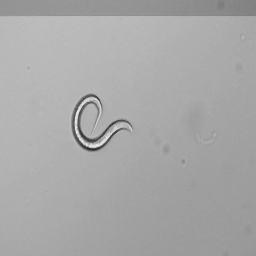

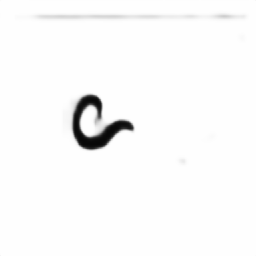

1/1 [==============================] - 0s 33ms/step


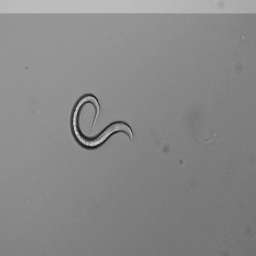

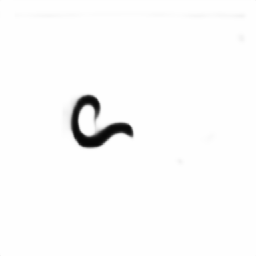

1/1 [==============================] - 0s 36ms/step


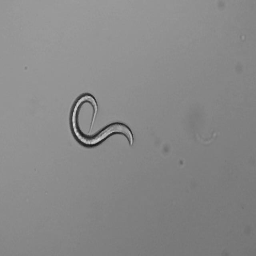

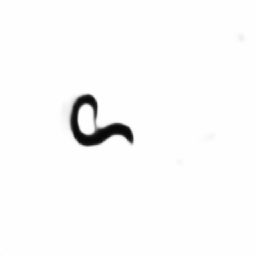

1/1 [==============================] - 0s 28ms/step


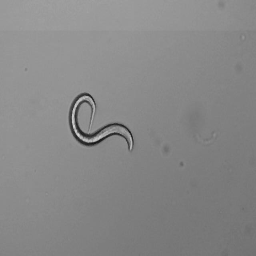

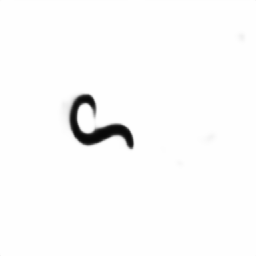

1/1 [==============================] - 0s 46ms/step


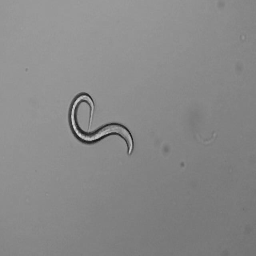

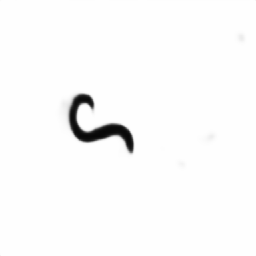

1/1 [==============================] - 0s 31ms/step


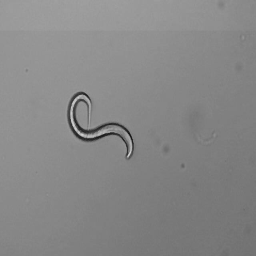

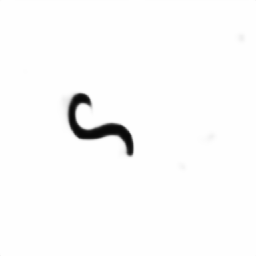

1/1 [==============================] - 0s 29ms/step


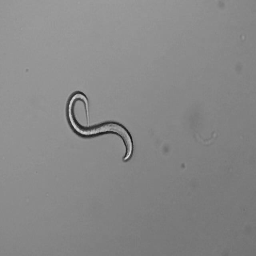

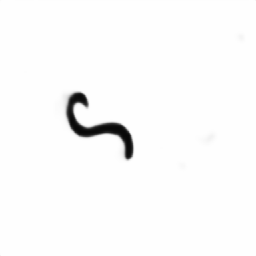

1/1 [==============================] - 0s 30ms/step


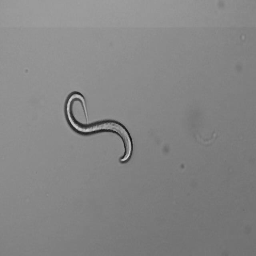

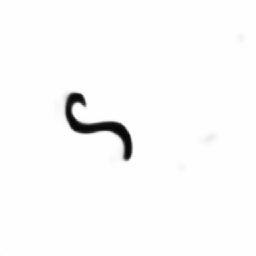

1/1 [==============================] - 0s 31ms/step


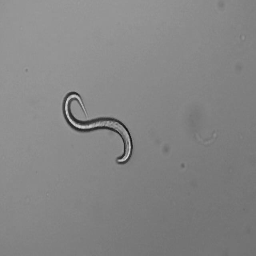

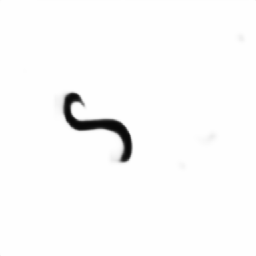

1/1 [==============================] - 0s 31ms/step


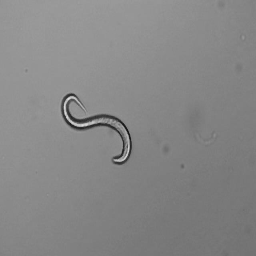

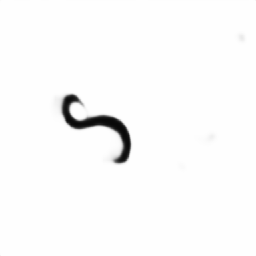

1/1 [==============================] - 0s 31ms/step


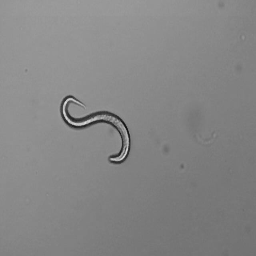

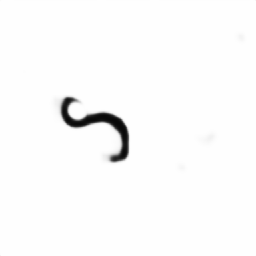

1/1 [==============================] - 0s 31ms/step


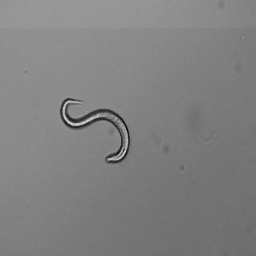

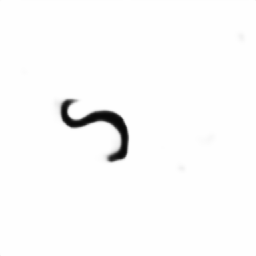

1/1 [==============================] - 0s 37ms/step


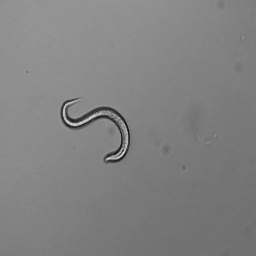

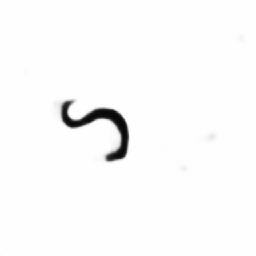

1/1 [==============================] - 0s 39ms/step


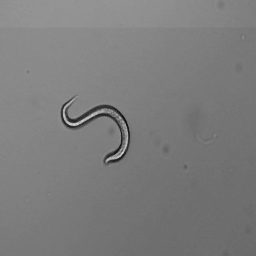

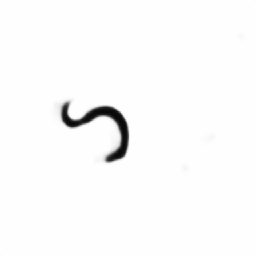

1/1 [==============================] - 0s 35ms/step


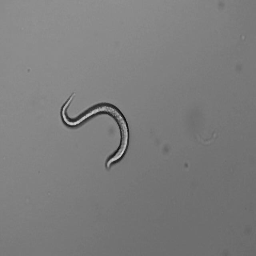

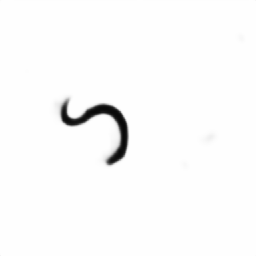

1/1 [==============================] - 0s 31ms/step


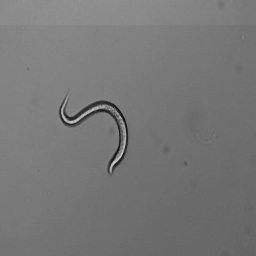

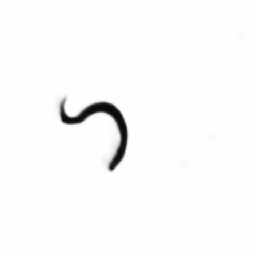

1/1 [==============================] - 0s 41ms/step


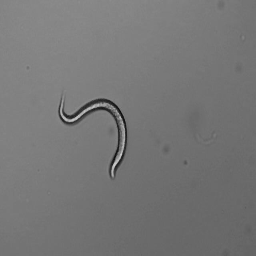

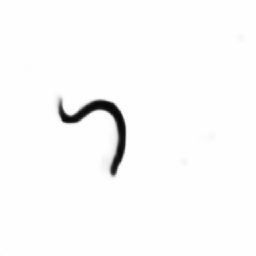

1/1 [==============================] - 0s 28ms/step


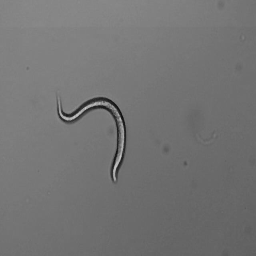

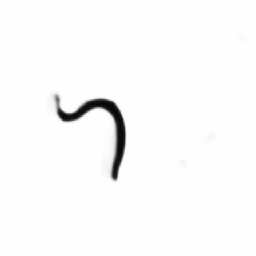

1/1 [==============================] - 0s 31ms/step


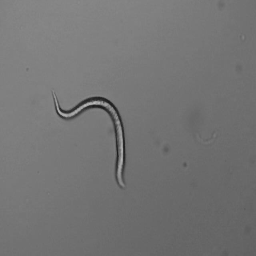

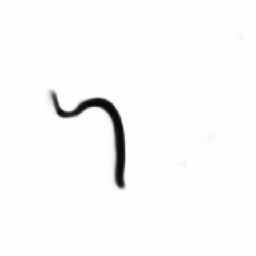

1/1 [==============================] - 0s 30ms/step


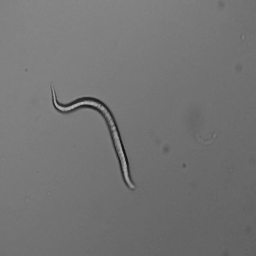

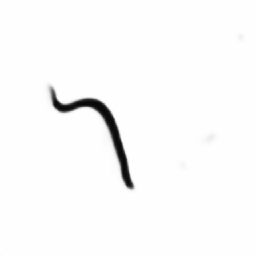

1/1 [==============================] - 0s 28ms/step


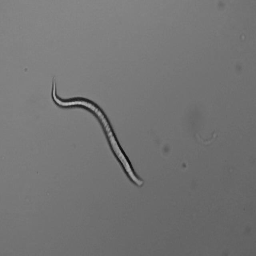

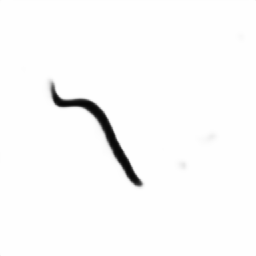

1/1 [==============================] - 0s 44ms/step


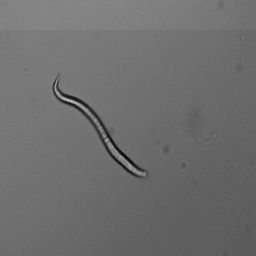

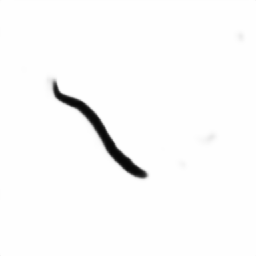

1/1 [==============================] - 0s 32ms/step


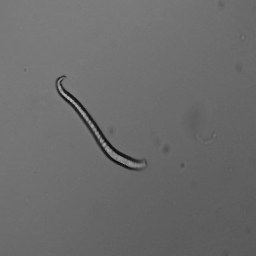

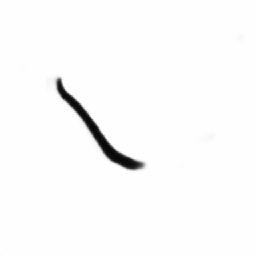

1/1 [==============================] - 0s 29ms/step


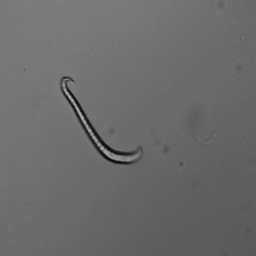

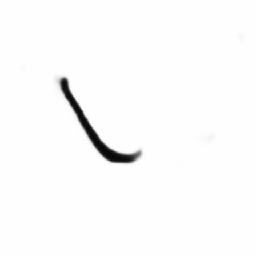

1/1 [==============================] - 0s 43ms/step


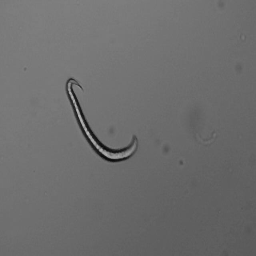

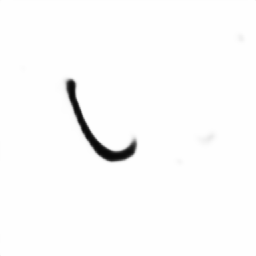

1/1 [==============================] - 0s 38ms/step


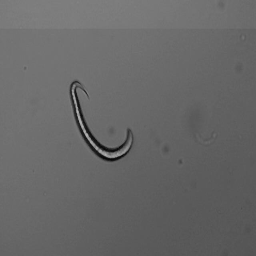

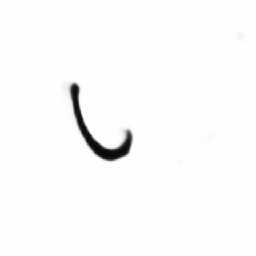

1/1 [==============================] - 0s 50ms/step


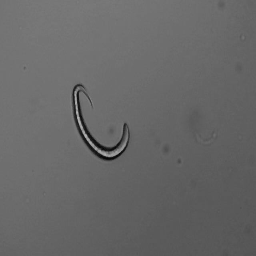

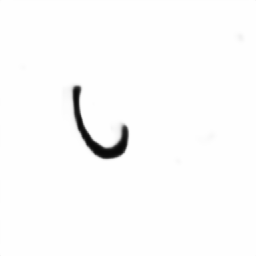

1/1 [==============================] - 0s 30ms/step


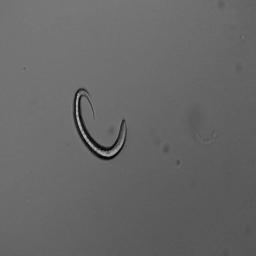

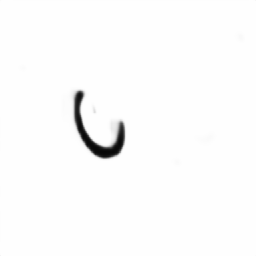

1/1 [==============================] - 0s 49ms/step


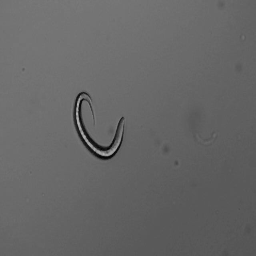

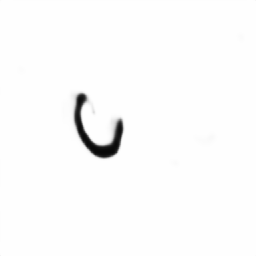

1/1 [==============================] - 0s 44ms/step


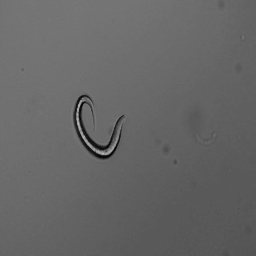

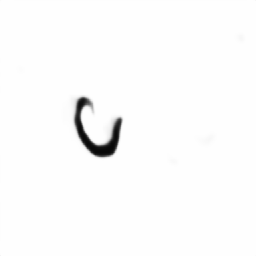

1/1 [==============================] - 0s 26ms/step


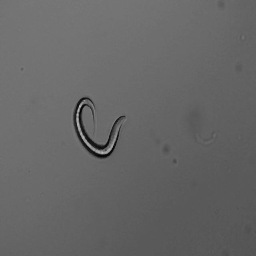

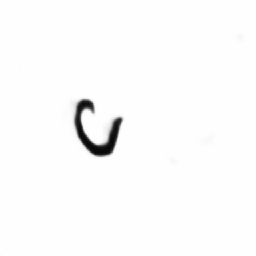

1/1 [==============================] - 0s 24ms/step


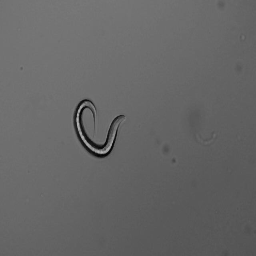

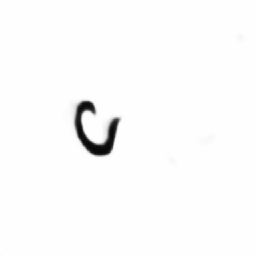

1/1 [==============================] - 0s 22ms/step


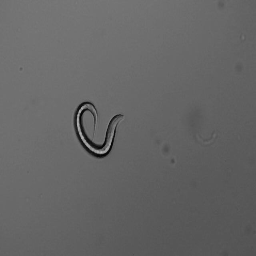

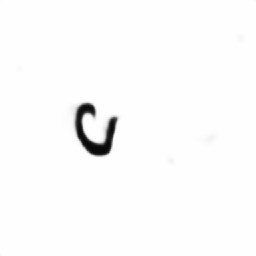

1/1 [==============================] - 0s 20ms/step


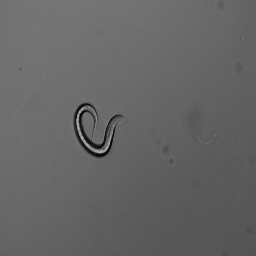

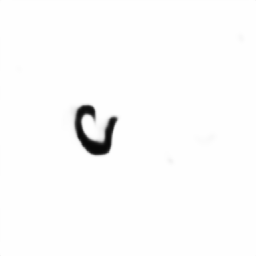

1/1 [==============================] - 0s 20ms/step


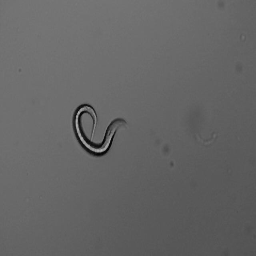

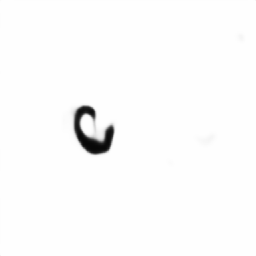

1/1 [==============================] - 0s 20ms/step


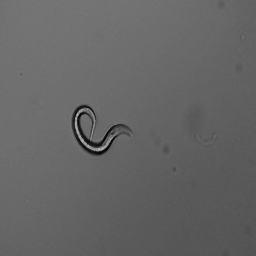

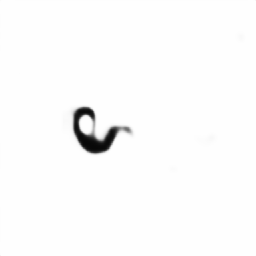

1/1 [==============================] - 0s 21ms/step


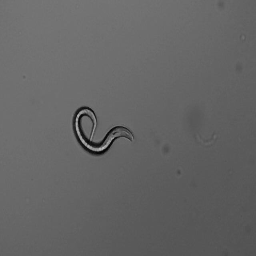

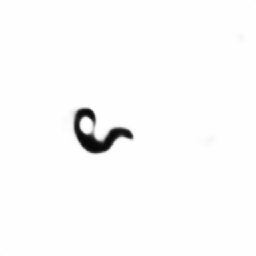

1/1 [==============================] - 0s 26ms/step


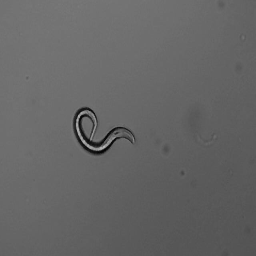

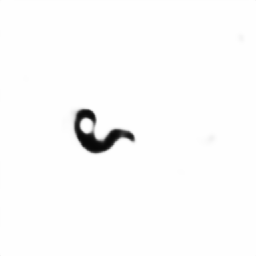

1/1 [==============================] - 0s 22ms/step


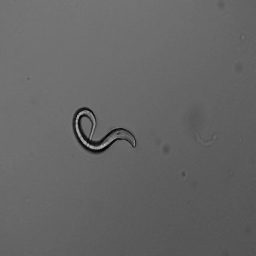

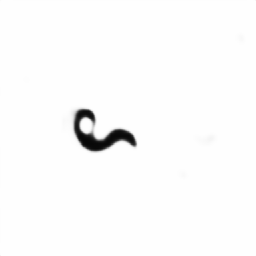

1/1 [==============================] - 0s 21ms/step


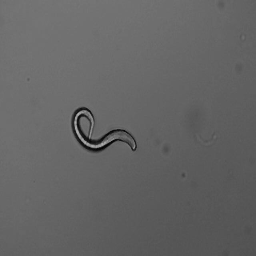

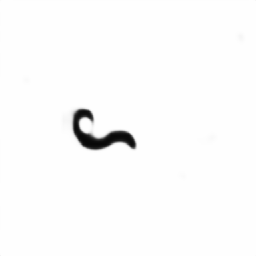

1/1 [==============================] - 0s 24ms/step


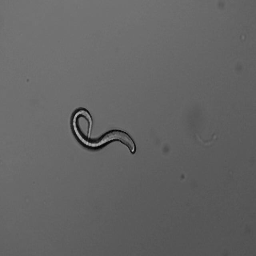

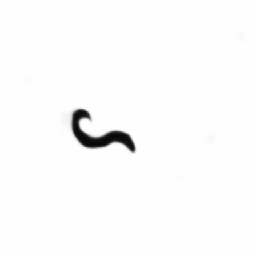

1/1 [==============================] - 0s 28ms/step


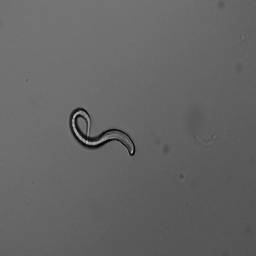

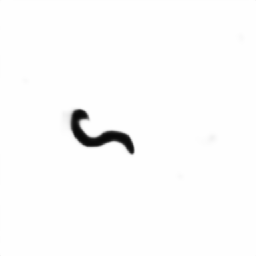

1/1 [==============================] - 0s 27ms/step


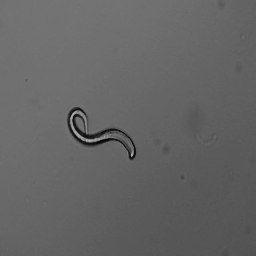

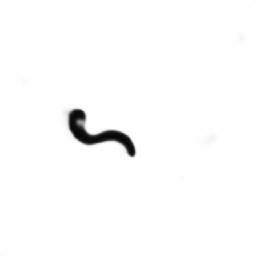

1/1 [==============================] - 0s 30ms/step


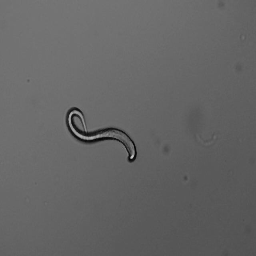

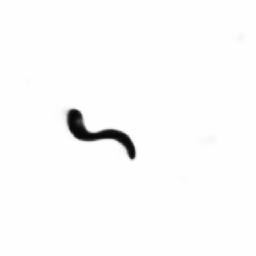

1/1 [==============================] - 0s 40ms/step


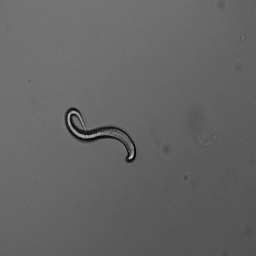

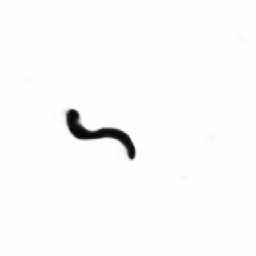

1/1 [==============================] - 0s 28ms/step


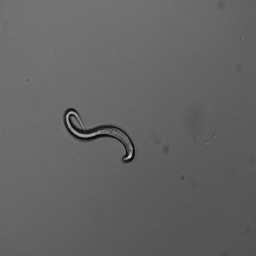

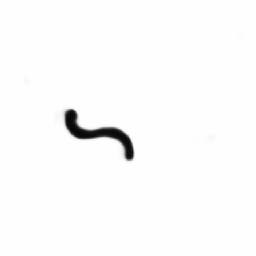

1/1 [==============================] - 0s 30ms/step


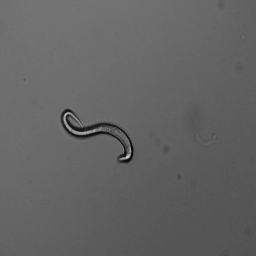

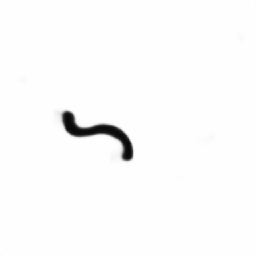

1/1 [==============================] - 0s 29ms/step


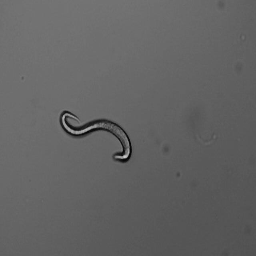

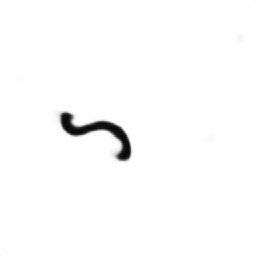

1/1 [==============================] - 0s 29ms/step


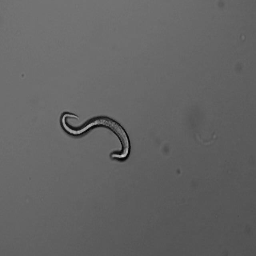

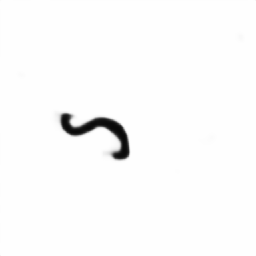

1/1 [==============================] - 0s 29ms/step


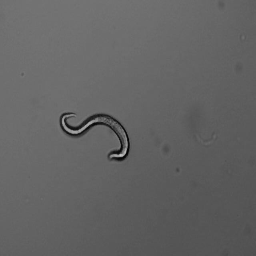

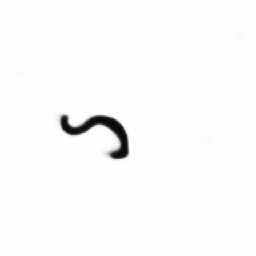

1/1 [==============================] - 0s 30ms/step


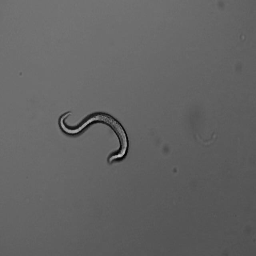

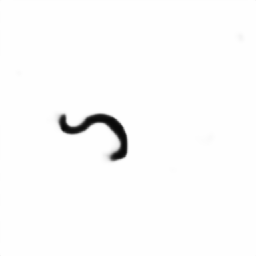

1/1 [==============================] - 0s 27ms/step


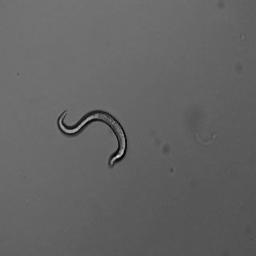

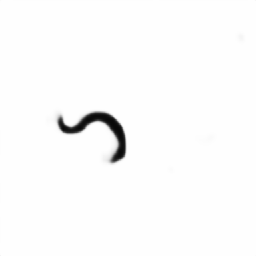

1/1 [==============================] - 0s 28ms/step


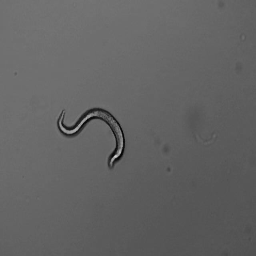

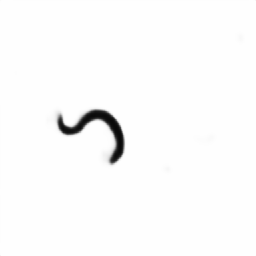

1/1 [==============================] - 0s 36ms/step


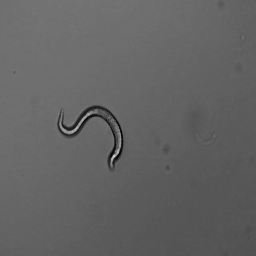

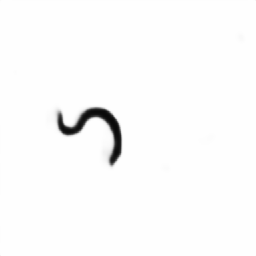

1/1 [==============================] - 0s 30ms/step


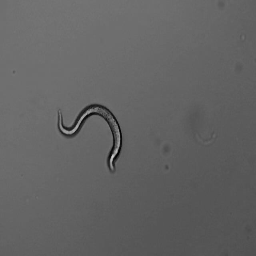

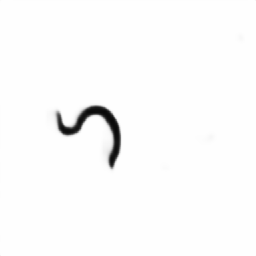

1/1 [==============================] - 0s 30ms/step


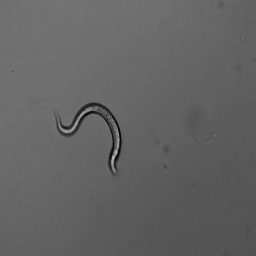

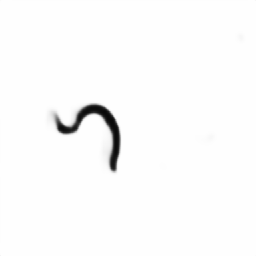

1/1 [==============================] - 0s 30ms/step


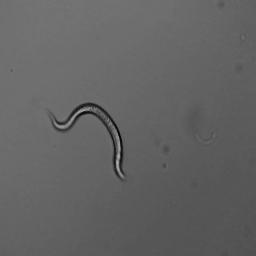

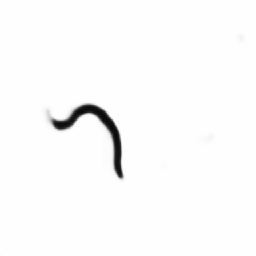

1/1 [==============================] - 0s 28ms/step


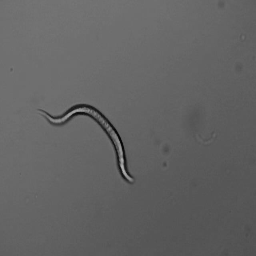

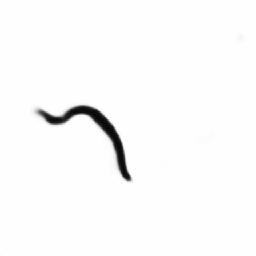

1/1 [==============================] - 0s 28ms/step


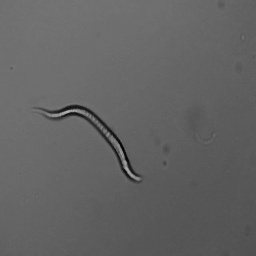

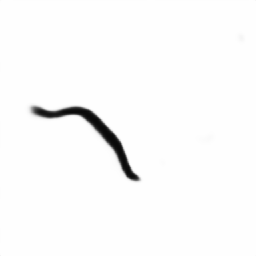

1/1 [==============================] - 0s 34ms/step


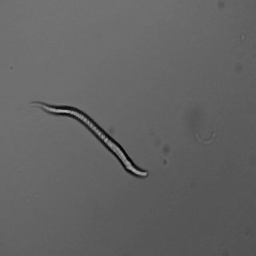

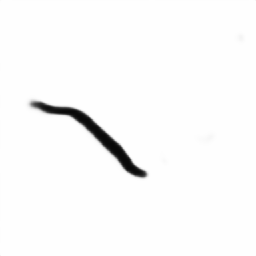

1/1 [==============================] - 0s 36ms/step


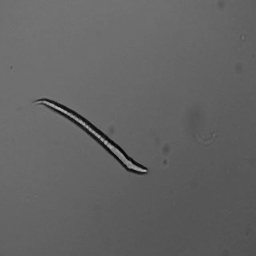

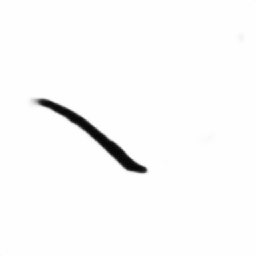

1/1 [==============================] - 0s 37ms/step


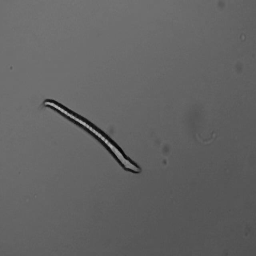

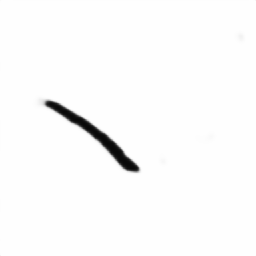

1/1 [==============================] - 0s 32ms/step


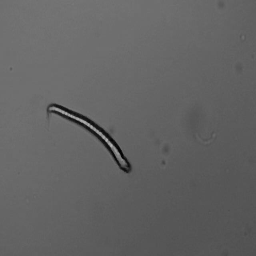

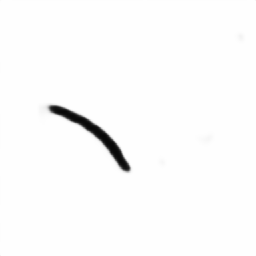

1/1 [==============================] - 0s 31ms/step


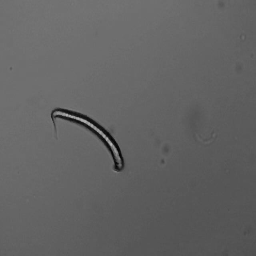

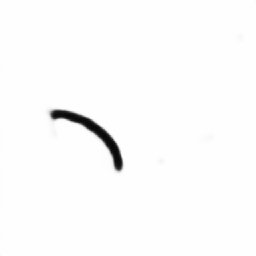

1/1 [==============================] - 0s 30ms/step


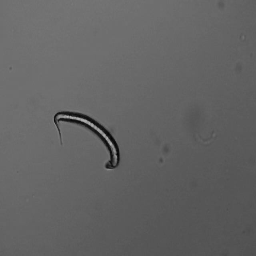

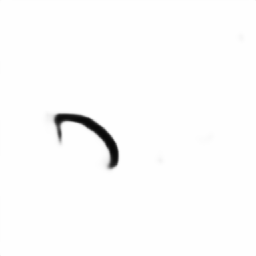

1/1 [==============================] - 0s 32ms/step


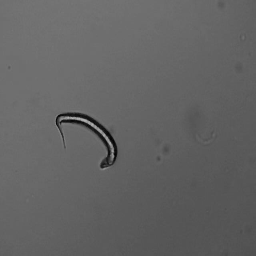

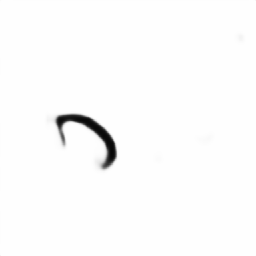

1/1 [==============================] - 0s 29ms/step


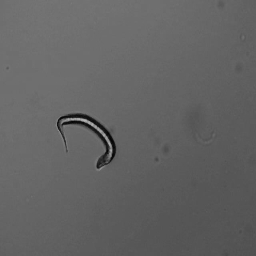

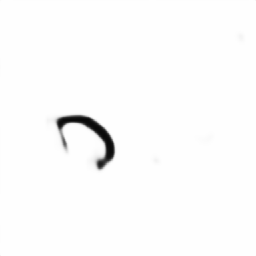

1/1 [==============================] - 0s 29ms/step


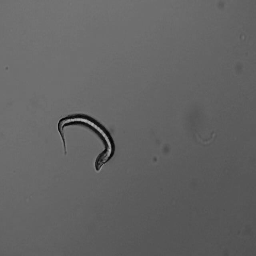

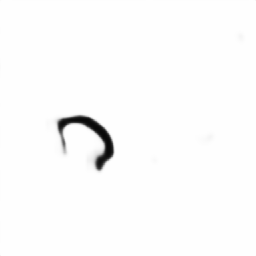

1/1 [==============================] - 0s 33ms/step


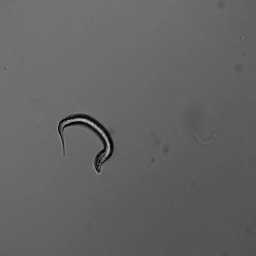

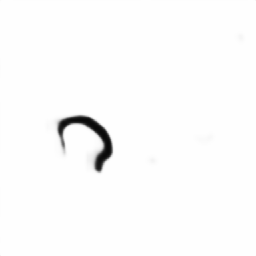

1/1 [==============================] - 0s 31ms/step


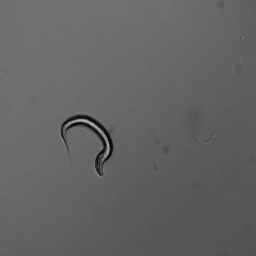

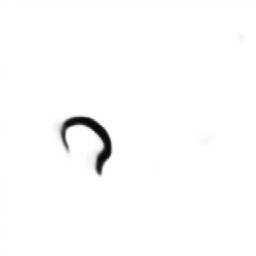

1/1 [==============================] - 0s 32ms/step


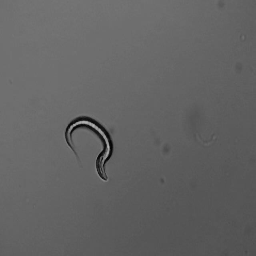

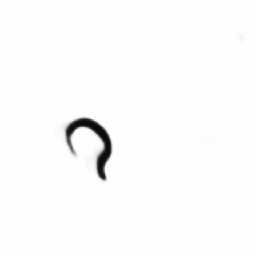

1/1 [==============================] - 0s 29ms/step


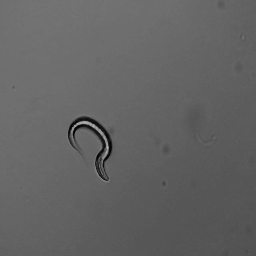

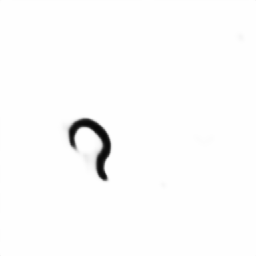

1/1 [==============================] - 0s 28ms/step


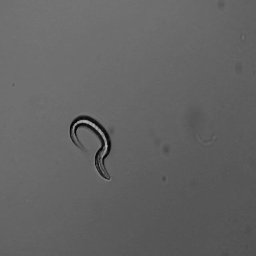

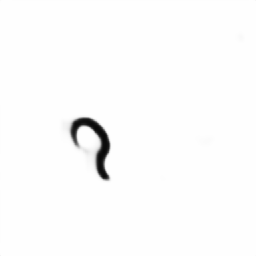

1/1 [==============================] - 0s 40ms/step


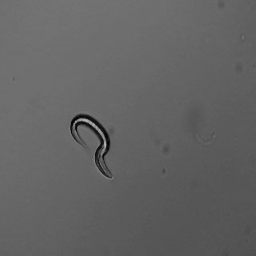

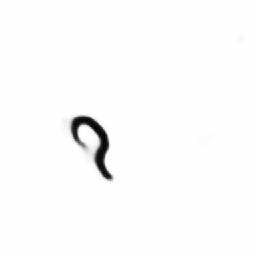

1/1 [==============================] - 0s 28ms/step


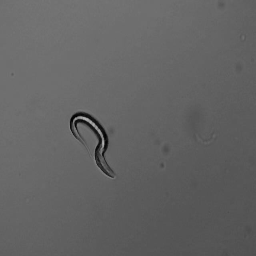

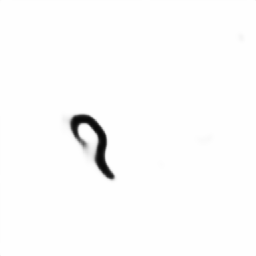

1/1 [==============================] - 0s 38ms/step


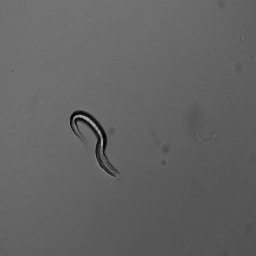

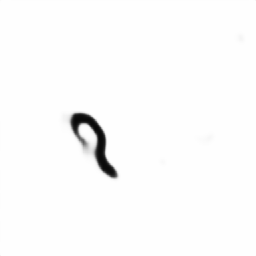

1/1 [==============================] - 0s 28ms/step


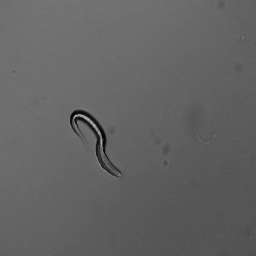

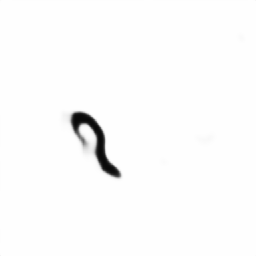

1/1 [==============================] - 0s 29ms/step


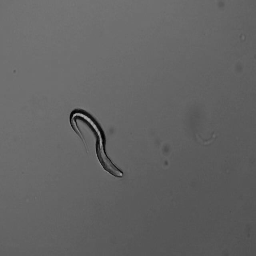

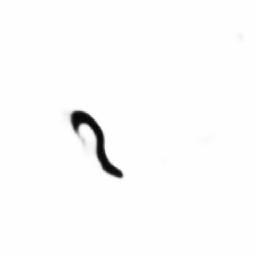

1/1 [==============================] - 0s 29ms/step


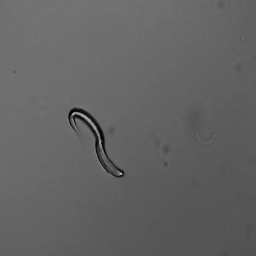

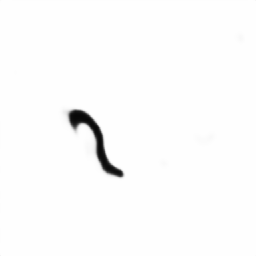

1/1 [==============================] - 0s 29ms/step


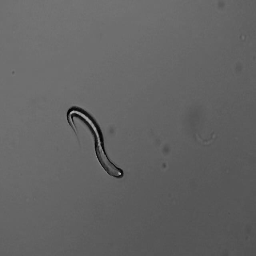

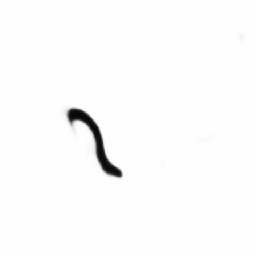

1/1 [==============================] - 0s 31ms/step


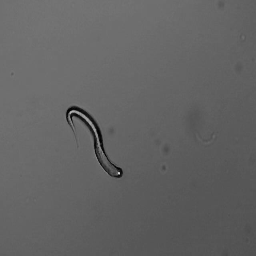

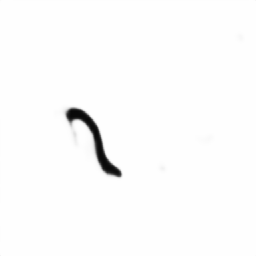

1/1 [==============================] - 0s 28ms/step


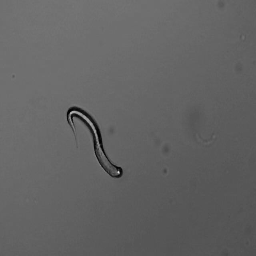

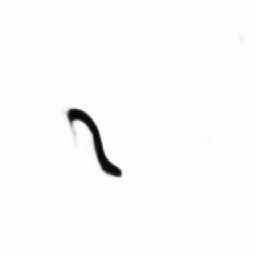

1/1 [==============================] - 0s 27ms/step


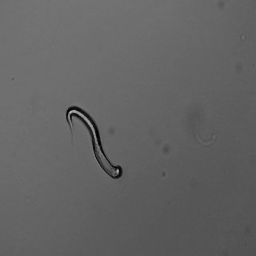

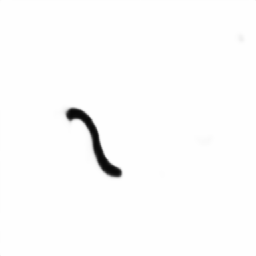

1/1 [==============================] - 0s 34ms/step


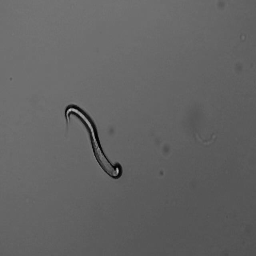

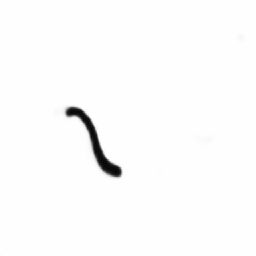

1/1 [==============================] - 0s 28ms/step


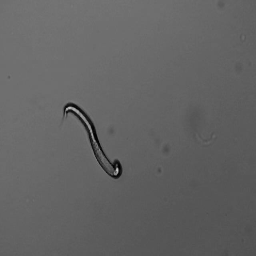

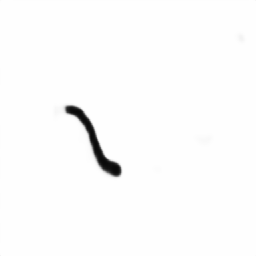

1/1 [==============================] - 0s 28ms/step


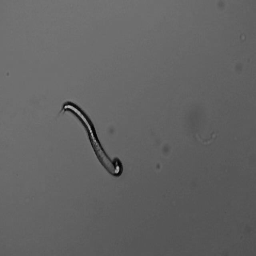

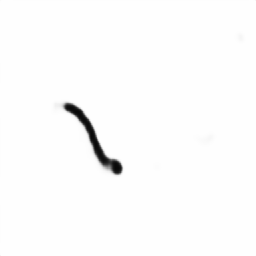

1/1 [==============================] - 0s 37ms/step


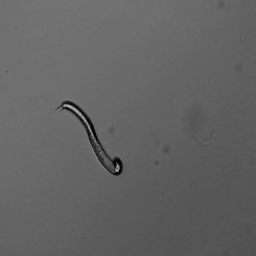

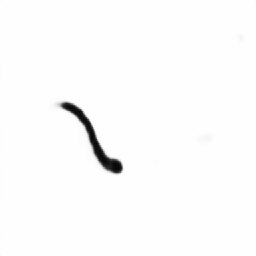

1/1 [==============================] - 0s 29ms/step


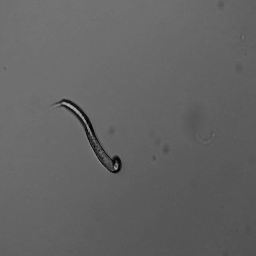

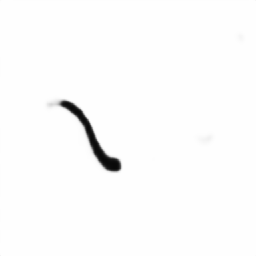

1/1 [==============================] - 0s 37ms/step


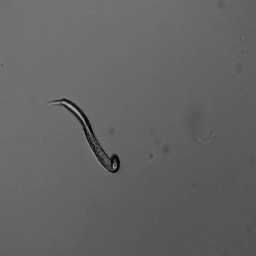

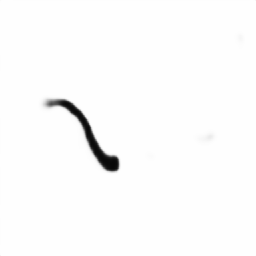

1/1 [==============================] - 0s 35ms/step


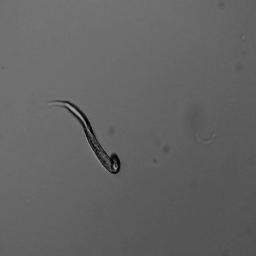

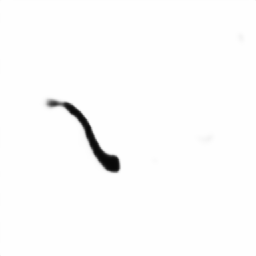

1/1 [==============================] - 0s 27ms/step


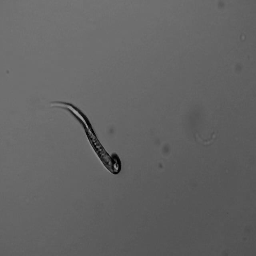

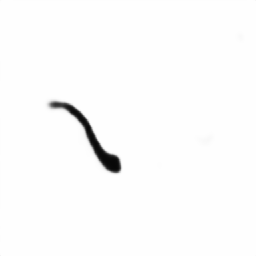

1/1 [==============================] - 0s 27ms/step


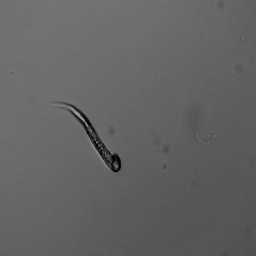

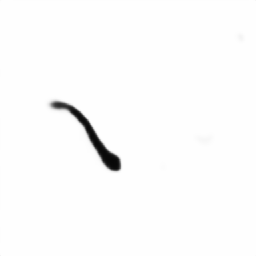

1/1 [==============================] - 0s 30ms/step


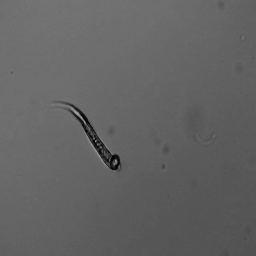

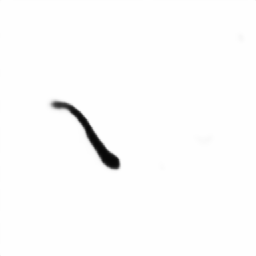

1/1 [==============================] - 0s 30ms/step


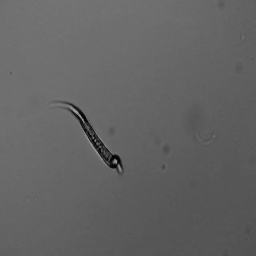

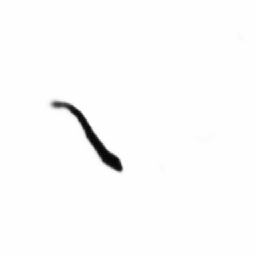

1/1 [==============================] - 0s 29ms/step


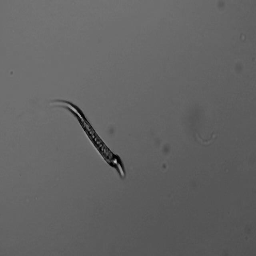

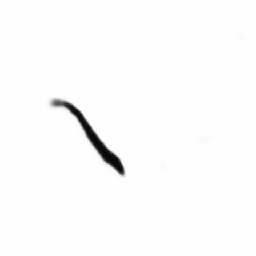

1/1 [==============================] - 0s 30ms/step


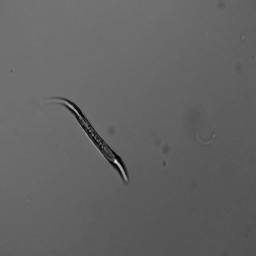

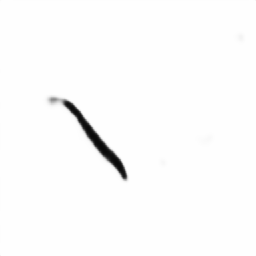

1/1 [==============================] - 0s 29ms/step


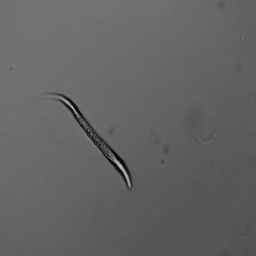

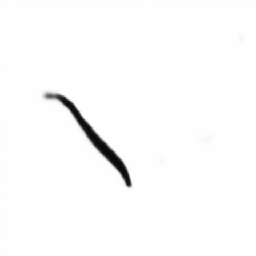

1/1 [==============================] - 0s 27ms/step


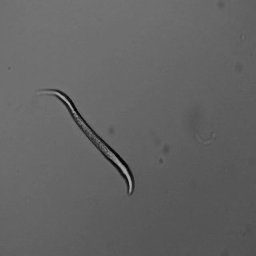

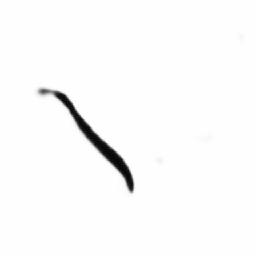

1/1 [==============================] - 0s 28ms/step


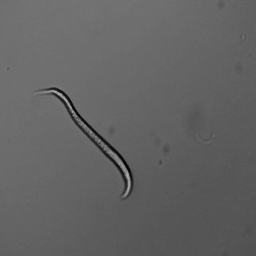

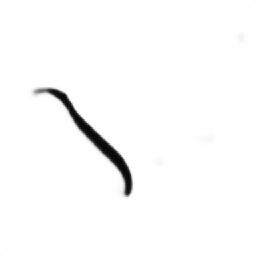

1/1 [==============================] - 0s 28ms/step


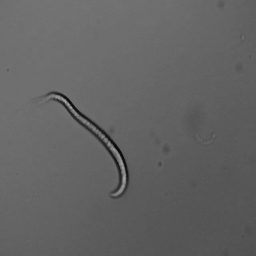

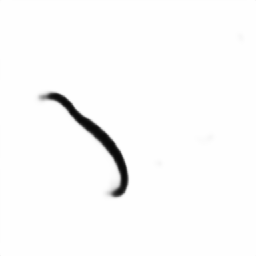

1/1 [==============================] - 0s 27ms/step


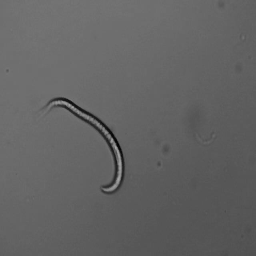

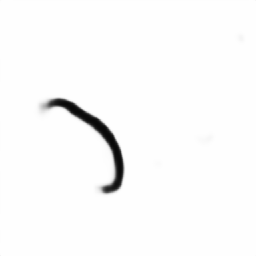

1/1 [==============================] - 0s 27ms/step


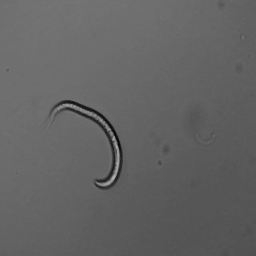

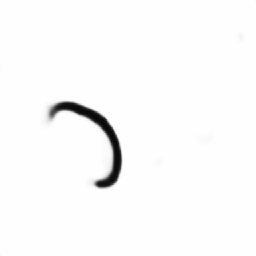

1/1 [==============================] - 0s 32ms/step


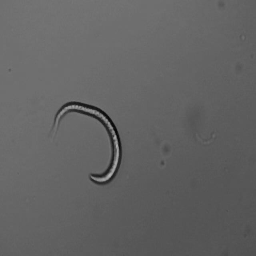

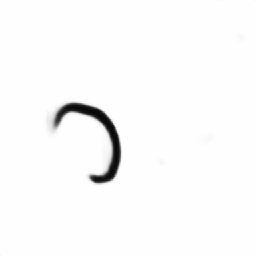

1/1 [==============================] - 0s 38ms/step


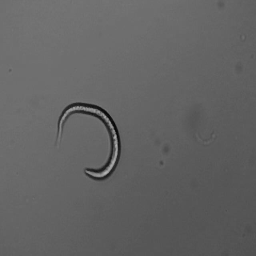

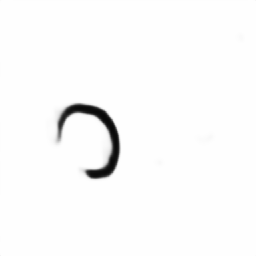

1/1 [==============================] - 0s 32ms/step


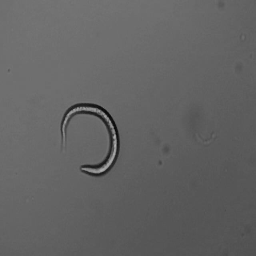

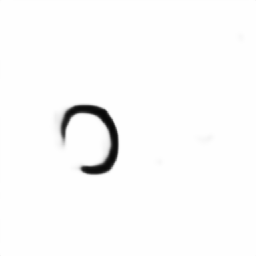

1/1 [==============================] - 0s 28ms/step


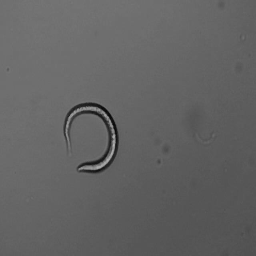

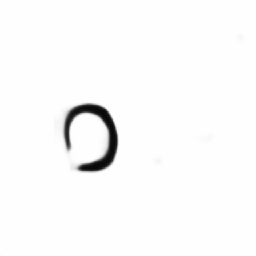

1/1 [==============================] - 0s 28ms/step


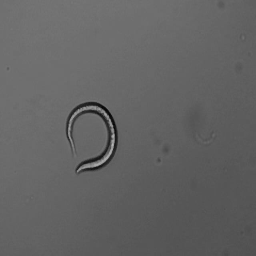

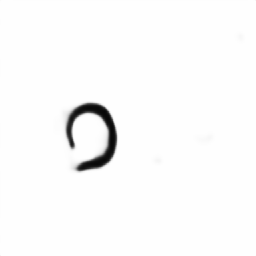

1/1 [==============================] - 0s 26ms/step


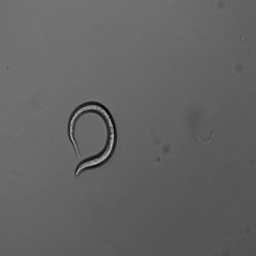

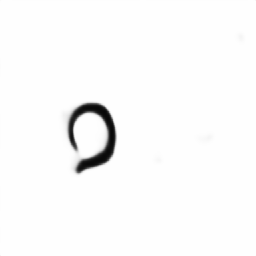

1/1 [==============================] - 0s 32ms/step


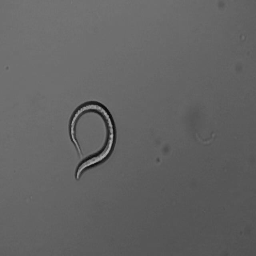

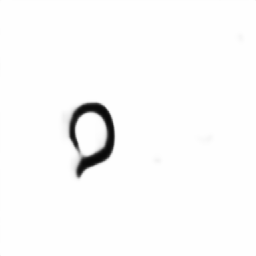

1/1 [==============================] - 0s 29ms/step


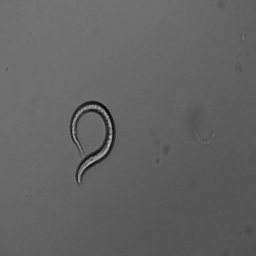

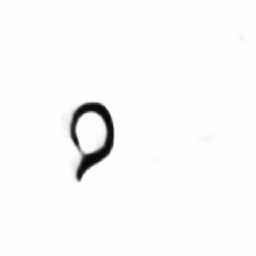

1/1 [==============================] - 0s 35ms/step


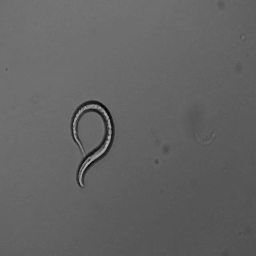

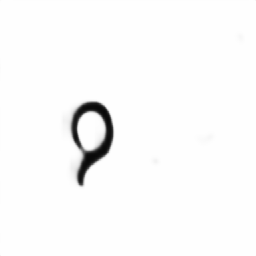

1/1 [==============================] - 0s 31ms/step


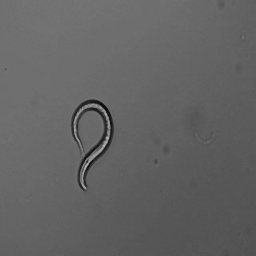

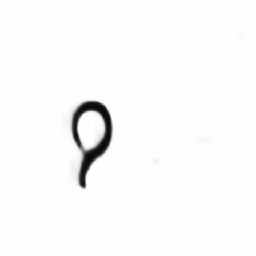

1/1 [==============================] - 0s 27ms/step


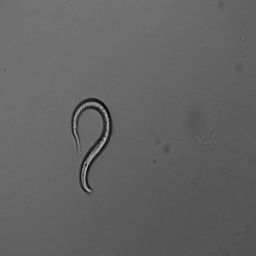

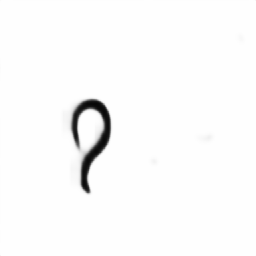

1/1 [==============================] - 0s 28ms/step


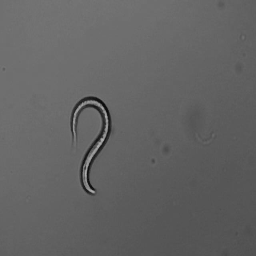

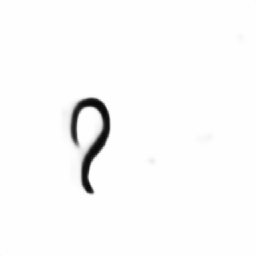

1/1 [==============================] - 0s 28ms/step


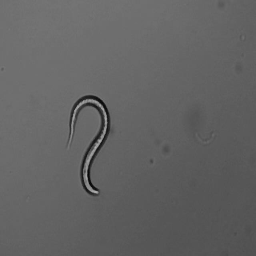

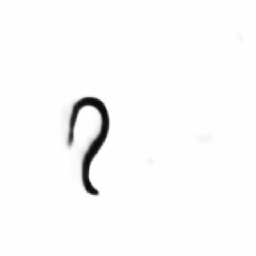

1/1 [==============================] - 0s 28ms/step


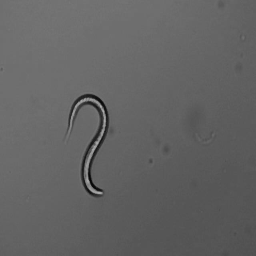

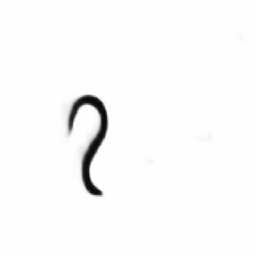

1/1 [==============================] - 0s 31ms/step


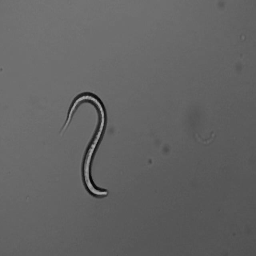

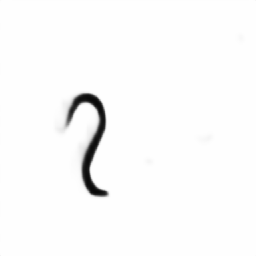

1/1 [==============================] - 0s 31ms/step


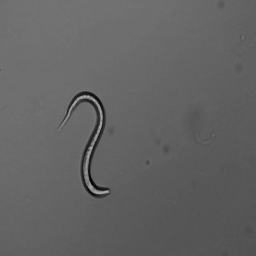

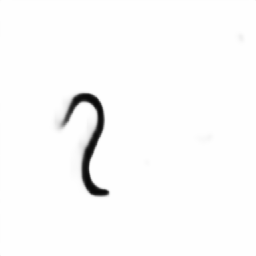

1/1 [==============================] - 0s 30ms/step


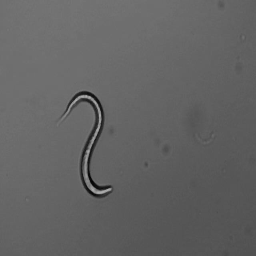

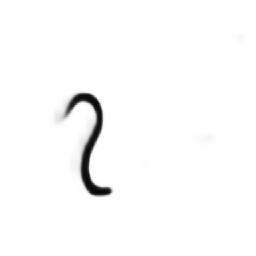

1/1 [==============================] - 0s 30ms/step


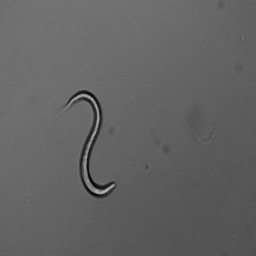

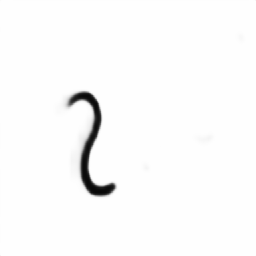

1/1 [==============================] - 0s 28ms/step


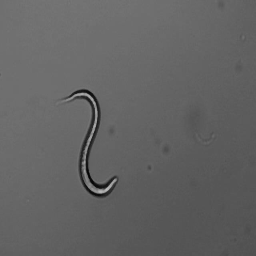

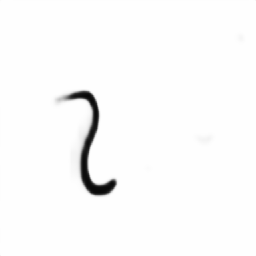

1/1 [==============================] - 0s 36ms/step


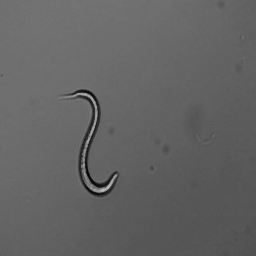

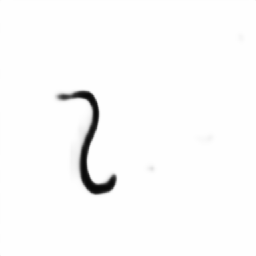

1/1 [==============================] - 0s 32ms/step


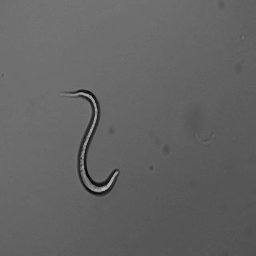

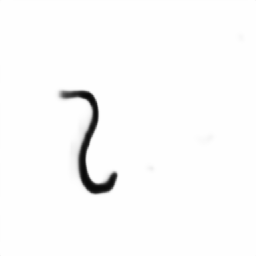

1/1 [==============================] - 0s 44ms/step


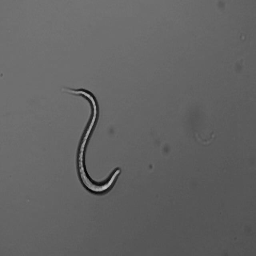

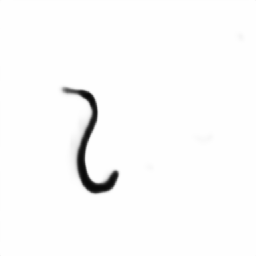

1/1 [==============================] - 0s 37ms/step


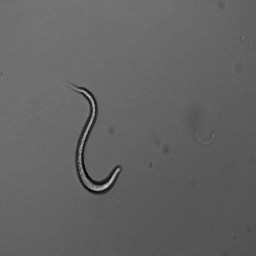

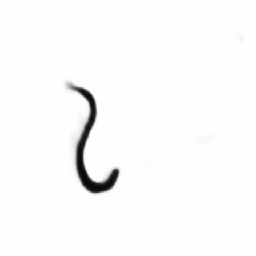

1/1 [==============================] - 0s 43ms/step


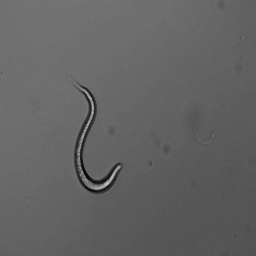

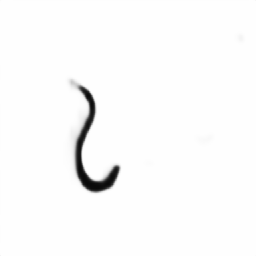

1/1 [==============================] - 0s 42ms/step


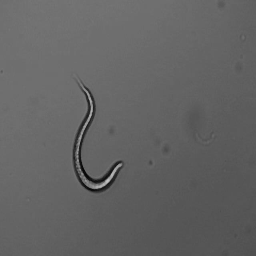

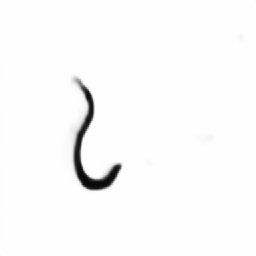

1/1 [==============================] - 0s 38ms/step


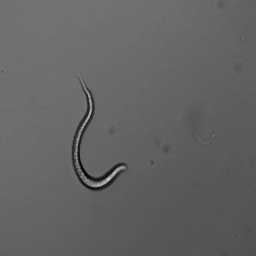

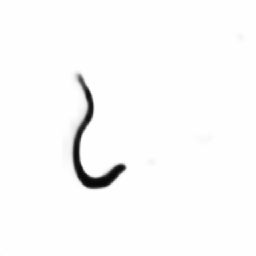

1/1 [==============================] - 0s 57ms/step


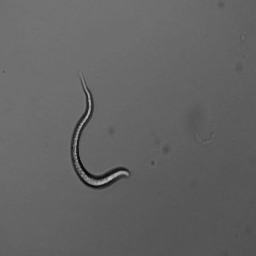

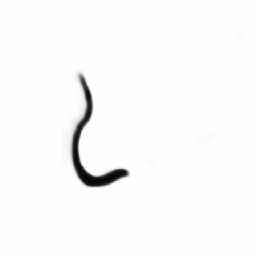

1/1 [==============================] - 0s 43ms/step


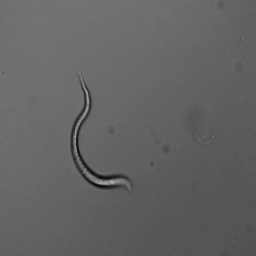

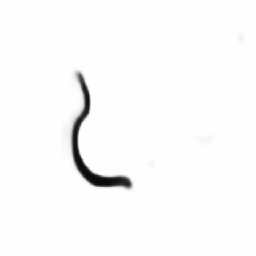

1/1 [==============================] - 0s 45ms/step


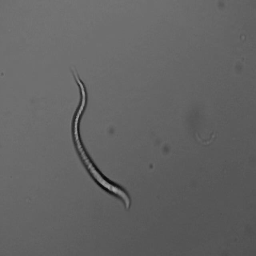

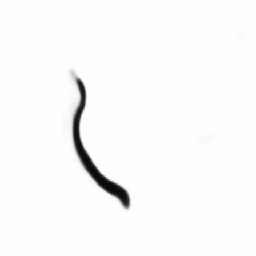

1/1 [==============================] - 0s 36ms/step


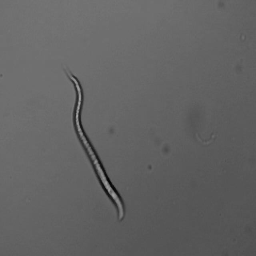

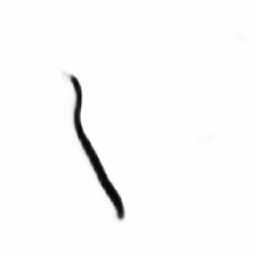

1/1 [==============================] - 0s 33ms/step


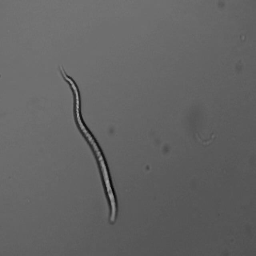

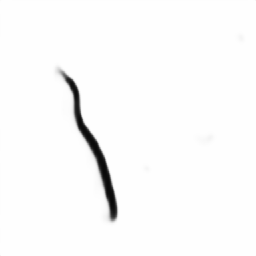

1/1 [==============================] - 0s 73ms/step


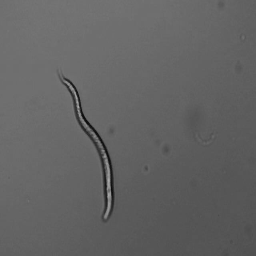

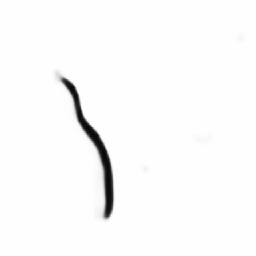

1/1 [==============================] - 0s 41ms/step


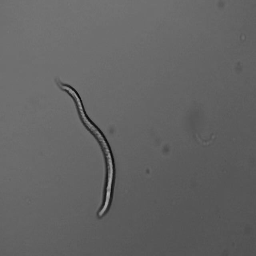

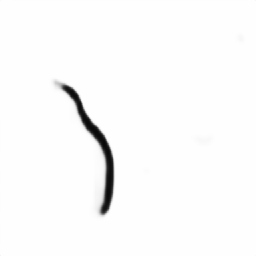

1/1 [==============================] - 0s 64ms/step


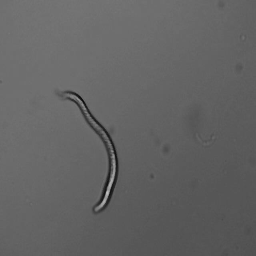

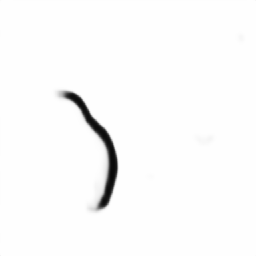

1/1 [==============================] - 0s 37ms/step


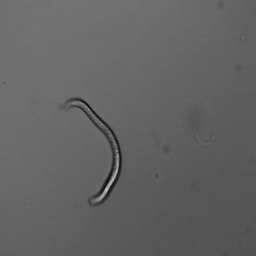

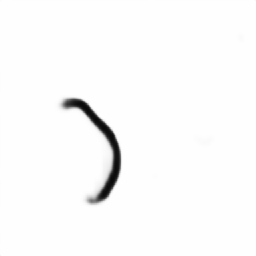

1/1 [==============================] - 0s 36ms/step


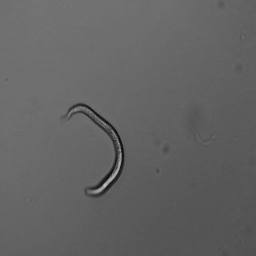

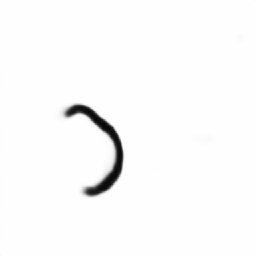

1/1 [==============================] - 0s 38ms/step


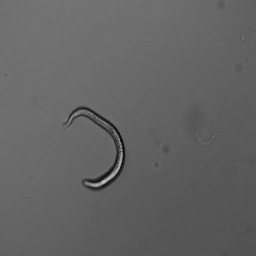

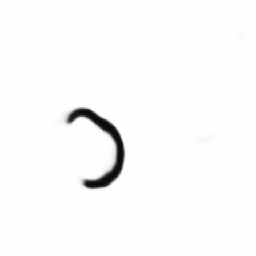

1/1 [==============================] - 0s 44ms/step


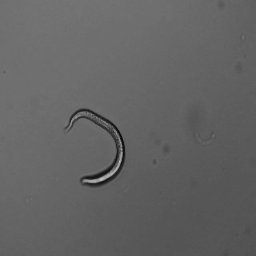

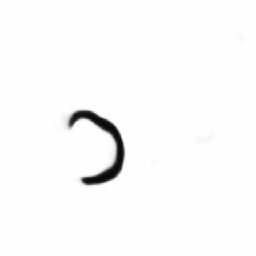

1/1 [==============================] - 0s 34ms/step


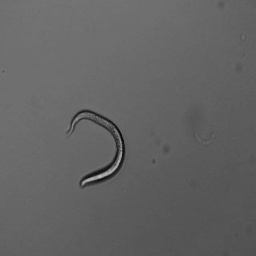

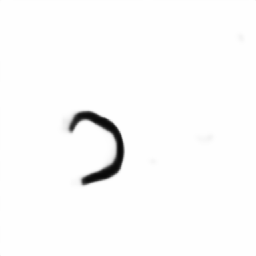

1/1 [==============================] - 0s 46ms/step


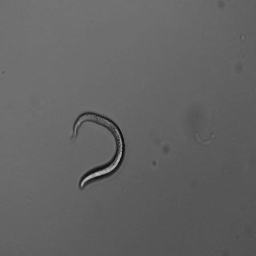

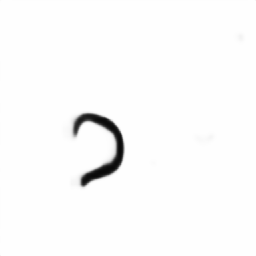

1/1 [==============================] - 0s 47ms/step


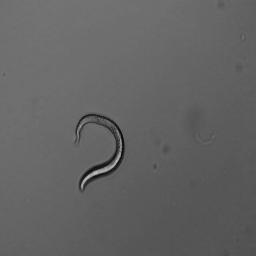

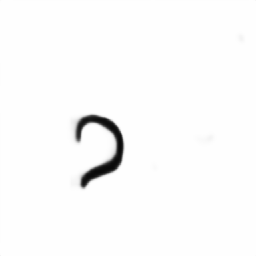

1/1 [==============================] - 0s 50ms/step


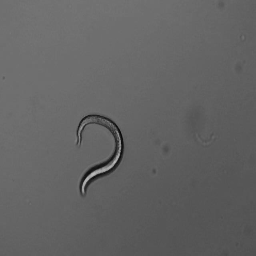

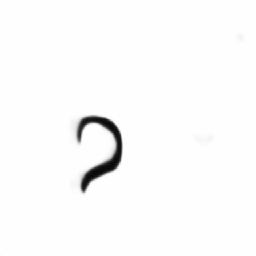

1/1 [==============================] - 0s 32ms/step


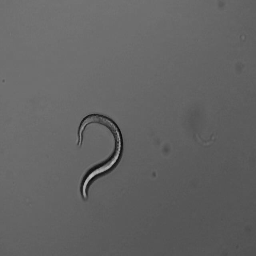

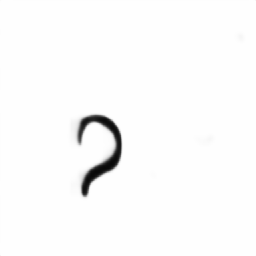

1/1 [==============================] - 0s 32ms/step


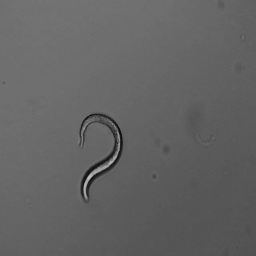

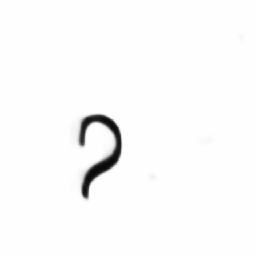

1/1 [==============================] - 0s 38ms/step


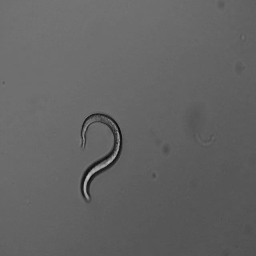

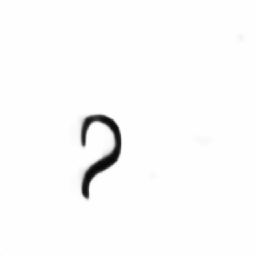

1/1 [==============================] - 0s 47ms/step


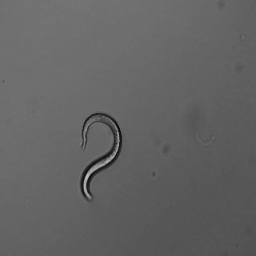

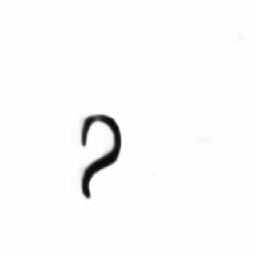

1/1 [==============================] - 0s 60ms/step


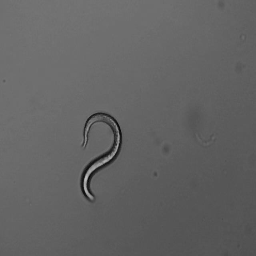

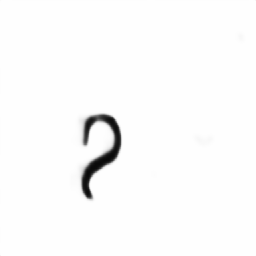

1/1 [==============================] - 0s 61ms/step


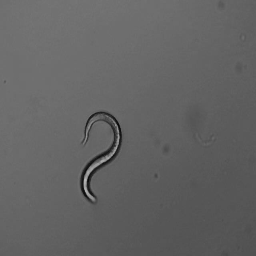

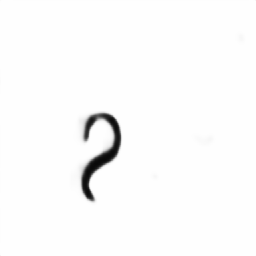

1/1 [==============================] - 0s 57ms/step


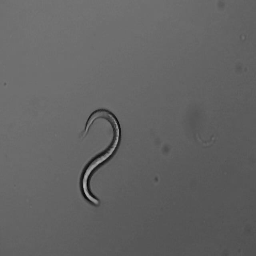

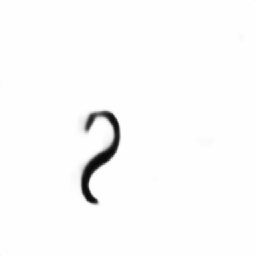

1/1 [==============================] - 0s 40ms/step


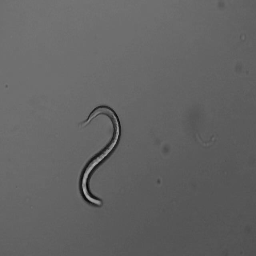

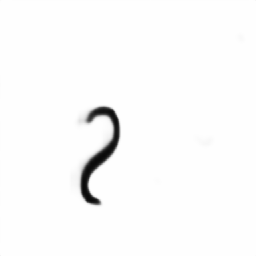

1/1 [==============================] - 0s 36ms/step


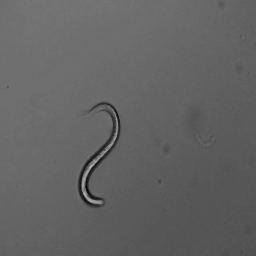

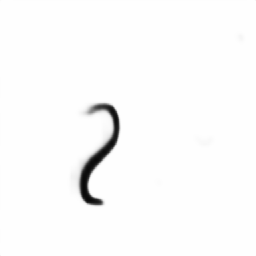

1/1 [==============================] - 0s 50ms/step


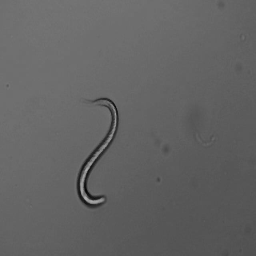

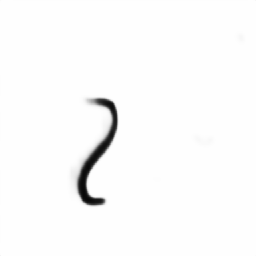

1/1 [==============================] - 0s 34ms/step


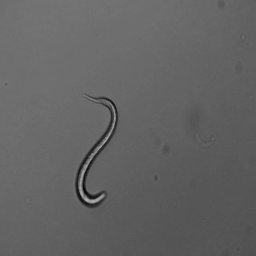

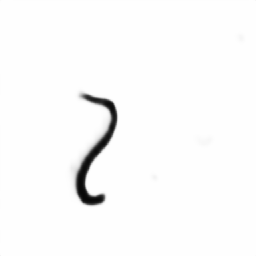

1/1 [==============================] - 0s 43ms/step


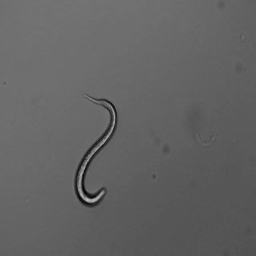

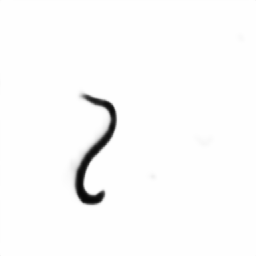

1/1 [==============================] - 0s 40ms/step


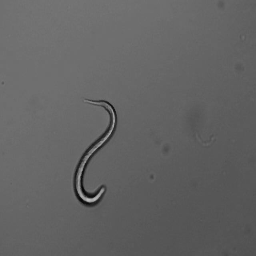

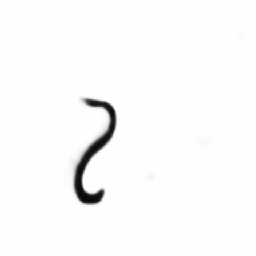

1/1 [==============================] - 0s 59ms/step


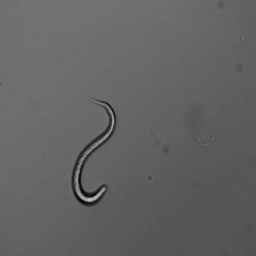

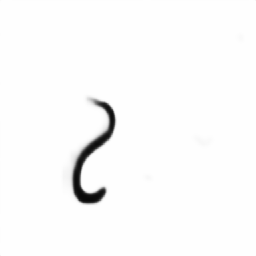

1/1 [==============================] - 0s 62ms/step


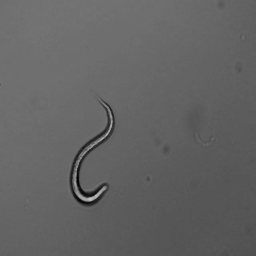

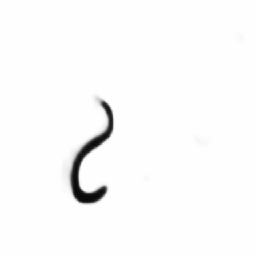

1/1 [==============================] - 0s 41ms/step


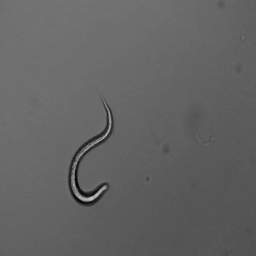

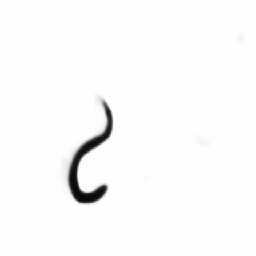

1/1 [==============================] - 0s 42ms/step


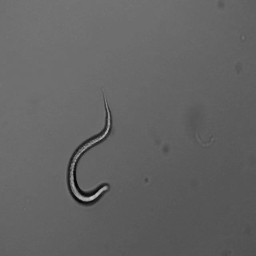

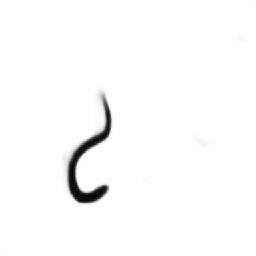

1/1 [==============================] - 0s 28ms/step


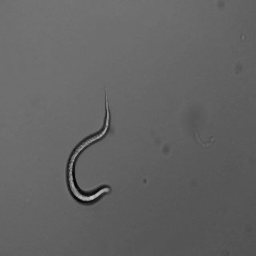

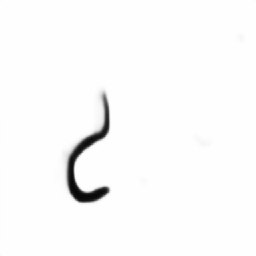

1/1 [==============================] - 0s 37ms/step


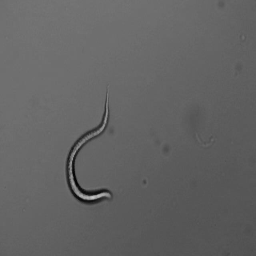

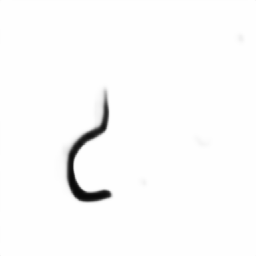

1/1 [==============================] - 0s 28ms/step


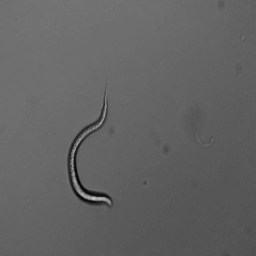

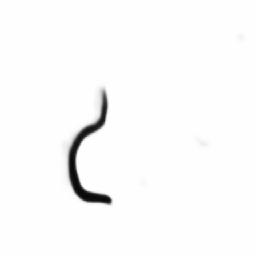

1/1 [==============================] - 0s 30ms/step


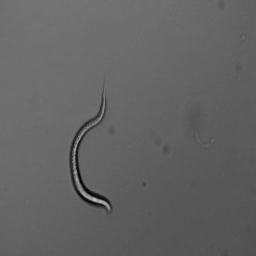

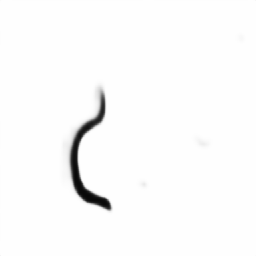

1/1 [==============================] - 0s 27ms/step


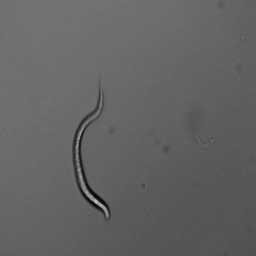

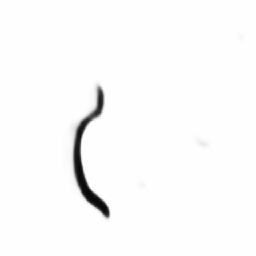

1/1 [==============================] - 0s 29ms/step


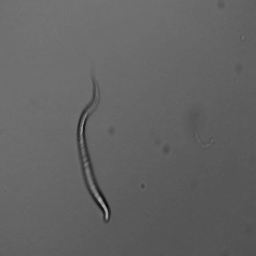

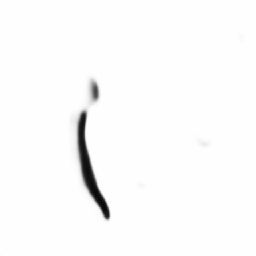

1/1 [==============================] - 0s 36ms/step


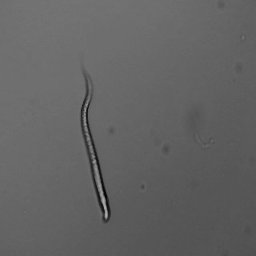

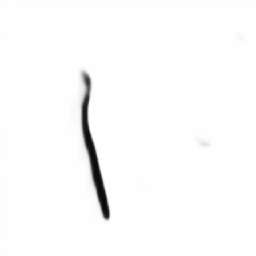

1/1 [==============================] - 0s 30ms/step


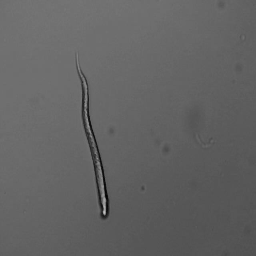

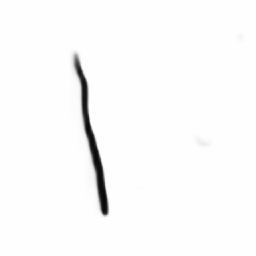

1/1 [==============================] - 0s 30ms/step


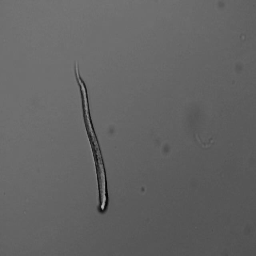

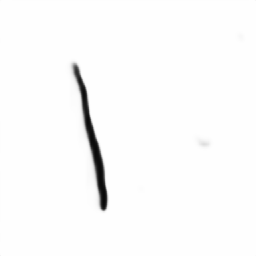

1/1 [==============================] - 0s 30ms/step


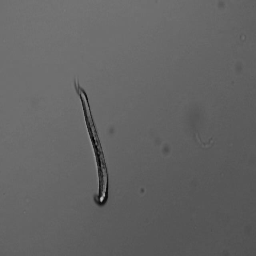

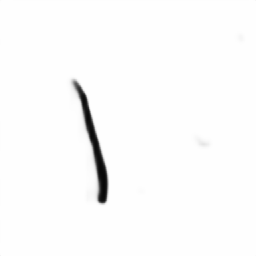

1/1 [==============================] - 0s 30ms/step


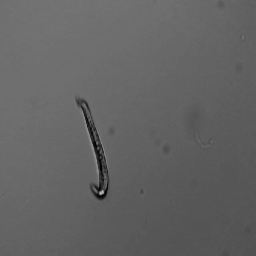

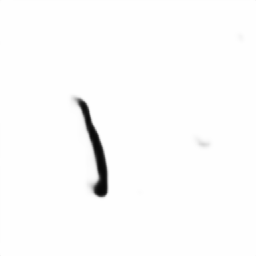

1/1 [==============================] - 0s 28ms/step


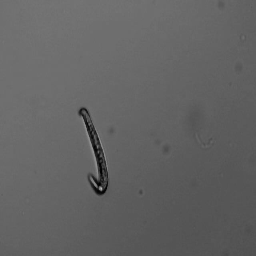

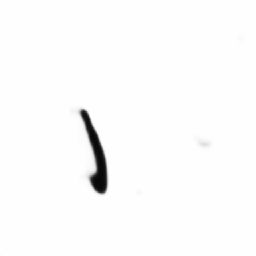

1/1 [==============================] - 0s 32ms/step


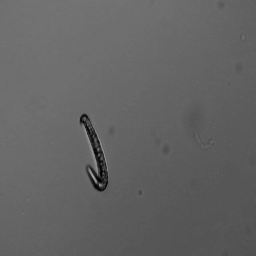

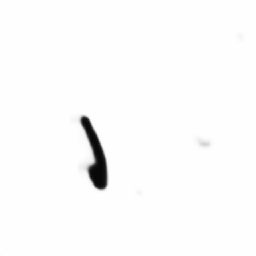

1/1 [==============================] - 0s 28ms/step


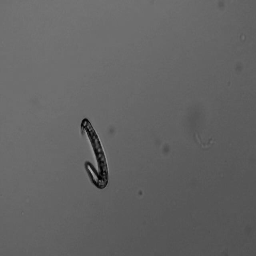

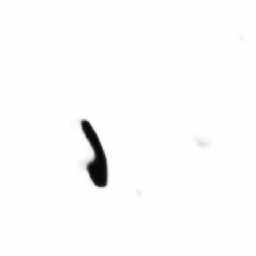

1/1 [==============================] - 0s 30ms/step


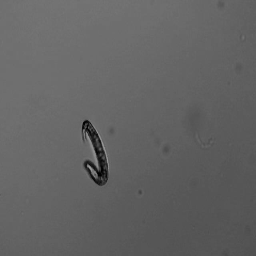

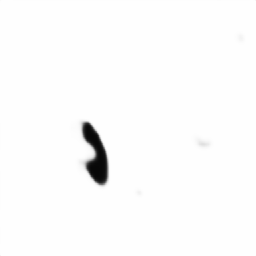

1/1 [==============================] - 0s 30ms/step


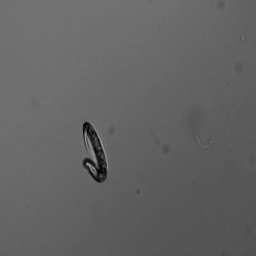

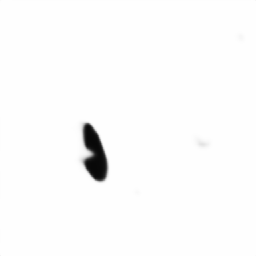

1/1 [==============================] - 0s 28ms/step


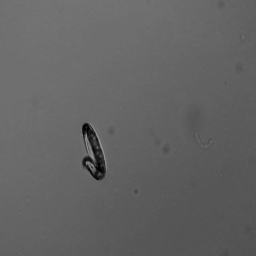

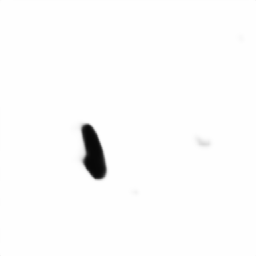

1/1 [==============================] - 0s 32ms/step


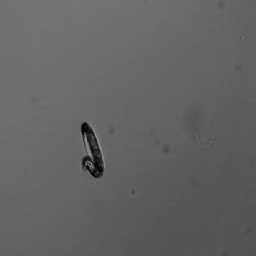

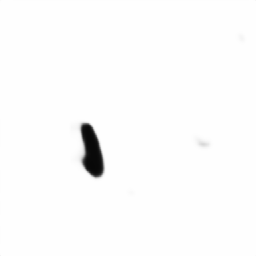

1/1 [==============================] - 0s 35ms/step


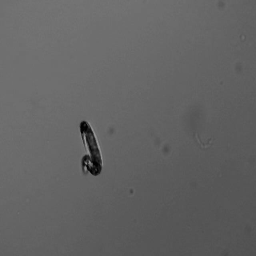

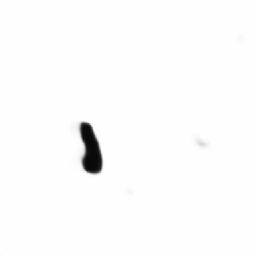

1/1 [==============================] - 0s 29ms/step


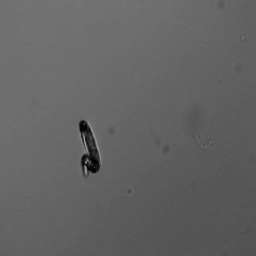

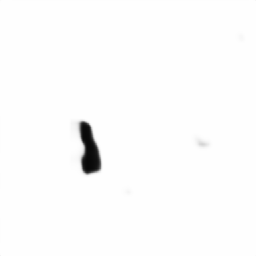

1/1 [==============================] - 0s 29ms/step


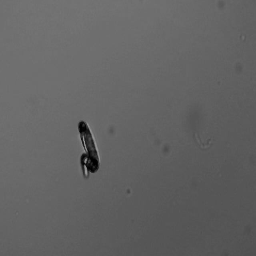

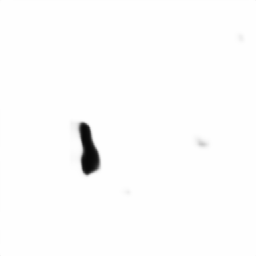

1/1 [==============================] - 0s 28ms/step


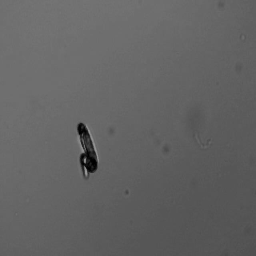

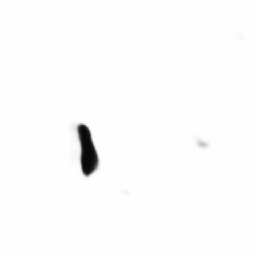

1/1 [==============================] - 0s 31ms/step


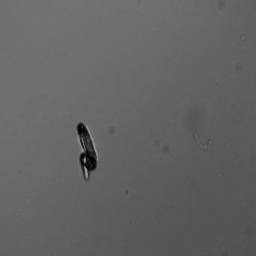

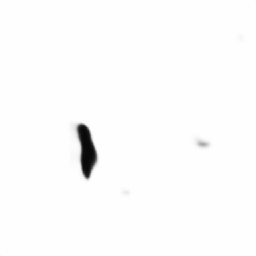

1/1 [==============================] - 0s 31ms/step


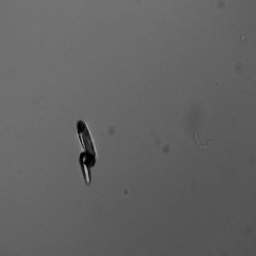

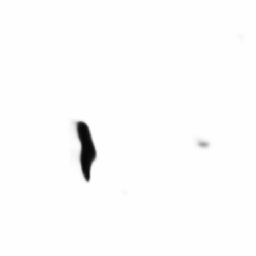

1/1 [==============================] - 0s 28ms/step


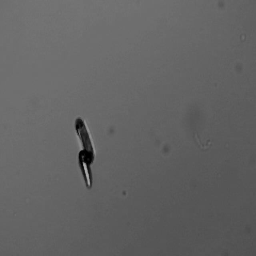

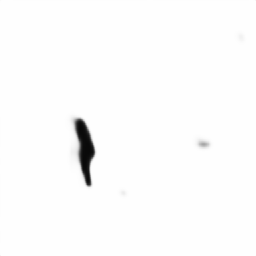

1/1 [==============================] - 0s 29ms/step


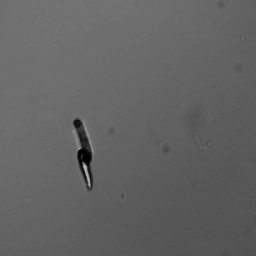

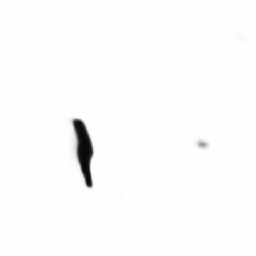

1/1 [==============================] - 0s 28ms/step


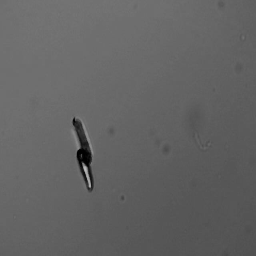

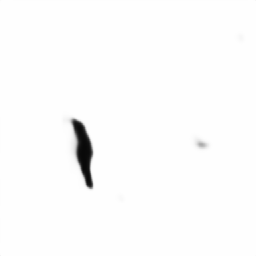

1/1 [==============================] - 0s 30ms/step


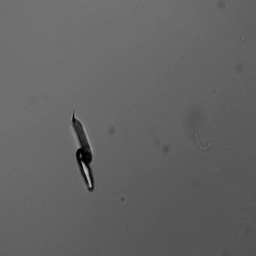

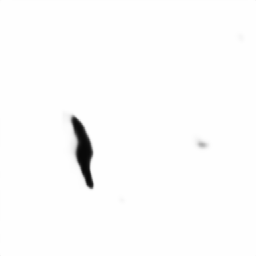

1/1 [==============================] - 0s 35ms/step


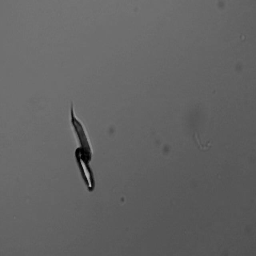

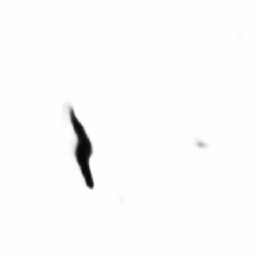

1/1 [==============================] - 0s 40ms/step


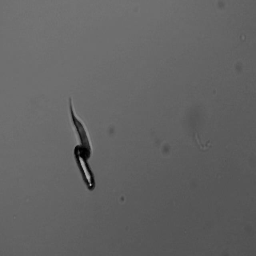

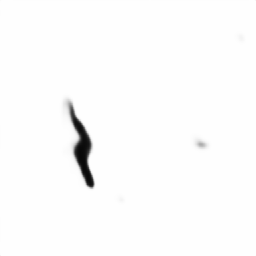

1/1 [==============================] - 0s 31ms/step


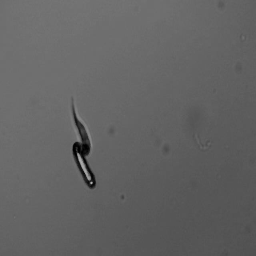

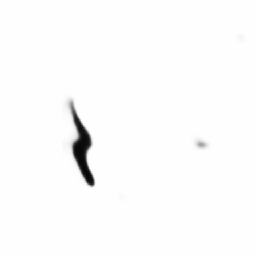

1/1 [==============================] - 0s 30ms/step


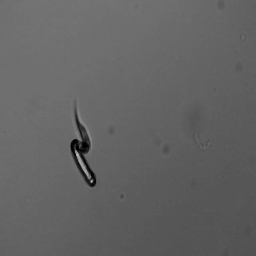

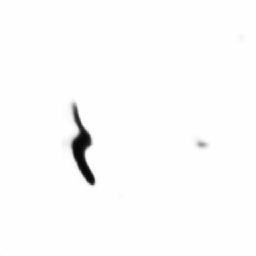

1/1 [==============================] - 0s 38ms/step


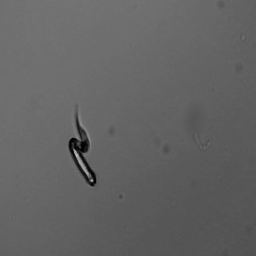

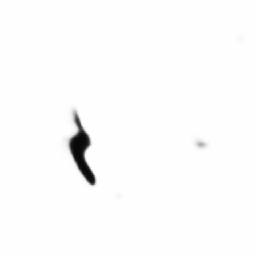

1/1 [==============================] - 0s 27ms/step


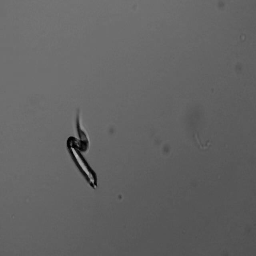

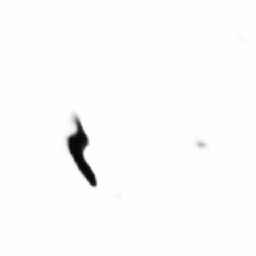

1/1 [==============================] - 0s 28ms/step


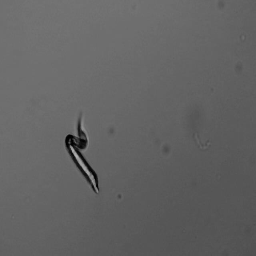

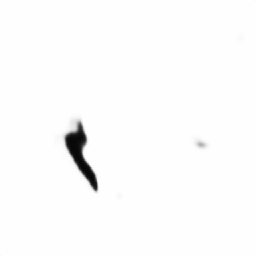

1/1 [==============================] - 0s 27ms/step


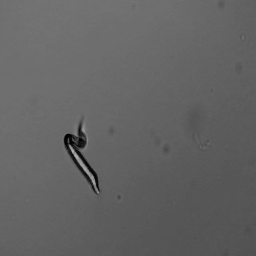

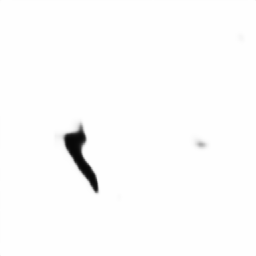

1/1 [==============================] - 0s 34ms/step


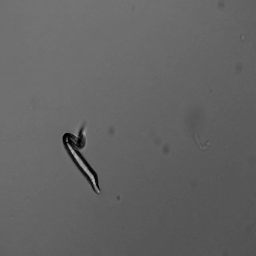

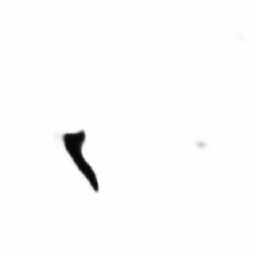

1/1 [==============================] - 0s 28ms/step


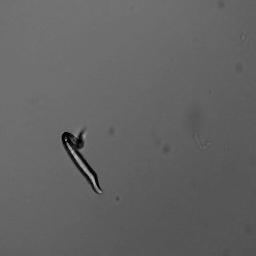

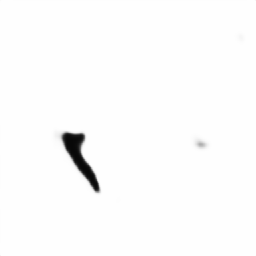

1/1 [==============================] - 0s 32ms/step


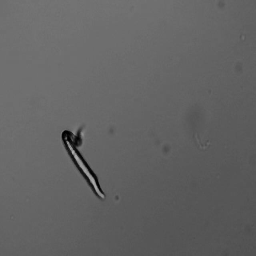

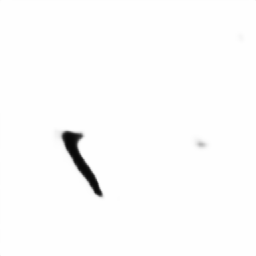

1/1 [==============================] - 0s 30ms/step


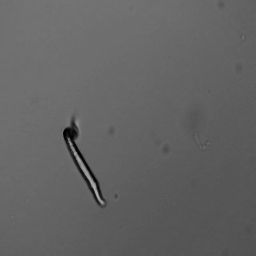

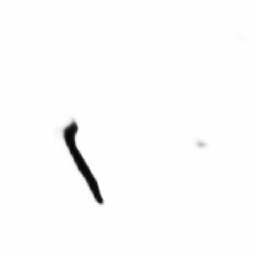

1/1 [==============================] - 0s 29ms/step


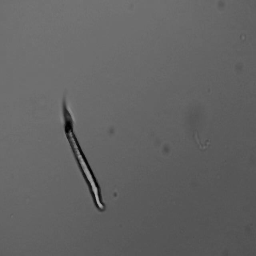

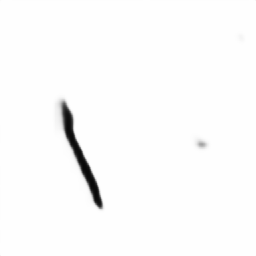

1/1 [==============================] - 0s 27ms/step


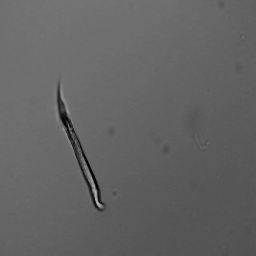

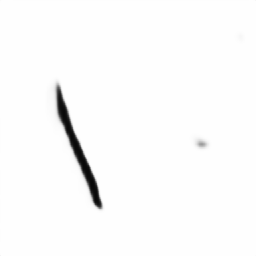

1/1 [==============================] - 0s 27ms/step


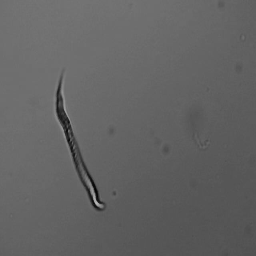

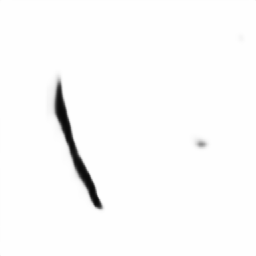

1/1 [==============================] - 0s 33ms/step


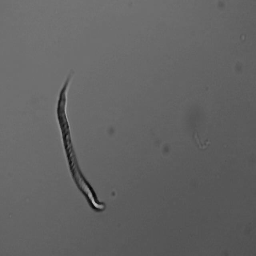

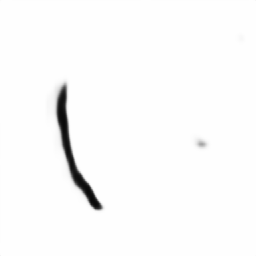

1/1 [==============================] - 0s 29ms/step


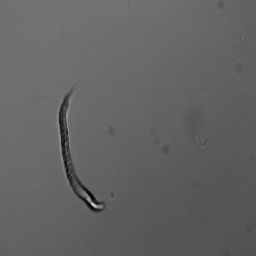

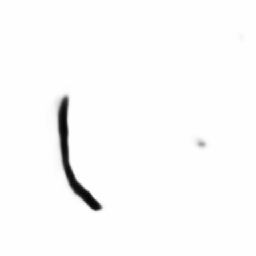

1/1 [==============================] - 0s 31ms/step


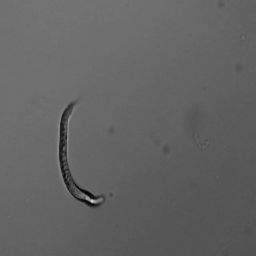

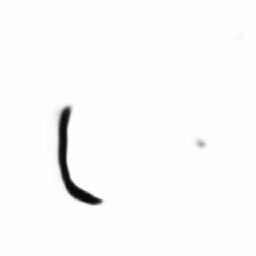

1/1 [==============================] - 0s 29ms/step


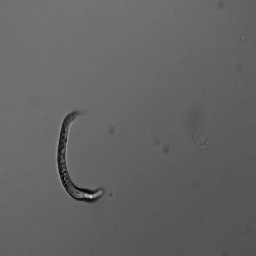

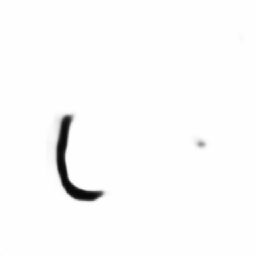

1/1 [==============================] - 0s 30ms/step


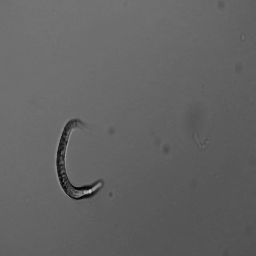

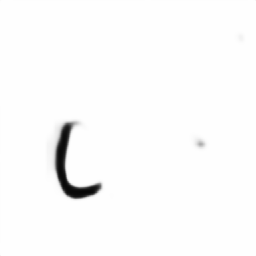

1/1 [==============================] - 0s 32ms/step


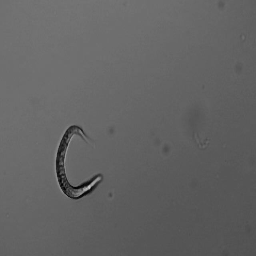

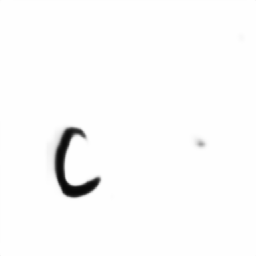

1/1 [==============================] - 0s 31ms/step


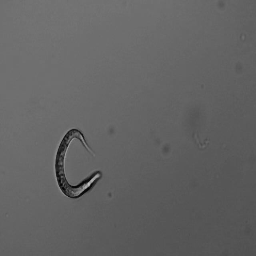

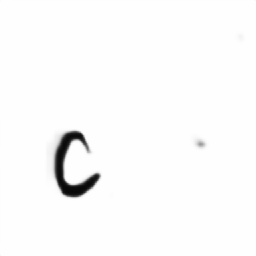

1/1 [==============================] - 0s 28ms/step


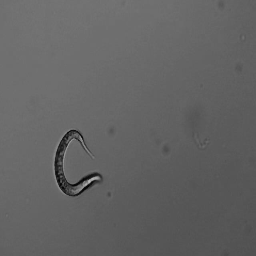

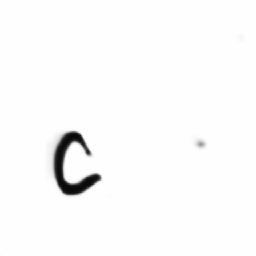

1/1 [==============================] - 0s 29ms/step


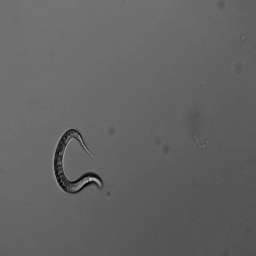

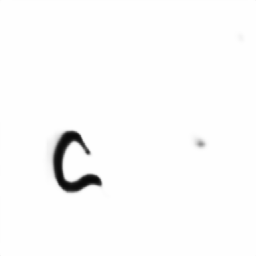

1/1 [==============================] - 0s 27ms/step


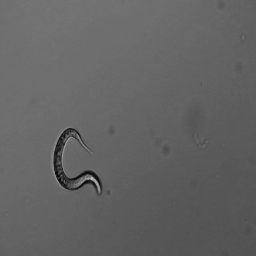

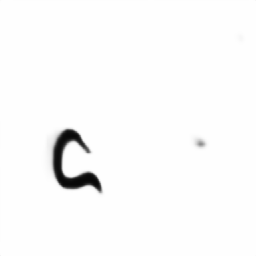

1/1 [==============================] - 0s 36ms/step


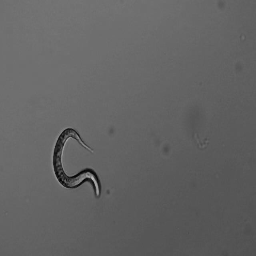

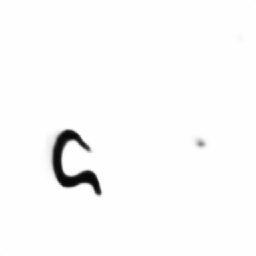

1/1 [==============================] - 0s 30ms/step


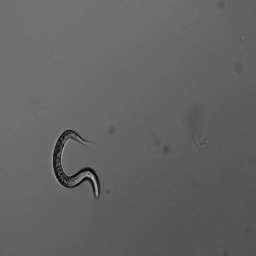

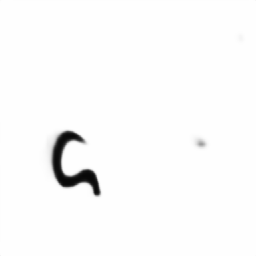

1/1 [==============================] - 0s 34ms/step


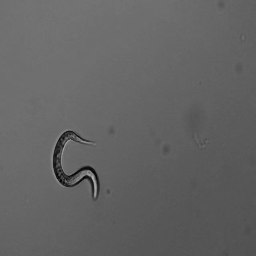

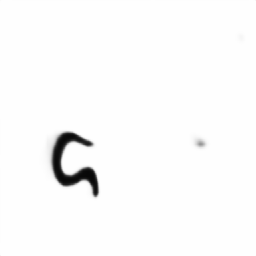

1/1 [==============================] - 0s 32ms/step


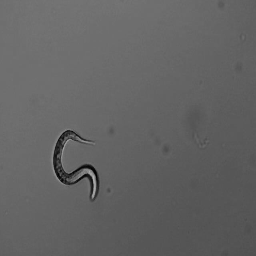

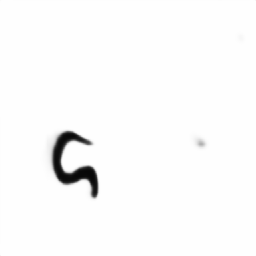

1/1 [==============================] - 0s 34ms/step


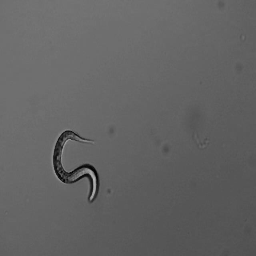

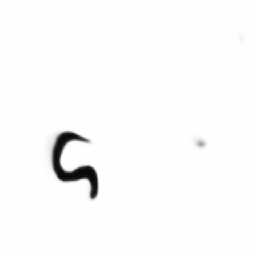

1/1 [==============================] - 0s 28ms/step


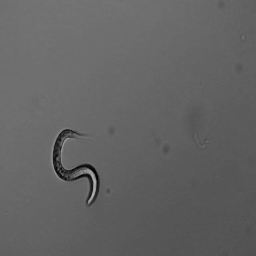

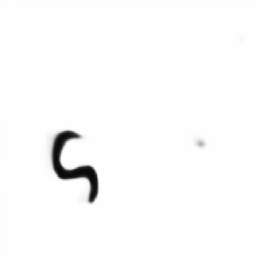

1/1 [==============================] - 0s 34ms/step


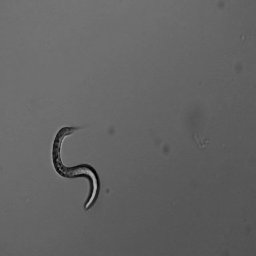

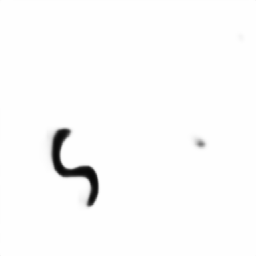

1/1 [==============================] - 0s 29ms/step


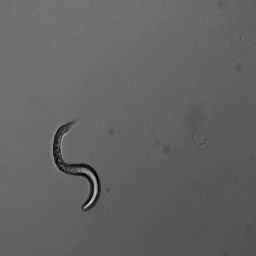

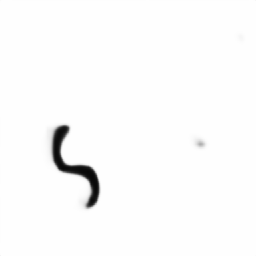

1/1 [==============================] - 0s 30ms/step


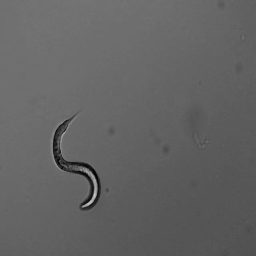

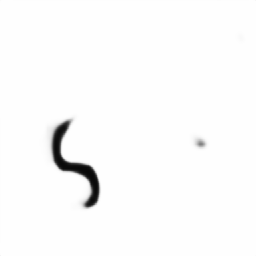

1/1 [==============================] - 0s 27ms/step


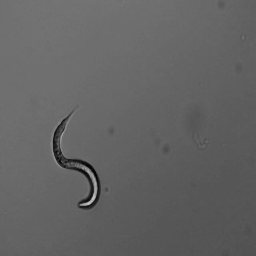

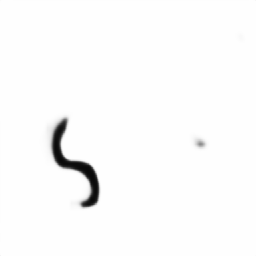

1/1 [==============================] - 0s 29ms/step


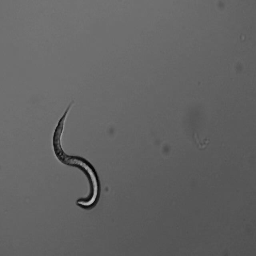

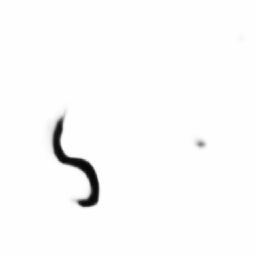

1/1 [==============================] - 0s 34ms/step


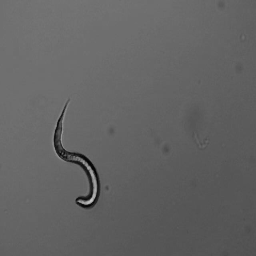

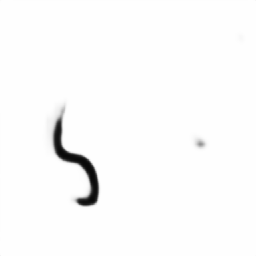

1/1 [==============================] - 0s 43ms/step


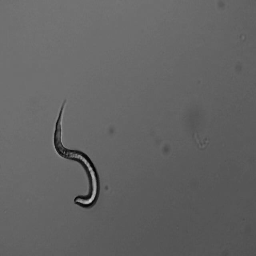

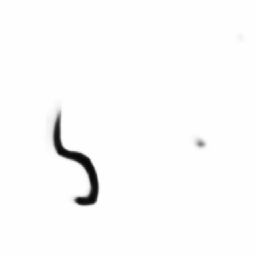

1/1 [==============================] - 0s 34ms/step


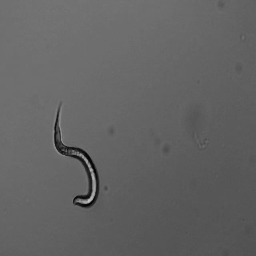

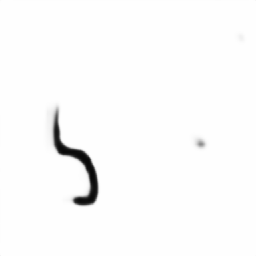

1/1 [==============================] - 0s 31ms/step


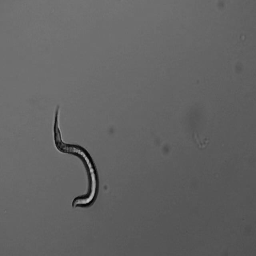

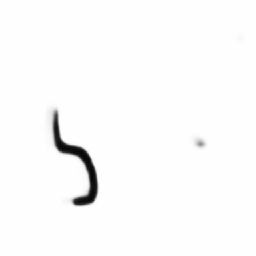

1/1 [==============================] - 0s 29ms/step


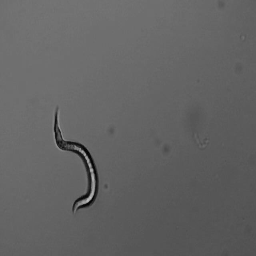

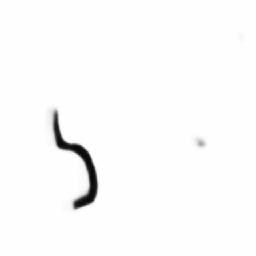

1/1 [==============================] - 0s 30ms/step


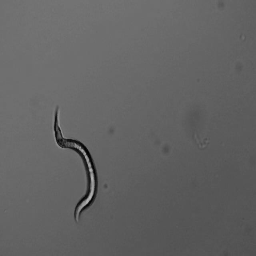

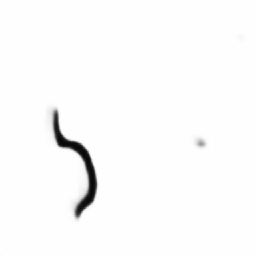

1/1 [==============================] - 0s 31ms/step


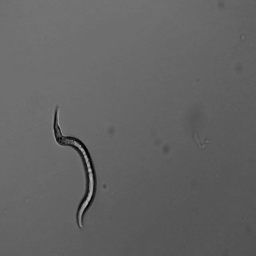

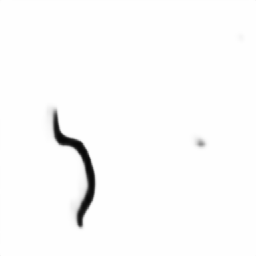

1/1 [==============================] - 0s 29ms/step


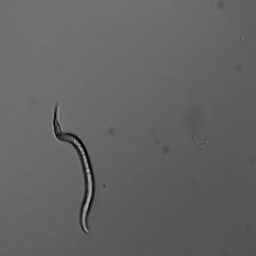

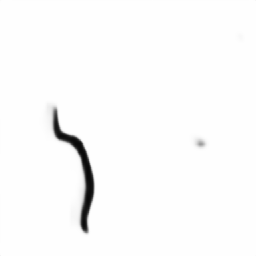

1/1 [==============================] - 0s 28ms/step


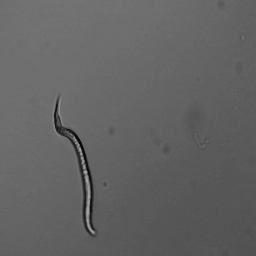

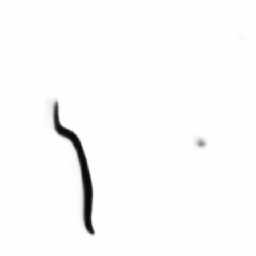

1/1 [==============================] - 0s 28ms/step


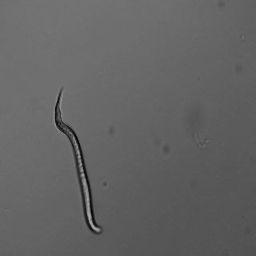

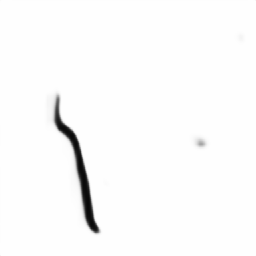

1/1 [==============================] - 0s 34ms/step


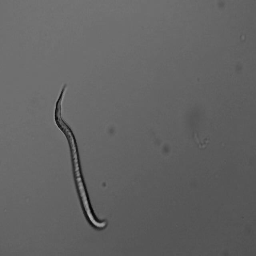

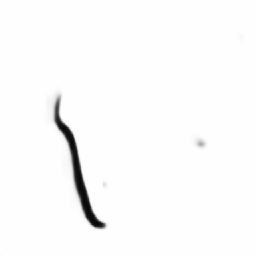

1/1 [==============================] - 0s 31ms/step


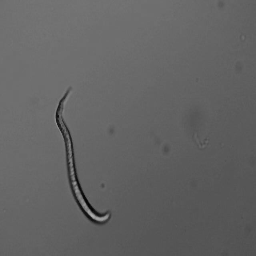

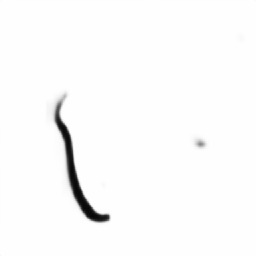

1/1 [==============================] - 0s 32ms/step


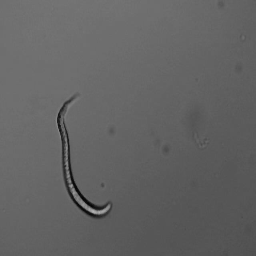

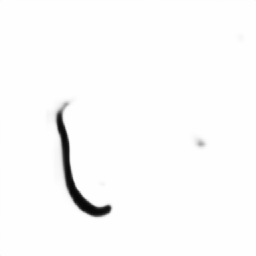

1/1 [==============================] - 0s 27ms/step


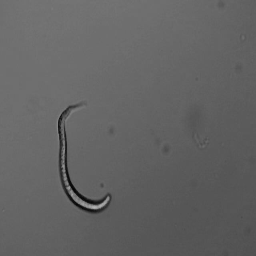

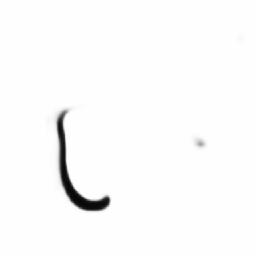

1/1 [==============================] - 0s 43ms/step


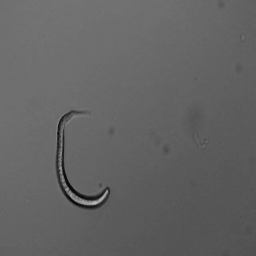

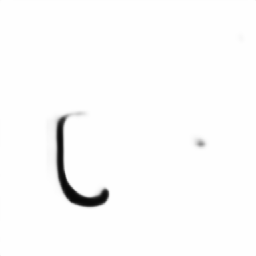

1/1 [==============================] - 0s 31ms/step


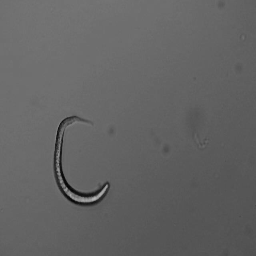

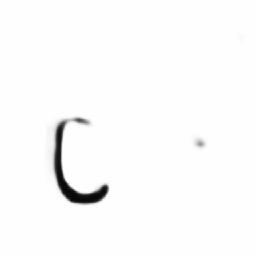

1/1 [==============================] - 0s 38ms/step


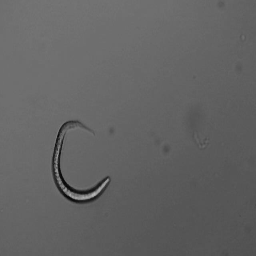

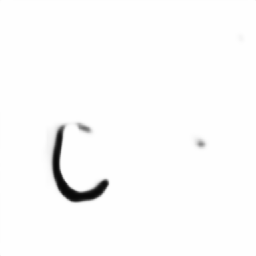

1/1 [==============================] - 0s 28ms/step


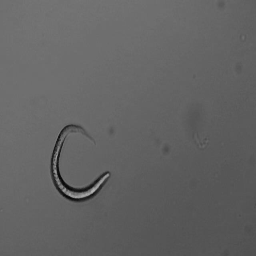

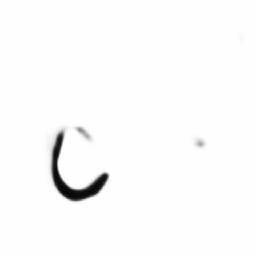

1/1 [==============================] - 0s 38ms/step


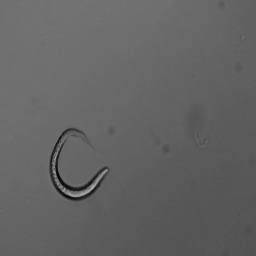

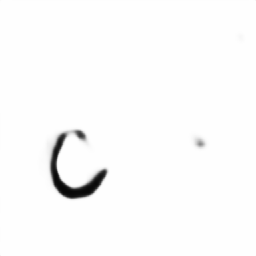

1/1 [==============================] - 0s 31ms/step


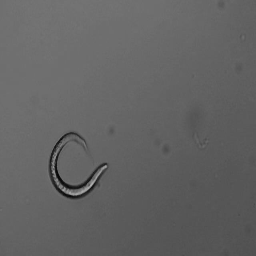

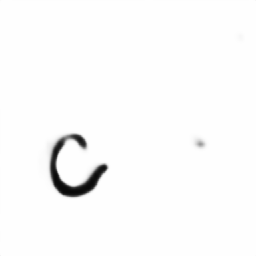

1/1 [==============================] - 0s 29ms/step


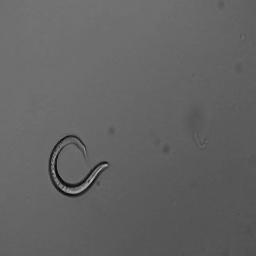

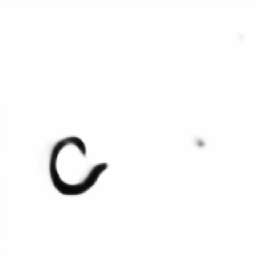

1/1 [==============================] - 0s 28ms/step


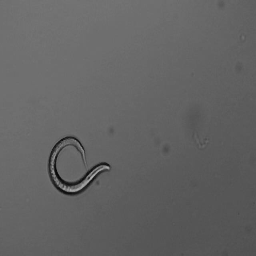

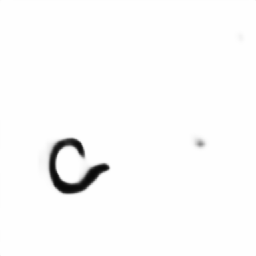

1/1 [==============================] - 0s 29ms/step


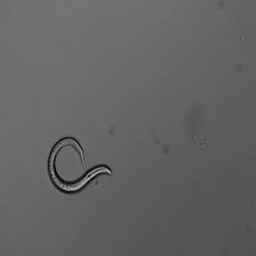

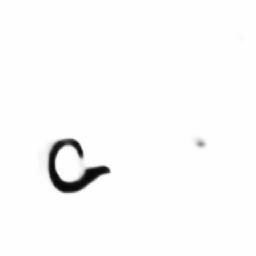

1/1 [==============================] - 0s 31ms/step


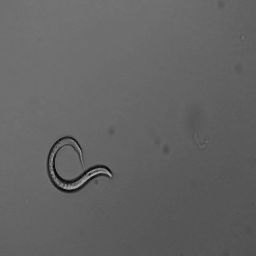

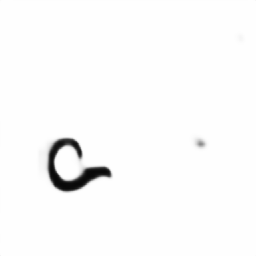

1/1 [==============================] - 0s 28ms/step


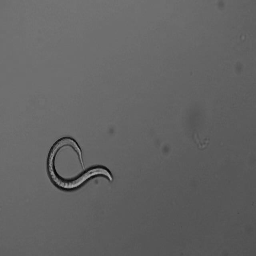

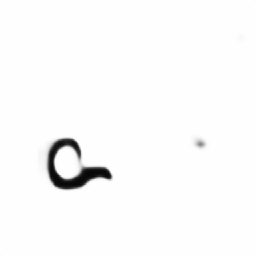

1/1 [==============================] - 0s 30ms/step


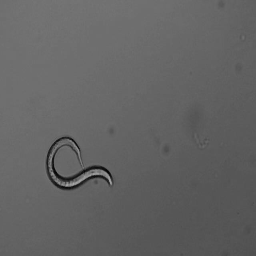

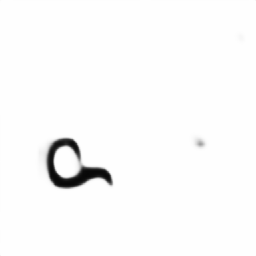

1/1 [==============================] - 0s 30ms/step


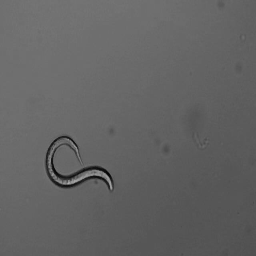

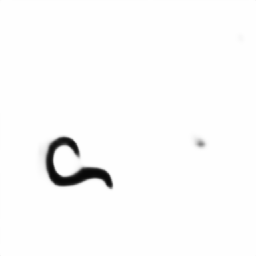

1/1 [==============================] - 0s 44ms/step


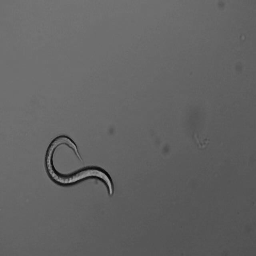

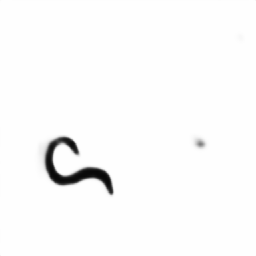

1/1 [==============================] - 0s 37ms/step


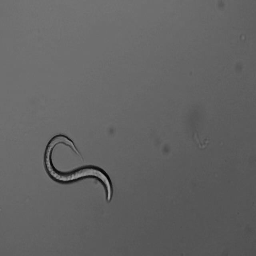

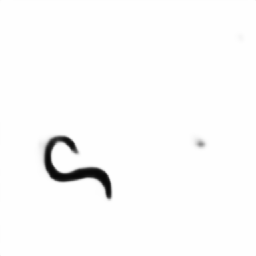

1/1 [==============================] - 0s 47ms/step


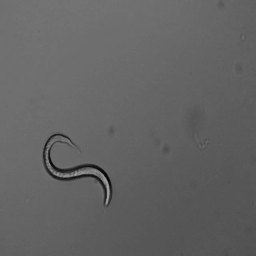

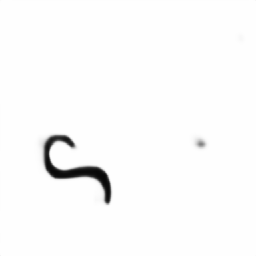

1/1 [==============================] - 0s 36ms/step


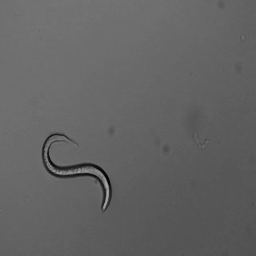

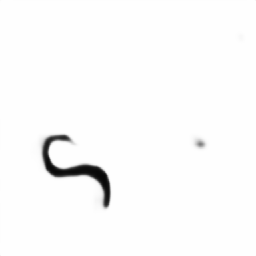

1/1 [==============================] - 0s 54ms/step


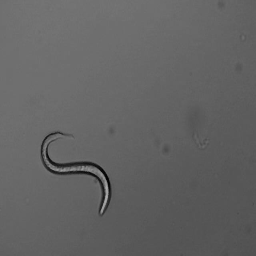

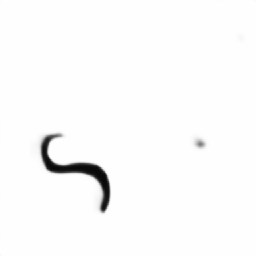

1/1 [==============================] - 0s 35ms/step


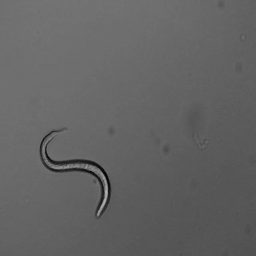

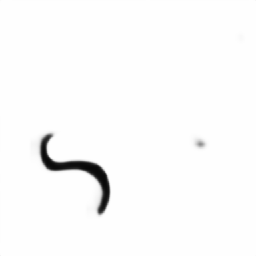

1/1 [==============================] - 0s 64ms/step


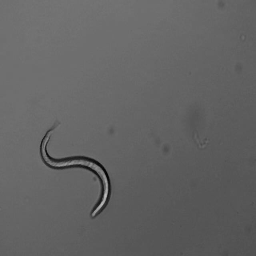

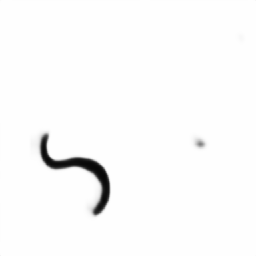

1/1 [==============================] - 0s 35ms/step


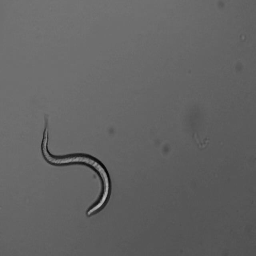

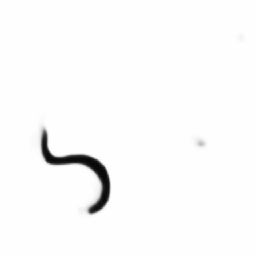

1/1 [==============================] - 0s 61ms/step


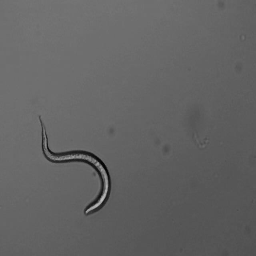

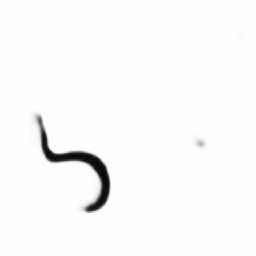

1/1 [==============================] - 0s 57ms/step


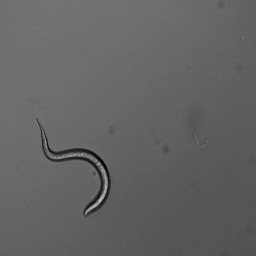

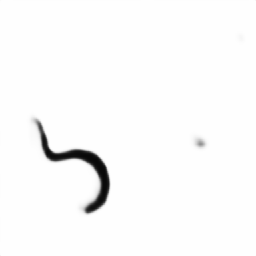

1/1 [==============================] - 0s 34ms/step


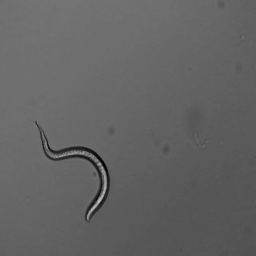

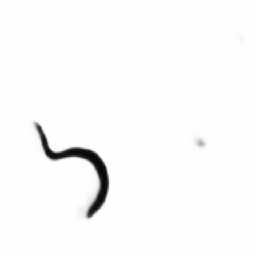

1/1 [==============================] - 0s 43ms/step


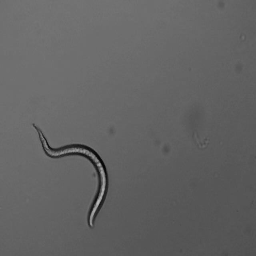

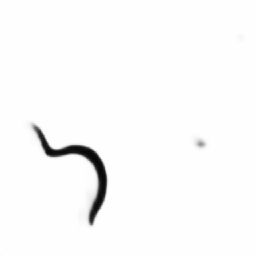

1/1 [==============================] - 0s 56ms/step


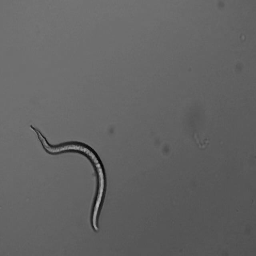

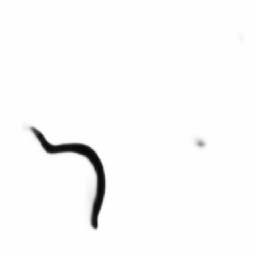

1/1 [==============================] - 0s 30ms/step


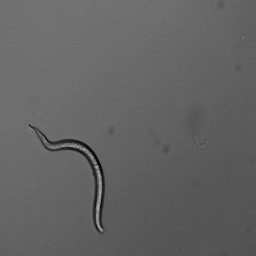

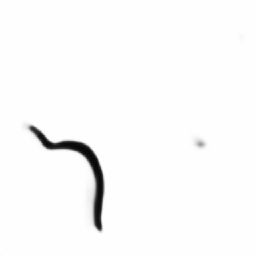

1/1 [==============================] - 0s 35ms/step


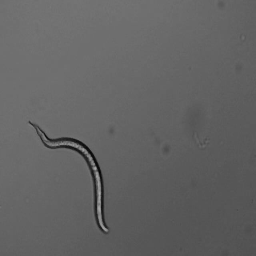

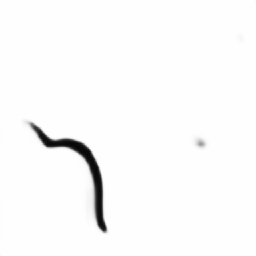

1/1 [==============================] - 0s 42ms/step


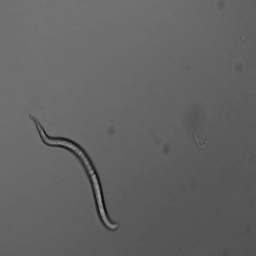

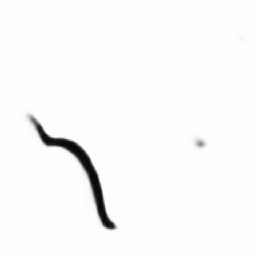

1/1 [==============================] - 0s 42ms/step


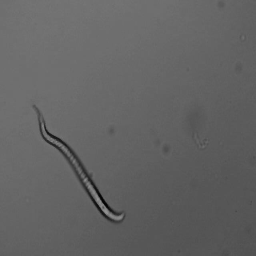

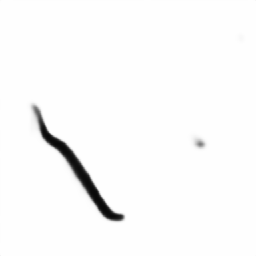

1/1 [==============================] - 0s 35ms/step


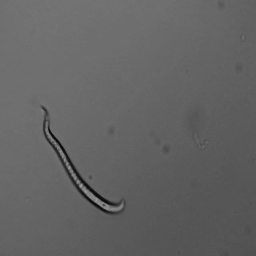

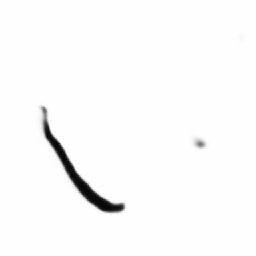

1/1 [==============================] - 0s 42ms/step


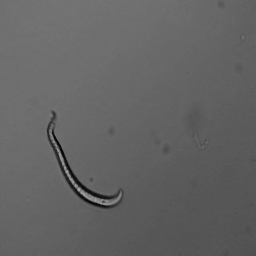

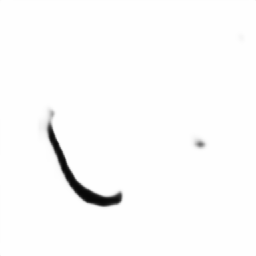

1/1 [==============================] - 0s 34ms/step


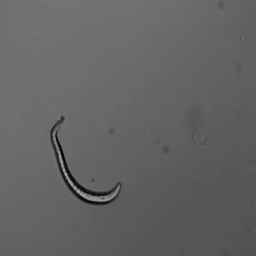

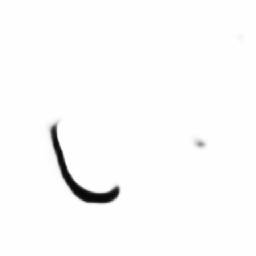

1/1 [==============================] - 0s 45ms/step


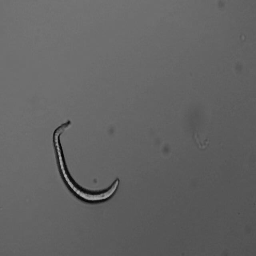

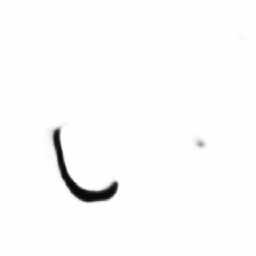

1/1 [==============================] - 0s 48ms/step


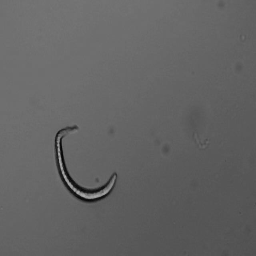

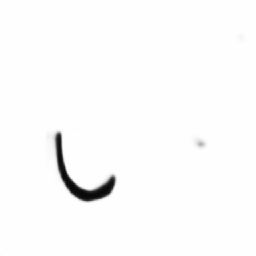

1/1 [==============================] - 0s 64ms/step


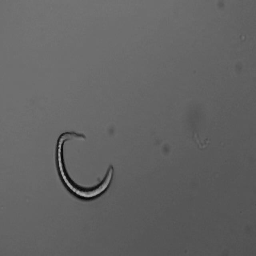

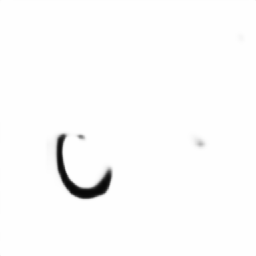

1/1 [==============================] - 0s 42ms/step


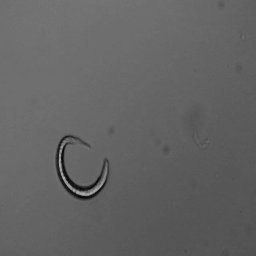

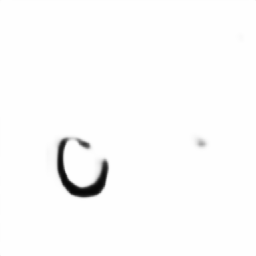

1/1 [==============================] - 0s 46ms/step


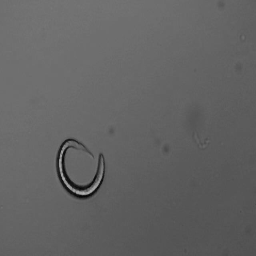

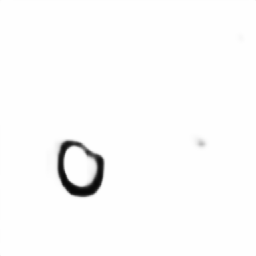

1/1 [==============================] - 0s 33ms/step


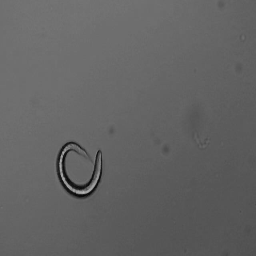

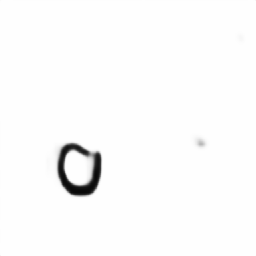

1/1 [==============================] - 0s 59ms/step


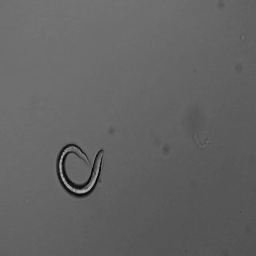

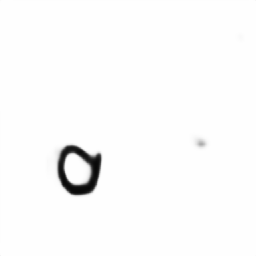

1/1 [==============================] - 0s 67ms/step


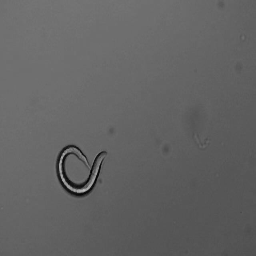

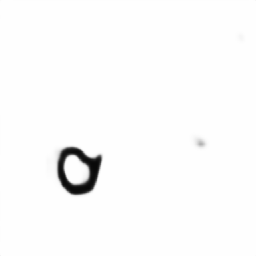

1/1 [==============================] - 0s 35ms/step


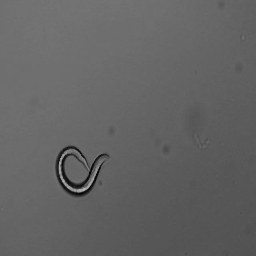

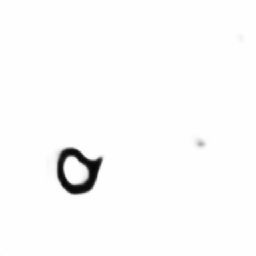

1/1 [==============================] - 0s 30ms/step


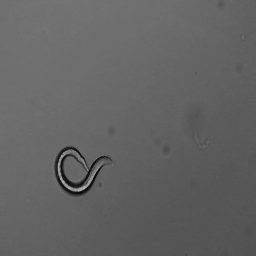

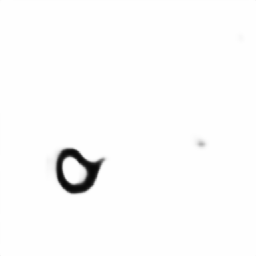

1/1 [==============================] - 0s 66ms/step


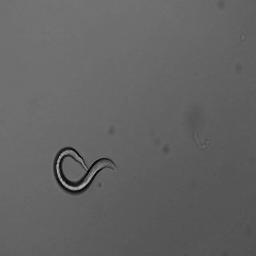

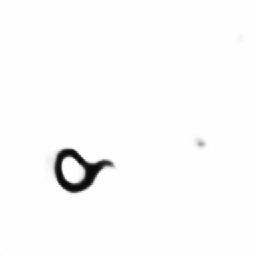

1/1 [==============================] - 0s 38ms/step


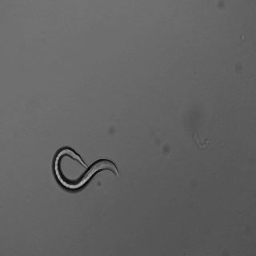

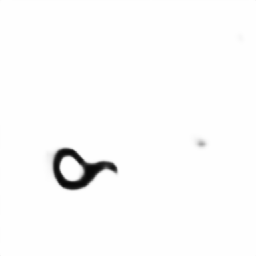

1/1 [==============================] - 0s 35ms/step


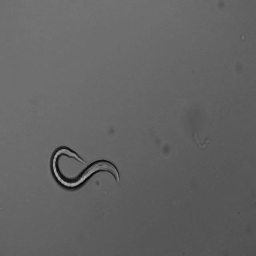

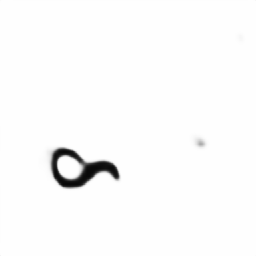

1/1 [==============================] - 0s 60ms/step


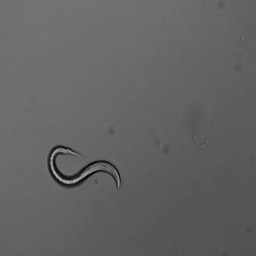

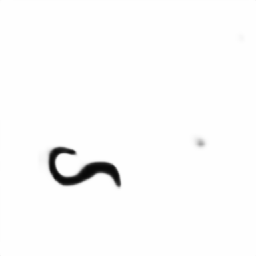

1/1 [==============================] - 0s 62ms/step


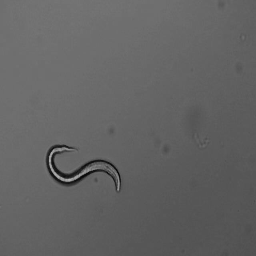

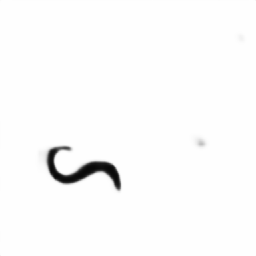

1/1 [==============================] - 0s 39ms/step


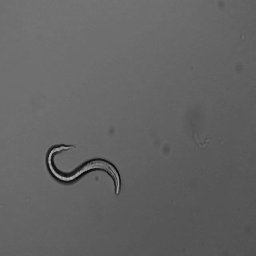

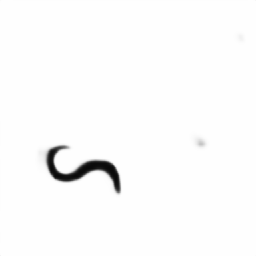

1/1 [==============================] - 0s 53ms/step


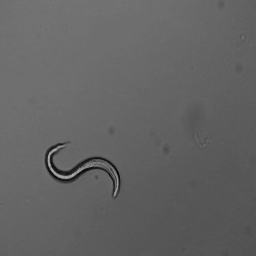

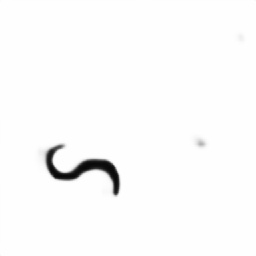

1/1 [==============================] - 0s 34ms/step


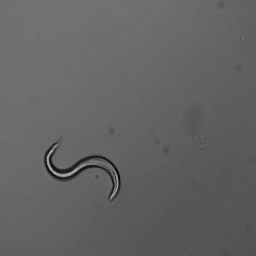

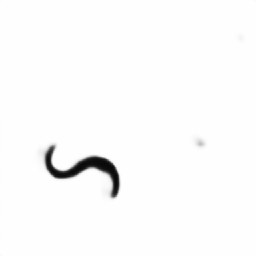

1/1 [==============================] - 0s 56ms/step


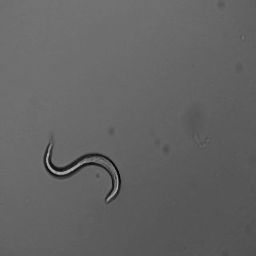

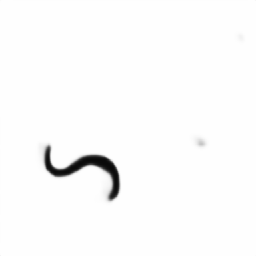

1/1 [==============================] - 0s 31ms/step


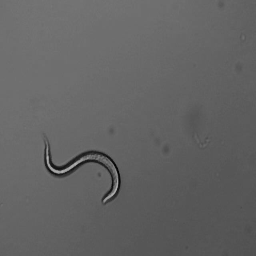

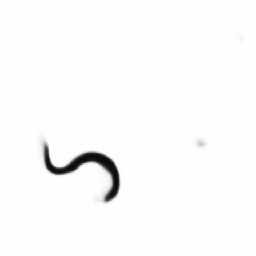

1/1 [==============================] - 0s 29ms/step


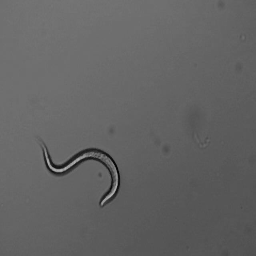

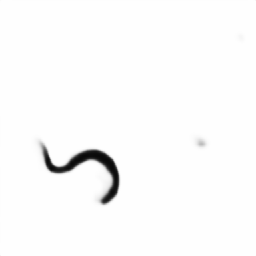

1/1 [==============================] - 0s 31ms/step


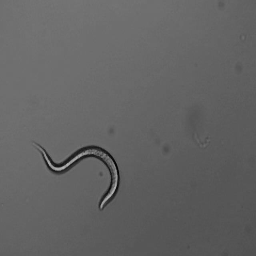

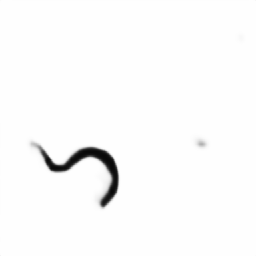

1/1 [==============================] - 0s 32ms/step


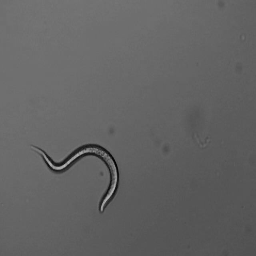

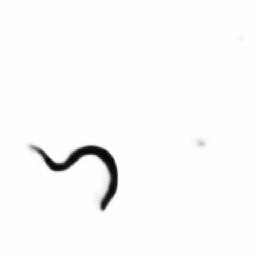

1/1 [==============================] - 0s 33ms/step


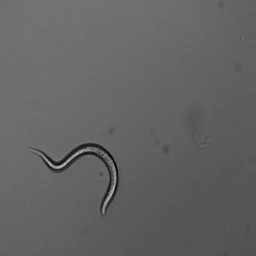

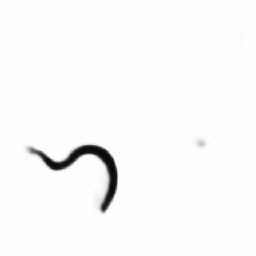

1/1 [==============================] - 0s 30ms/step


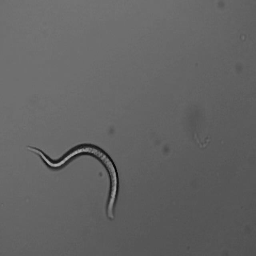

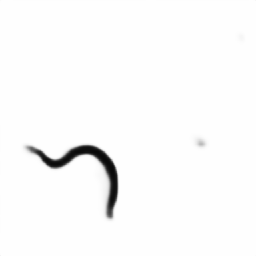

1/1 [==============================] - 0s 31ms/step


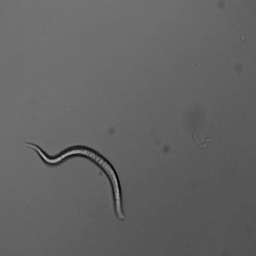

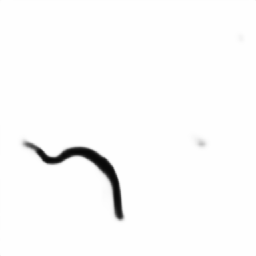

1/1 [==============================] - 0s 30ms/step


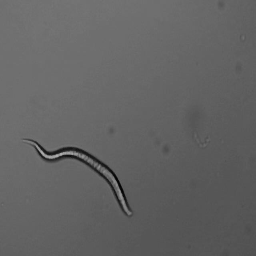

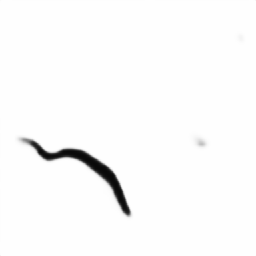

1/1 [==============================] - 0s 28ms/step


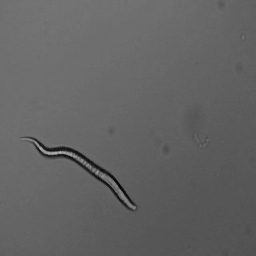

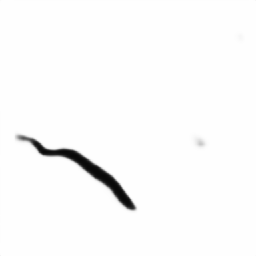

1/1 [==============================] - 0s 30ms/step


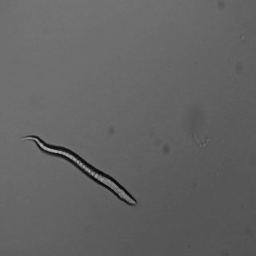

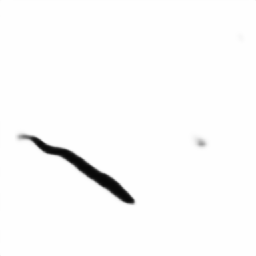

1/1 [==============================] - 0s 28ms/step


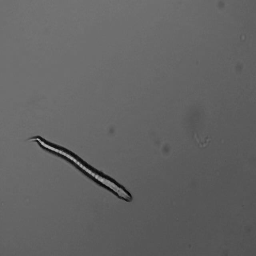

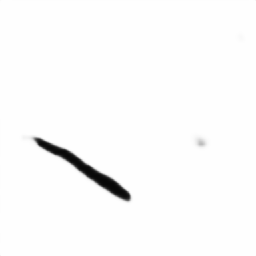

1/1 [==============================] - 0s 37ms/step


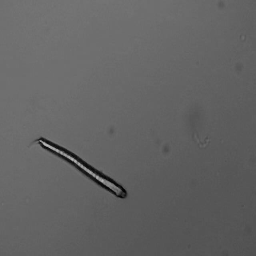

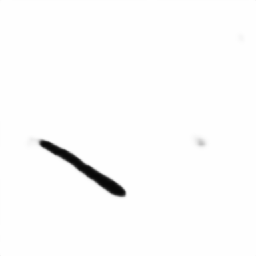

1/1 [==============================] - 0s 29ms/step


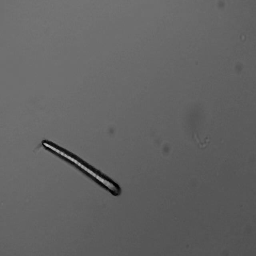

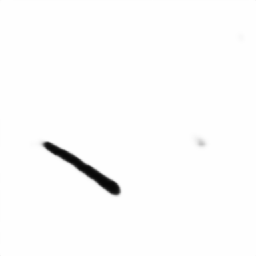

1/1 [==============================] - 0s 31ms/step


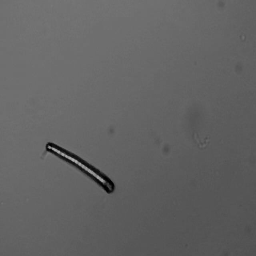

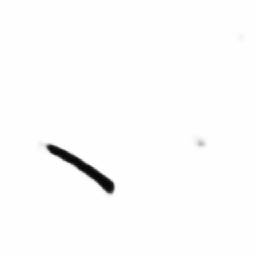

1/1 [==============================] - 0s 31ms/step


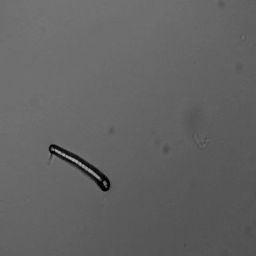

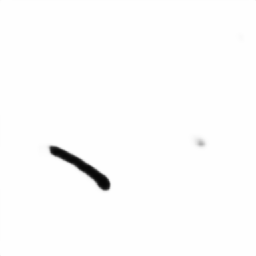

1/1 [==============================] - 0s 49ms/step


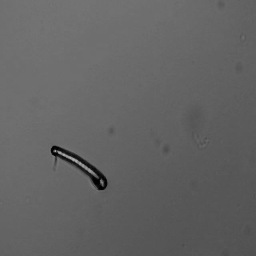

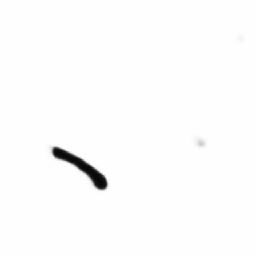

1/1 [==============================] - 0s 31ms/step


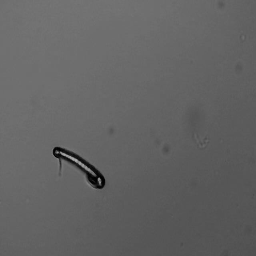

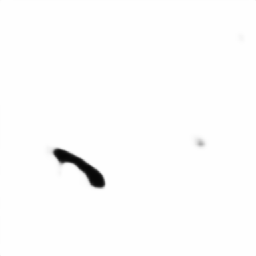

1/1 [==============================] - 0s 29ms/step


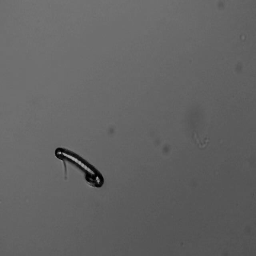

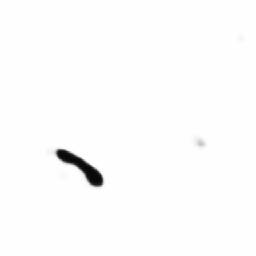

1/1 [==============================] - 0s 33ms/step


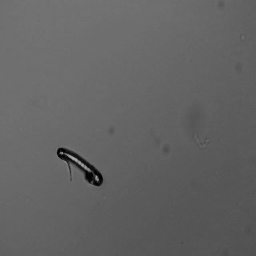

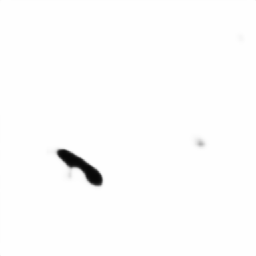

1/1 [==============================] - 0s 27ms/step


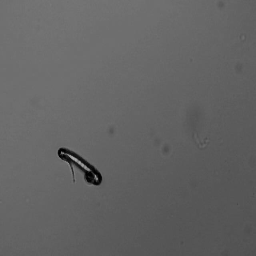

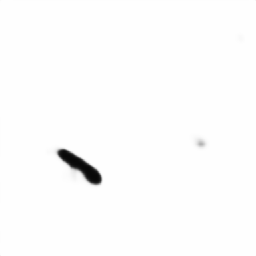

1/1 [==============================] - 0s 28ms/step


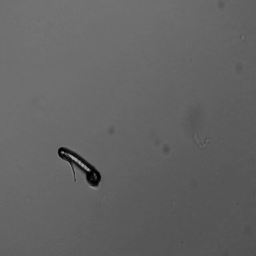

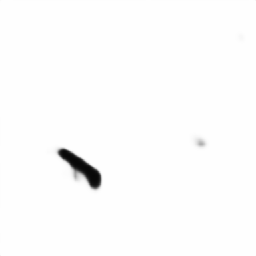

1/1 [==============================] - 0s 29ms/step


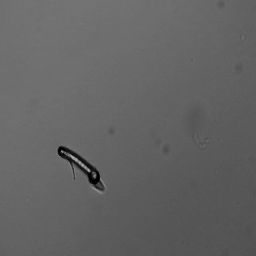

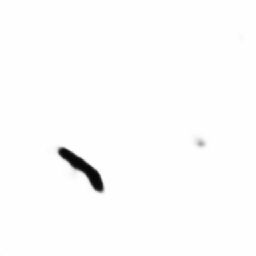

1/1 [==============================] - 0s 28ms/step


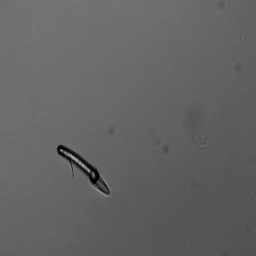

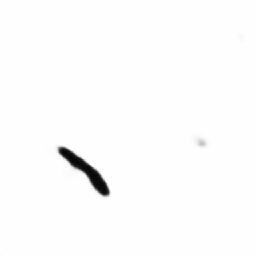

1/1 [==============================] - 0s 29ms/step


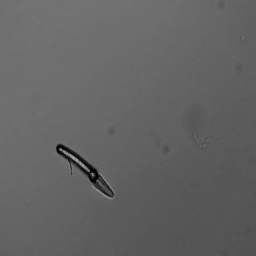

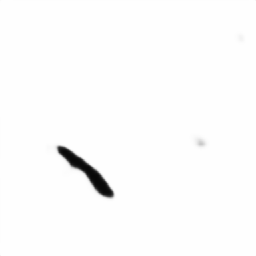

1/1 [==============================] - 0s 40ms/step


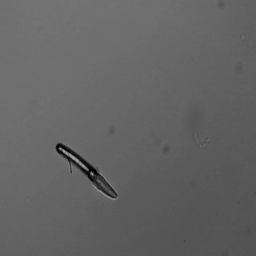

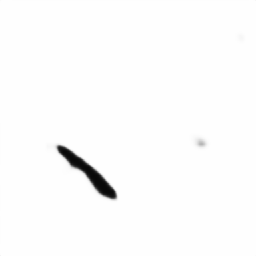

1/1 [==============================] - 0s 32ms/step


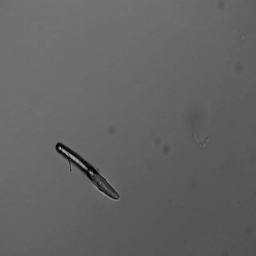

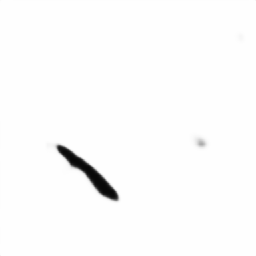

1/1 [==============================] - 0s 35ms/step


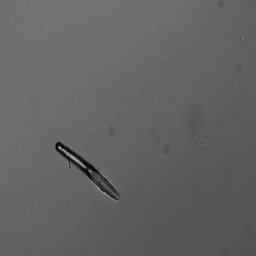

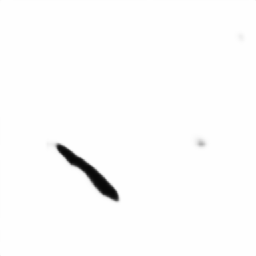

1/1 [==============================] - 0s 46ms/step


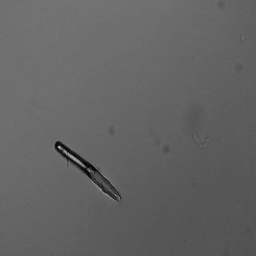

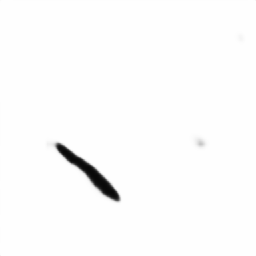

1/1 [==============================] - 0s 27ms/step


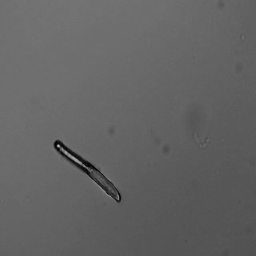

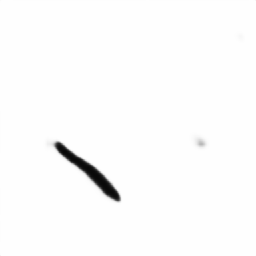

1/1 [==============================] - 0s 27ms/step


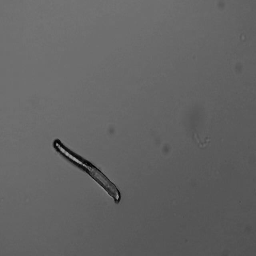

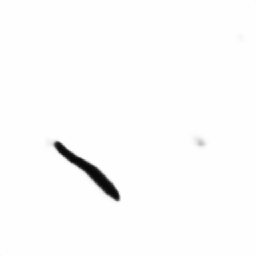

1/1 [==============================] - 0s 28ms/step


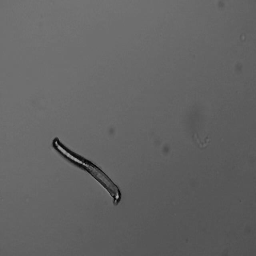

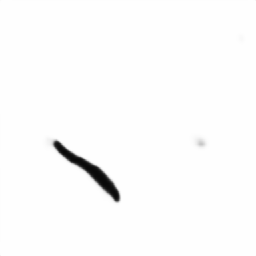

1/1 [==============================] - 0s 37ms/step


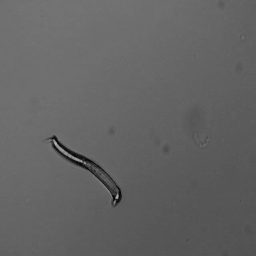

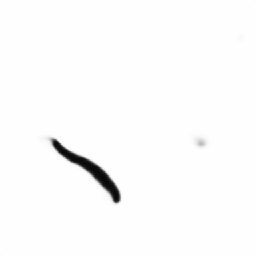

1/1 [==============================] - 0s 33ms/step


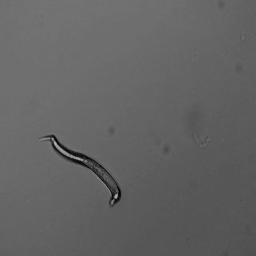

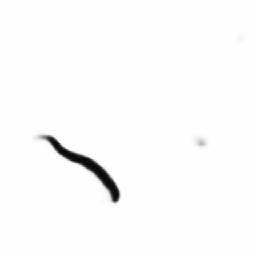

1/1 [==============================] - 0s 31ms/step


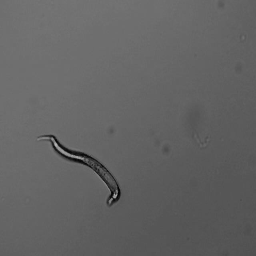

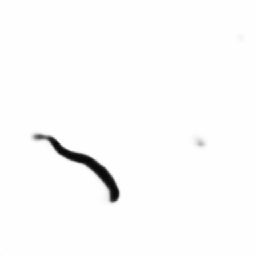

1/1 [==============================] - 0s 31ms/step


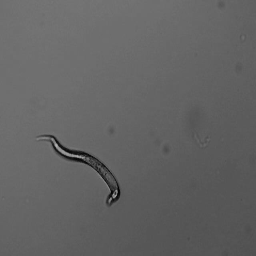

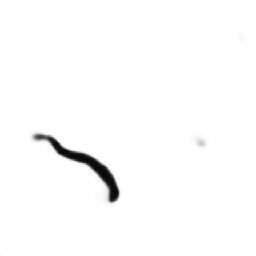

1/1 [==============================] - 0s 33ms/step


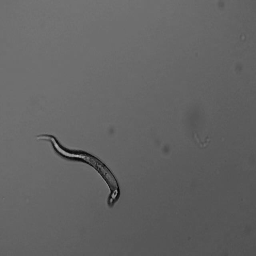

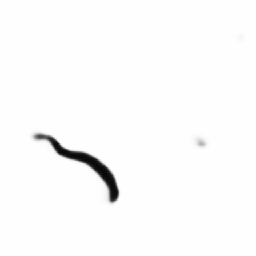

1/1 [==============================] - 0s 31ms/step


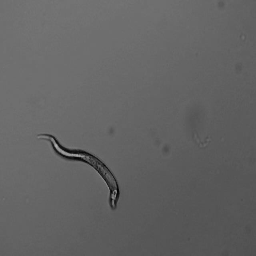

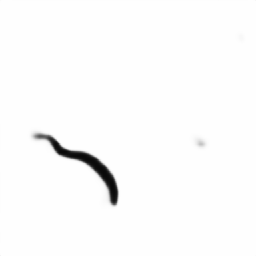

1/1 [==============================] - 0s 33ms/step


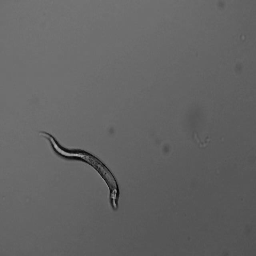

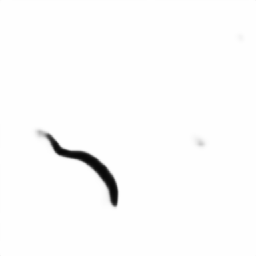

1/1 [==============================] - 0s 28ms/step


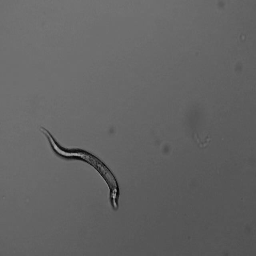

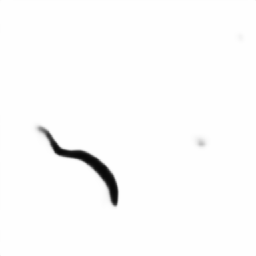

1/1 [==============================] - 0s 30ms/step


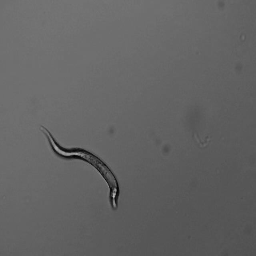

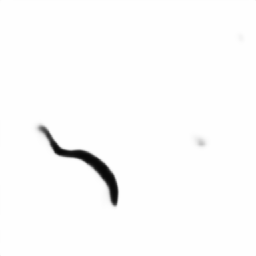

1/1 [==============================] - 0s 28ms/step


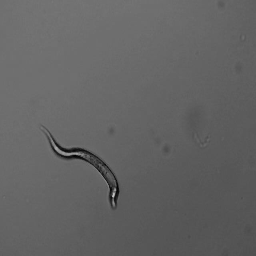

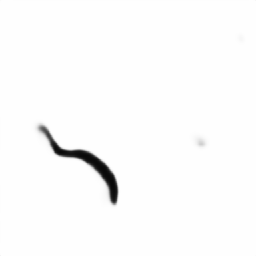

1/1 [==============================] - 0s 30ms/step


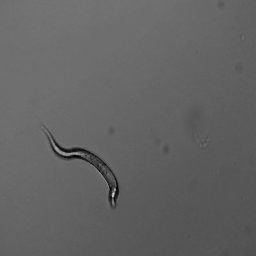

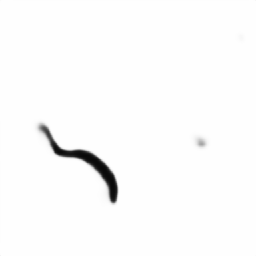

1/1 [==============================] - 0s 31ms/step


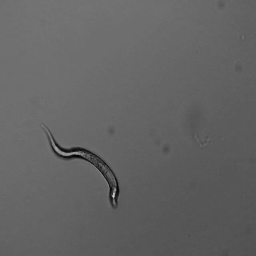

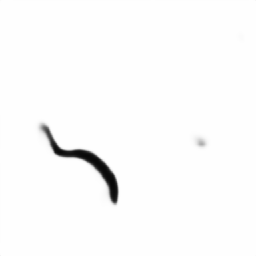

1/1 [==============================] - 0s 32ms/step


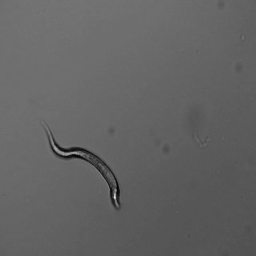

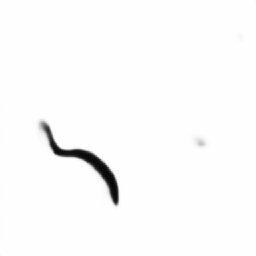

1/1 [==============================] - 0s 27ms/step


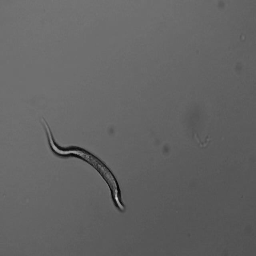

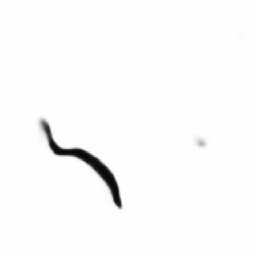

1/1 [==============================] - 0s 32ms/step


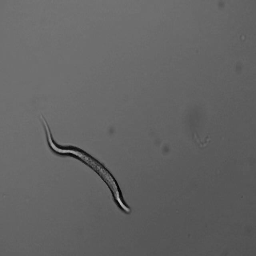

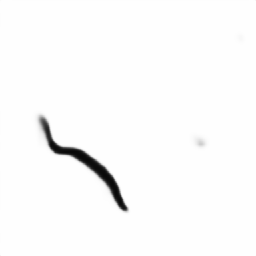

1/1 [==============================] - 0s 26ms/step


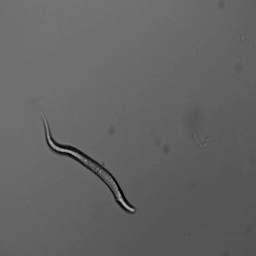

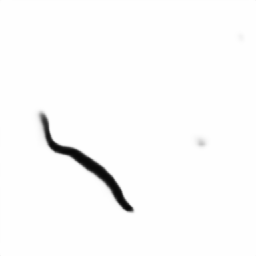

1/1 [==============================] - 0s 28ms/step


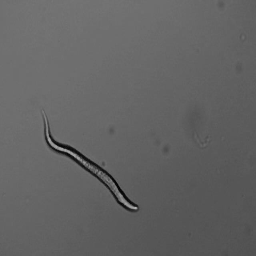

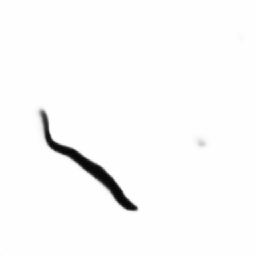

1/1 [==============================] - 0s 28ms/step


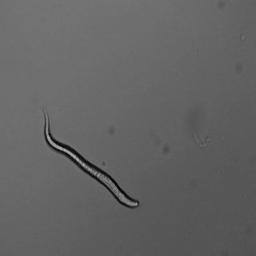

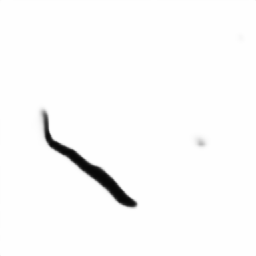

1/1 [==============================] - 0s 27ms/step


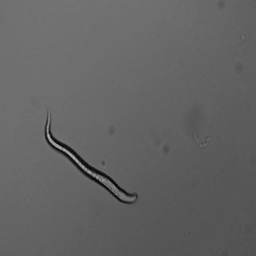

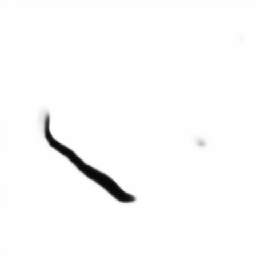

1/1 [==============================] - 0s 28ms/step


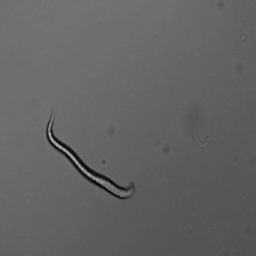

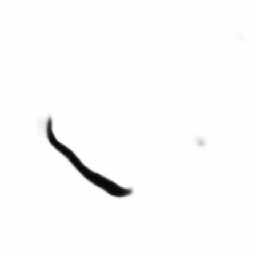

1/1 [==============================] - 0s 28ms/step


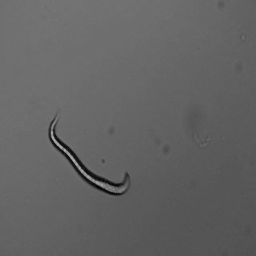

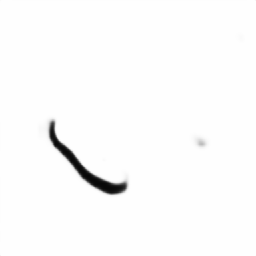

1/1 [==============================] - 0s 30ms/step


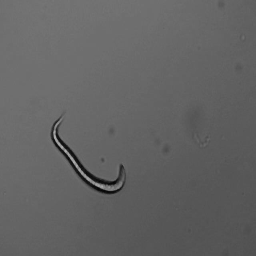

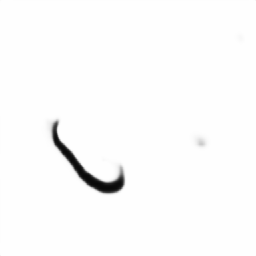

1/1 [==============================] - 0s 28ms/step


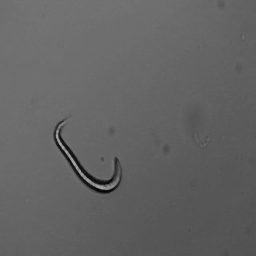

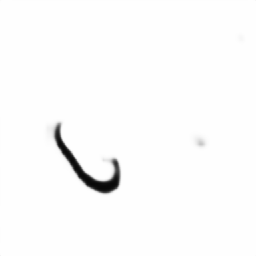

1/1 [==============================] - 0s 28ms/step


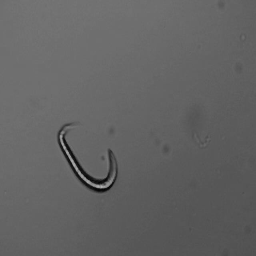

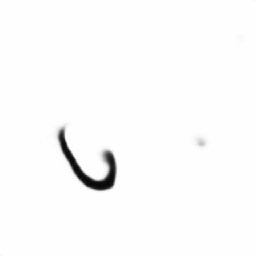

1/1 [==============================] - 0s 29ms/step


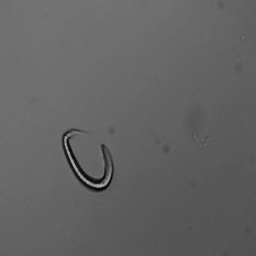

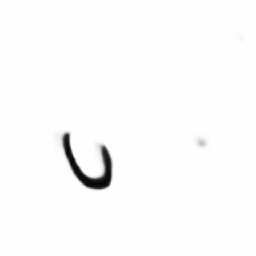

1/1 [==============================] - 0s 29ms/step


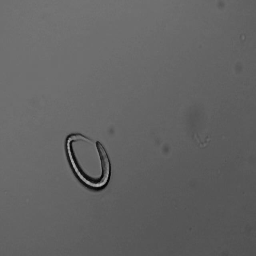

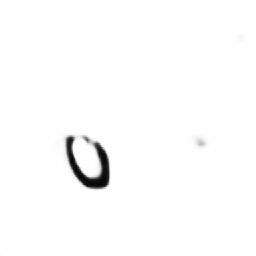

1/1 [==============================] - 0s 27ms/step


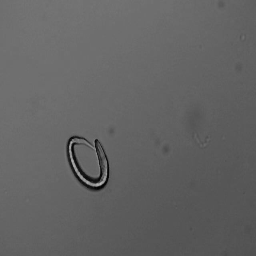

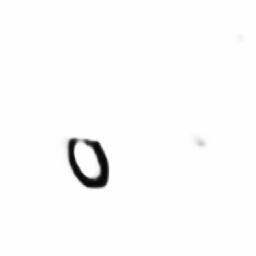

1/1 [==============================] - 0s 27ms/step


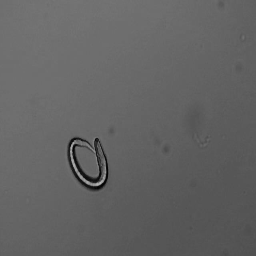

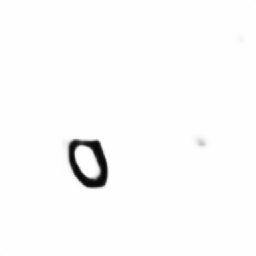

1/1 [==============================] - 0s 37ms/step


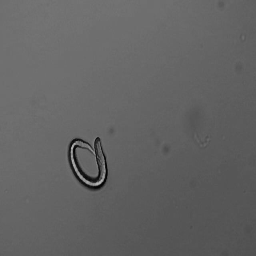

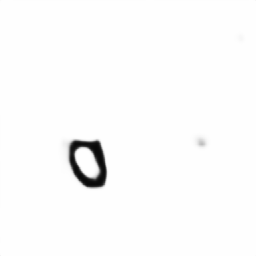

1/1 [==============================] - 0s 27ms/step


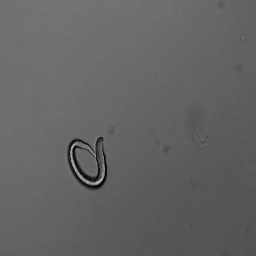

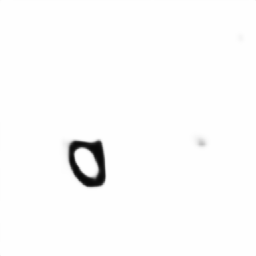

1/1 [==============================] - 0s 28ms/step


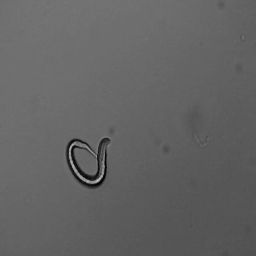

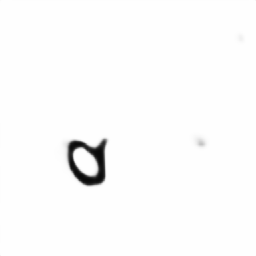

1/1 [==============================] - 0s 27ms/step


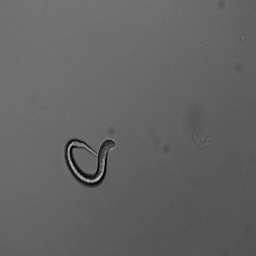

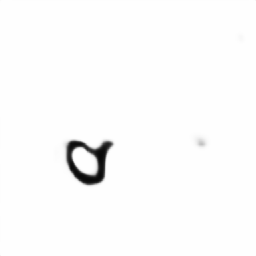

1/1 [==============================] - 0s 40ms/step


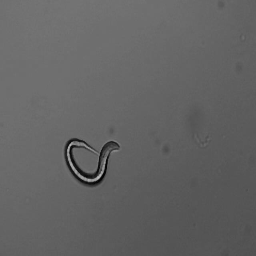

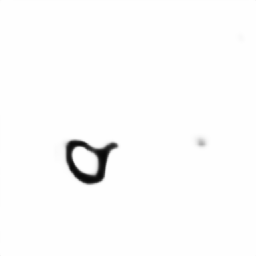

1/1 [==============================] - 0s 44ms/step


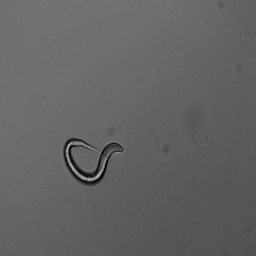

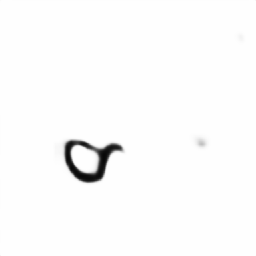

1/1 [==============================] - 0s 29ms/step


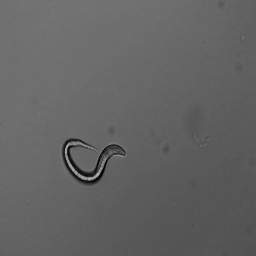

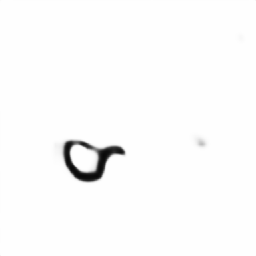

1/1 [==============================] - 0s 27ms/step


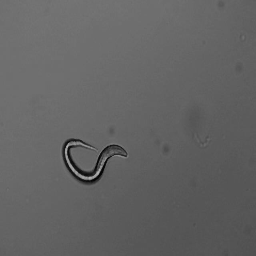

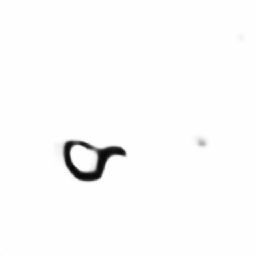

1/1 [==============================] - 0s 29ms/step


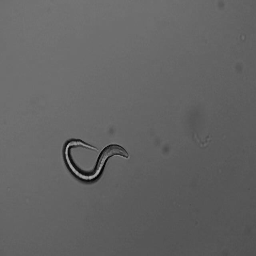

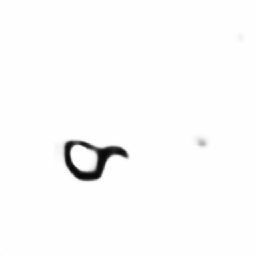

1/1 [==============================] - 0s 30ms/step


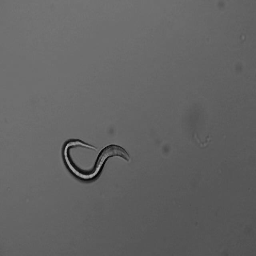

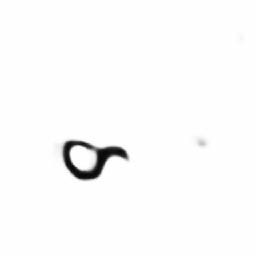

In [43]:
import cv2
from google.colab.patches import cv2_imshow

# Define IMG_SIZE and load your trained model (make sure you have imported the model and defined IMG_SIZE elsewhere)
IMG_SIZE = 256
model = load_model('/content/drive/MyDrive/image_segmentation.model')

video_path = '/content/drive/MyDrive/Video/20220322172908.avi'
video_capture = cv2.VideoCapture(video_path)

while True:
    ret, frame = video_capture.read()

    if not ret:
        break

    frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    frame = cv2.resize(frame, (IMG_SIZE, IMG_SIZE))
    frame = frame / 255.0

    frame_input = frame.reshape(1, IMG_SIZE, IMG_SIZE, 1)
    segmentation_mask = model.predict(frame_input)

    frame_for_display = (frame * 255).astype('uint8')
    segmentation_mask_for_display = (segmentation_mask[0] * 255).astype('uint8')

    cv2_imshow(frame_for_display)
    cv2_imshow(segmentation_mask_for_display)

    # Add a delay to display each frame (e.g., waitKey(1) for a short delay)
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

video_capture.release()
cv2.destroyAllWindows()
